In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as p
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.gridspec import GridSpec
from scipy.stats import pearsonr
from scipy.spatial import distance
# from scipy.spatial
from scipy.stats.mstats import gmean
from sklearn.linear_model import LinearRegression
from statsmodels.nonparametric.smoothers_lowess import lowess 
from skmisc.loess import loess
%matplotlib inline
from itertools import combinations
from itertools import chain
from itertools import product
import statsmodels
from sklearn.manifold import TSNE
import umap

from adjustText import adjust_text

from multiprocessing import Pool
import sys
import os
import copy
sns.set_style('white')
sns.set_style('ticks')
sns.set_color_codes()

# fgm_simulation_path = '/Users/grantkinsler/Documents/Stanford/Research/StarryNight/Git/starry-night/Simulations/FGM_simulation_callable.py'
# sys.path.append(os.path.dirname(os.path.expanduser(fgm_simulation_path)))
# from FGM_simulation_callable import simulation, nball_pull, gaussian_fitness

tools_path = '../code/tools.py'
graphs_path = '../code/graphs.py'
sys.path.append(os.path.dirname(os.path.expanduser(tools_path)))
sys.path.append(os.path.dirname(os.path.expanduser(graphs_path)))
import tools
import graphs
from tools import mutant_colorset
from tools import condition_colorset
from tools import renamed_conditions

In [2]:
cov_thresh = 1e6

# fitness_data = p.read_csv('../data/DoubleBC_Merged_Fitness_Atish_Weighted_Default_AllConditions_IncludingOld_swapsremoved.csv')
fitness_data = p.read_csv('../data/fitness_weighted_allconditions_swapsremoved.csv')
fitness_data = p.read_csv('../data/fitness_weighted_allconditions_swapsremoved_neutral2xpass.csv')

merged_fitness_data = fitness_data

In [3]:
mutant_train_set = p.read_csv('../data/mutant_train_set.csv')
training_bcs = mutant_train_set['barcode'].values

mutant_minimal_train_set = p.read_csv('../data/mutant_minimal_train_set_neutral2xpass.csv')
minimal_training_bcs = mutant_minimal_train_set['barcode'].values

mutant_minimal_test_set = p.read_csv('../data/mutant_minimal_test_set_neutral2xpass.csv')
minimal_testing_bcs = mutant_minimal_test_set['barcode'].values

mutant_minimal_wothers_train_set = p.read_csv('../data/mutant_minimal+otheradaptive_train_set_neutral2xpass.csv')
minimal_wothers_training_bcs = mutant_minimal_wothers_train_set['barcode'].values

mutant_minimal_wothers_test_set = p.read_csv('../data/mutant_minimal+otheradaptive_test_set_neutral2xpass.csv')
minimal_wothers_testing_bcs = mutant_minimal_wothers_test_set['barcode'].values
print(len(minimal_wothers_testing_bcs))

# mutant_justothers_train_set = p.read_csv('../data/mutant_justother_train_set.csv')
# justothers_training_bcs = mutant_justothers_train_set['barcode'].values

# mutant_justothers_test_set = p.read_csv('../data/mutant_justother_test_set.csv')
# justothers_testing_bcs = mutant_justothers_test_set['barcode'].values

75


In [4]:
old_conditions = {
#                   '3':['t3.1','t3.2','t3.3'],
#                   '6':['t6.1','t6.2','t6.3'],
#                   '13':['t13.1','t13.2','t13.3'],
#                   '18':['t18.1','t18.2','t18.3'],
                  '19':['t19.1','t19.2','t19.3'],
#                   '20':['t20.1','t20.2','t20.3'],
#                   '21':['t21.1','t21.2','t21.3'],
#                   '23':['t23.1','t23.2','t23.3'],
                  'M3_Batch_3':['3.1','3.2','3.3'],
                  'M3_Batch_6':['6.1','6.2','6.3'],
                  'M3_Batch_13':['13.1','13.2','13.3'],
                  'M3_Batch_18':['18.1','18.2','18.3'],
#                   'M3_Batch_19':['t19.1','t19.2','t19.3'],
                  'M3_Batch_20':['20.1','20.2','20.3'],
                  'M3_Batch_21':['21.1','21.2','21.3'],
                  'M3_Batch_23':['23.1','23.2','23.3'],
                    ## radicicol
                    ## benomyl
                    ## fluconazole

    
    }

bigbatch_conditions = {
                        '1BB_M3':['A','B','C','D'],
                        '1BB_Baffle':['E','F'],
                        '1BB_1.4%Gluc' :['G','H'],
                        '1BB_1.8%Gluc' :['I','J'],
                        '1BB_0.2MNaCl' :['K','L'],
#                         '1BB_0.2MNaCl' :['K'], 
                        '1BB_0.5MNaCl' :['M','N'],
                        '1BB_0.2MKCl' :['O'],
                        '1BB_0.5MKCl' :['P'],
                        '1BB_8.5uMGdA' :['Q','R'],
                        '1BB_17uMGdA' :['S','T'],
                        '1BB_2ugFlu' :['U','V'],
                        '1BB_0.5ugFlu' :['W','X'],
                        '1BB_1%Raf' :['Y','Z'],
                        '1BB_0.5%Raf' :['AA','BB'],
                        '1BB_1%Gly' :['CC','DD'],
                        '1BB_1%EtOH' :['EE','FF'],
                        '1BB_SucRaf' :['GG'],
                      }



# old_nonm3_conditions = [
# #     '1.4Glucose', '1.6Glucose', '1.7Glucose', '1.8Glucose',
#        '2.5Glucose', '24_Hour_Transfer_PC', 'Benomyl_2ug/mL',
#        'DMSO', 'Ferm_40_Hour_Transfer', 'Ferm_44_Hour_Transfer',
#        'Ferm_50_Hour_Transfer', 'Ferm_54_Hour_Transfer',
#        'Fluconazole_2ug/mL', 'Geldanamycin8.5uM','Radicicol_5uM', 'Resp_5_Day_Transfer',
#        'Resp_7_Day_Transfer']

old_nonm3_conditions = {'Ferm_44hr_Transfer':['t14.1','t14.2','t14.3'],
                  'Ferm_40hr_Transfer':['t15.1','t15.2','t15.3'],
                  'Ferm_54hr_Transfer':['t16.1','t16.2','t16.3'],
                  'Ferm_50hr_Transfer':['t17.1','t17.2','t17.3'],
                  'Resp_24hr_Transfer':['t5.1','t5.2','t5.3'],
                  'Resp_3Day_Transfer':['t7.1','t7.2','t7.3'],
                  'Resp_4Day_Transfer':['t8.1','t8.2','t8.3'],
                  'Resp_5Day_Transfer':['t25.1','t25.2','t25.3'],
                  'Resp_6Day_Transfer':['t26.1','t26.2','t26.3'],
                  'Resp_7Day_Transfer':['t27.1','t27.2','t27.3'],
                  'DMSO':['t1.1','t1.2','t1.3'],
                  'Geldanamycin8.5uM':['t2.4','t2.5','t2.6'],
                    '1.4%':['1.4%-R1','1.4%-R2'],
                    '1.5%':['1.5%-R1','1.5%-R2'],
                    '1.6%':['1.6%-R1','1.6%-R2'],
                    '1.7%':['1.7%-R1','1.7%-R2'],
                    '1.8%':['1.8%-R1','1.8%-R2'],
                    '2.5%':['2.5%-R1','2.5%-R2'],  # not enough usable data
                    'Ben0.4':['Ben0.4-R1','Ben0.4-R2'], # not enough usable data
                    'Ben2':['Ben2-R1','Ben2-R2'], # not enough usable data
#                     'Ben10':['Ben10-R1','Ben10-R2'],
                       }




# m3_conditions = {**old_conditions,}
conditions = {**old_conditions, **bigbatch_conditions}
conditions = {**conditions, **old_nonm3_conditions}
all_conditions = conditions.keys()
all_reps = [rep for reps in conditions.values() for rep in reps]

m3_conditions = list(old_conditions.keys()) + ['1BB_M3']
m3_reps = [rep for condition in m3_conditions for rep in conditions[condition]]



In [5]:
full_neutral_list = [17615,18486,42040,45014,58284,63611,73731,74185,80465,94896
,120600,125697,132511,134852,135750,190551,228237,238783,255561,298344
,308537,316954,317346,335717,411685,454359,469053] 

### from previous list but never has fitness above 3.5% (per gen) in any of 5000bc experiments
supergood_neutral = [17615, 24362, 42040, 71926, 72939, 73802, 80465, 109476, 113483, 
                     134852, 135750, 238783, 263665, 276406, 316954, 335717, 454359] 

### pulled from supergood list and spiked into 1BigBatch experiments
neutral_spikes = [17615,24362,42040,71926,73802,109476,113483,134852,263665,316954]

# neutrals = full_neutral_list
neutrals = list(np.unique(full_neutral_list+supergood_neutral+neutral_spikes))

In [6]:
this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
# this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()

this_data = this_data.sort_values('barcode')

m3_cols = [col + '_fitness' for col in m3_conditions]
m3_conditions = m3_cols

nonm3_cols= [col + '_fitness' for col in bigbatch_conditions.keys() if (col + '_fitness') not in m3_cols]
nonm3_cols = nonm3_cols + [col + '_fitness' for col in old_nonm3_conditions.keys()]
nonm3_conditions = nonm3_cols

fitness_cols = m3_cols + nonm3_cols

fitness = this_data[fitness_cols].values

n_mutants = fitness.shape[0]
n_conditions = fitness.shape[1]


In [7]:
this_data[this_data['barcode'].isin(minimal_wothers_testing_bcs)]

,barcode,gene,type,ploidy,class,additional_muts,1.4%-R1_error,1.4%-R1_fitness,1.4%-R2_error,1.4%-R2_fitness,...,1BB_1%Raf_error,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type
1,151,IRA1,stop_gained,Haploid,PKA,SEH1-missense_variant; ZIP1-missense_variant; ...,0.036983,1.465944,0.037611,1.643355,...,0.042757,0.993474,0.017607,1.013754,0.023293,0.667971,0.017206,0.566747,0.050538,IRA1_nonsense
8,689,IRA1,frameshift_variant,Haploid,PKA,RPL19A-upstream_point_variant,0.045780,0.847187,0.055017,1.094057,...,0.042973,0.981290,0.018312,1.065145,0.024688,0.654502,0.023860,0.478547,0.055007,IRA1_nonsense
15,1617,PDE2,frameshift_variant,Haploid,PKA,RIF1-upstream_indel_variant,0.042769,0.689349,0.049141,0.733807,...,0.042906,0.812613,0.017978,0.750983,0.023708,0.372185,0.019429,0.454074,0.051876,PDE2
18,1866,PDE2,stop_gained,Haploid,PKA,None,0.053028,0.596218,0.065609,0.803640,...,0.043068,0.797834,0.018603,0.751161,0.024740,0.349330,0.023328,0.391563,0.055138,PDE2
23,2608,GPB1,frameshift_variant,Haploid,PKA,OSH2-missense_variant,0.079983,0.559254,0.108676,0.692651,...,0.045016,0.473013,0.021290,0.321442,0.027342,0.237835,0.025093,0.217868,0.058379,GPB1
26,2808,Diploid,Diploid,Diploid,Diploid,CDC39-missense_variant,0.057123,0.511376,0.070386,0.644117,...,0.048188,0.382205,0.022421,0.447378,0.026381,0.468849,0.022580,0.369957,0.064169,Diploid_adaptive
31,3406,IRA2,missense_variant,Haploid,PKA,YLR157W-D-frameshift_variant,0.139491,1.023967,0.186785,1.174108,...,0.090593,0.628858,0.076872,0.673110,0.095415,0.474047,0.205071,0.316905,0.258483,IRA2
33,3577,Diploid + IRA2,missense_variant,Diploid,Adaptive Diploid,None,0.095273,0.438673,0.111319,0.621509,...,0.059508,0.076298,0.030567,0.189201,0.037433,0.335693,0.029206,0.217186,0.079565,Diploid + IRA2
40,4791,Diploid,Diploid,Diploid,Diploid,tL(CAA)G3-upstream_point_variant,0.047933,0.874265,0.056568,0.929685,...,0.047049,0.445281,0.021949,0.499881,0.026401,0.704311,0.020641,0.366543,0.063207,Diploid_adaptive
42,5564,Diploid + IRA2,stop_gained,Diploid,Adaptive Diploid,None,0.047392,0.890435,0.055076,1.134013,...,0.043884,0.772374,0.019164,0.820202,0.024321,0.715903,0.019157,0.559208,0.058226,Diploid + IRA2


In [8]:
unis = np.unique(this_data[this_data['barcode'].isin(minimal_wothers_training_bcs)]['mutation_type'],return_counts=True)
print(np.sum(unis[1]))
[(a,b) for a,b in zip(unis[0],unis[1])]


36


[('CYR1', 1),
 ('Diploid', 4),
 ('Diploid + Chr11Amp', 1),
 ('Diploid + IRA2', 1),
 ('Diploid_adaptive', 4),
 ('GPB1', 2),
 ('GPB2', 4),
 ('IRA1_missense', 4),
 ('IRA1_nonsense', 4),
 ('IRA2', 4),
 ('PDE2', 4),
 ('other_adaptive', 3)]

In [9]:
unis = np.unique(this_data[this_data['barcode'].isin(minimal_wothers_testing_bcs)]['mutation_type'],return_counts=True)
print(np.sum(unis[1]))
[(a,b) for a,b in zip(unis[0],unis[1])]

75


[('CYR1', 2),
 ('Diploid', 10),
 ('Diploid + Chr11Amp', 2),
 ('Diploid + Chr12Amp', 1),
 ('Diploid + IRA1', 1),
 ('Diploid + IRA2', 2),
 ('Diploid_adaptive', 7),
 ('ExpNeutral', 3),
 ('GPB1', 2),
 ('GPB2', 10),
 ('IRA1_missense', 5),
 ('IRA1_nonsense', 10),
 ('IRA2', 4),
 ('KOG1', 1),
 ('PDE2', 7),
 ('RAS2', 1),
 ('SCH9', 1),
 ('TFS1', 1),
 ('TOR1', 1),
 ('other_adaptive', 4)]

Sort conditions by the similarity to average M3 condition. 

In order to ensure that some mutants (i.e. Diploids) don't weigh more than other mutant types in this calculation, we down weight mutant contribution by the number of representatives. 

In [10]:
used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]



In [11]:
this_data[this_data['barcode'].isin(used_mutants)]

,barcode,gene,type,ploidy,class,additional_muts,1.4%-R1_error,1.4%-R1_fitness,1.4%-R2_error,1.4%-R2_fitness,...,1BB_1%Raf_error,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type
1,151,IRA1,stop_gained,Haploid,PKA,SEH1-missense_variant; ZIP1-missense_variant; ...,0.036983,1.465944,0.037611,1.643355,...,0.042757,0.993474,0.017607,1.013754,0.023293,0.667971,0.017206,0.566747,0.050538,IRA1_nonsense
3,273,IRA1,frameshift_variant,Haploid,PKA,None,0.038140,0.861384,0.039921,0.996668,...,0.042864,0.767018,0.017945,0.789914,0.023688,0.448947,0.019036,0.424815,0.051958,IRA1_nonsense
5,415,IRA1,frameshift_variant,Haploid,PKA,None,0.049059,0.933788,0.063430,1.129407,...,0.042814,0.877220,0.017811,0.957795,0.023695,0.353242,0.021149,0.387105,0.051755,IRA1_nonsense
8,689,IRA1,frameshift_variant,Haploid,PKA,RPL19A-upstream_point_variant,0.045780,0.847187,0.055017,1.094057,...,0.042973,0.981290,0.018312,1.065145,0.024688,0.654502,0.023860,0.478547,0.055007,IRA1_nonsense
15,1617,PDE2,frameshift_variant,Haploid,PKA,RIF1-upstream_indel_variant,0.042769,0.689349,0.049141,0.733807,...,0.042906,0.812613,0.017978,0.750983,0.023708,0.372185,0.019429,0.454074,0.051876,PDE2
18,1866,PDE2,stop_gained,Haploid,PKA,None,0.053028,0.596218,0.065609,0.803640,...,0.043068,0.797834,0.018603,0.751161,0.024740,0.349330,0.023328,0.391563,0.055138,PDE2
20,2039,Diploid + IRA2,frameshift_variant,Diploid,Adaptive Diploid,ACF2-missense_variant,0.052151,0.797925,0.059446,0.910564,...,0.057262,0.102897,0.030974,0.358454,0.034746,0.149989,0.040005,0.045370,0.098489,Diploid + IRA2
21,2288,GPB2,stop_gained,Haploid,PKA,TAF9-upstream_point_variant; SHE3-missense_var...,0.048919,0.974695,0.061643,0.862864,...,0.043637,0.691820,0.018954,0.659011,0.024553,0.399018,0.021870,0.329422,0.056045,GPB2
23,2608,GPB1,frameshift_variant,Haploid,PKA,OSH2-missense_variant,0.079983,0.559254,0.108676,0.692651,...,0.045016,0.473013,0.021290,0.321442,0.027342,0.237835,0.025093,0.217868,0.058379,GPB1
24,2768,GPB2,stop_gained,Haploid,PKA,DUS1-missense_variant,0.038893,0.923215,0.041464,1.026574,...,0.043176,0.611042,0.018561,0.667739,0.024133,0.411149,0.020008,0.273379,0.054647,GPB2


([<matplotlib.axis.YTick at 0x1197c5dd8>,
 <a list of 6 Text yticklabel objects>)

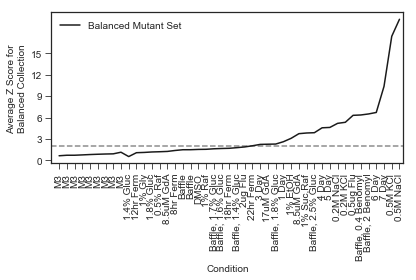

In [12]:
used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]
used_mutants = [bc for bc in this_data['barcode'].values]

all_mut_locs = sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))

types = np.unique(this_data['mutation_type'].values[all_mut_locs])
counts = np.unique(this_data['mutation_type'].values[all_mut_locs],return_counts=True)

like_mutant_count_dict = {mut_type:count for mut_type,count in zip(*counts)}

exceptions = {'adaptive_other':1,'Diploid_adaptive':1}
exceptions = {'adaptive_other':1}
exceptions = {}
like_mutant_count_dict = {mut_type:(like_mutant_count_dict[mut_type] if mut_type not in exceptions.keys() else exceptions[mut_type]) for mut_type in types}

like_mutant_count = [like_mutant_count_dict[mut_type] for mut_type in this_data['mutation_type'].values[all_mut_locs]]
like_mutant_count_m3 = np.repeat(like_mutant_count,len(m3_cols)).reshape(len(like_mutant_count),len(m3_cols))
like_mutant_count_nonm3 = np.repeat(like_mutant_count,len(nonm3_cols)).reshape(len(like_mutant_count),len(nonm3_cols))     
# rel_mutant_count_m3 = 

m3_means = np.nanmean(this_data[m3_cols].values[all_mut_locs,:],axis=1)
m3_stds = np.nanstd(this_data[m3_cols].values[all_mut_locs,:],axis=1)

repeated_means = np.repeat(m3_means,len(nonm3_cols)).reshape(len(m3_means),len(nonm3_cols))
repeated_stds = np.repeat(m3_stds,len(nonm3_cols)).reshape(len(m3_stds),len(nonm3_cols))
nonm3_z_scores = np.abs((this_data[nonm3_cols].values[all_mut_locs,:]-repeated_means)/repeated_stds)

repeated_means = np.repeat(m3_means,len(m3_cols)).reshape(len(m3_means),len(m3_cols))
repeated_stds = np.repeat(m3_stds,len(m3_cols)).reshape(len(m3_stds),len(m3_cols))
m3_z_scores = np.abs((this_data[m3_cols].values[all_mut_locs,:]-repeated_means)/repeated_stds)

mean_m3_z_scores = np.sum(m3_z_scores/like_mutant_count_m3,axis=0)/len(counts[0])
mean_nonm3_z_scores = np.sum(nonm3_z_scores/like_mutant_count_nonm3,axis=0)/len(counts[0])

plt.figure()

sorted_nonm3_cols = np.asarray(nonm3_cols)[np.argsort(np.sum(nonm3_z_scores/like_mutant_count_nonm3,axis=0)/len(counts[0]))]
sorted_m3_cols = np.asarray(m3_cols)[np.argsort(np.sum(m3_z_scores/like_mutant_count_m3,axis=0)/len(counts[0]))]

sorted_mean_m3_z_scores = sorted(np.sum(m3_z_scores/like_mutant_count_m3,axis=0)/len(counts[0]))
sorted_mean_nonm3_z_scores = sorted(np.sum(nonm3_z_scores/like_mutant_count_nonm3,axis=0)/len(counts[0]))

plt.plot(sorted_mean_m3_z_scores+sorted_mean_nonm3_z_scores,'-',color='k',alpha=1.0,label='Balanced Mutant Set')

all_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols)
plt.xticks(range(len(all_cols)),[renamed_conditions[col.split('_fitness')[0]] for col in (all_cols)],rotation=90)


plt.legend()
# plt.ylim(0,7)
plt.xlim(-1,len(m3_conditions)+len(nonm3_conditions)-0.5)
plt.ylabel('Average Z Score for\nBalanced Collection')
plt.xlabel('Condition')

plt.tight_layout()
plt.axhline(2,color='k',linestyle='--',alpha=0.5)
plt.yticks(range(0,16,3),range(0,16,3))
# plt.savefig('z_scores_minimal_comparison.pdf',bbox_inches='tight')

In [13]:
gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid']

mean_std_bygene = {}
for gene in gene_list:
    
    used_mutants = [bc for bc in this_data[this_data['mutation_type']==gene]['barcode'].values]
    this_gene_locs =sorted(list(np.where(np.isin(this_data['barcode'].values,used_mutants))[0]))
    
    m3_means = np.nanmean(this_data[m3_cols].values[this_gene_locs,:],axis=1)
    m3_stds = np.nanstd(this_data[m3_cols].values[this_gene_locs,:],axis=1)

    mean_std_bygene[gene] = [np.mean(m3_means),np.mean(m3_stds)]

In [14]:
mean_std_bygene

{'Diploid': [0.31804838541841196, 0.11169862418287552],
 'GPB2': [0.7972104922807641, 0.07065511413906127],
 'IRA1_nonsense': [1.035099261972546, 0.09929193124585575],
 'PDE2': [0.695882192535215, 0.08064185191126945]}

In [15]:
sns.set_style('dark')
sns.set_style('ticks')
plt.style.use('dark_background')

['23.1_fitness', '23.2_fitness', '23.3_fitness', 't19.1_fitness', 't19.2_fitness', 't19.3_fitness', '18.1_fitness', '18.2_fitness', '18.3_fitness', '20.1_fitness', '20.2_fitness', '20.3_fitness', '3.1_fitness', '3.2_fitness', '3.3_fitness', '13.1_fitness', '13.2_fitness', '13.3_fitness', '6.1_fitness', '6.2_fitness', '6.3_fitness', 'A_fitness', 'B_fitness', 'C_fitness', 'D_fitness', '21.1_fitness', '21.2_fitness', '21.3_fitness', 'G_fitness', 'H_fitness', 't14.1_fitness', 't14.2_fitness', 't14.3_fitness', 'CC_fitness', 'DD_fitness', 'I_fitness', 'J_fitness', 'AA_fitness', 'BB_fitness', 't2.4_fitness', 't2.5_fitness', 't2.6_fitness', 't15.1_fitness', 't15.2_fitness', 't15.3_fitness', 'E_fitness', 'F_fitness', '1.5%-R1_fitness', '1.5%-R2_fitness', 't1.1_fitness', 't1.2_fitness', 't1.3_fitness', 'Y_fitness', 'Z_fitness', '1.7%-R1_fitness', '1.7%-R2_fitness', '1.6%-R1_fitness', '1.6%-R2_fitness', 't17.1_fitness', 't17.2_fitness', 't17.3_fitness', '1.4%-R1_fitness', '1.4%-R2_fitness', 'U_fi

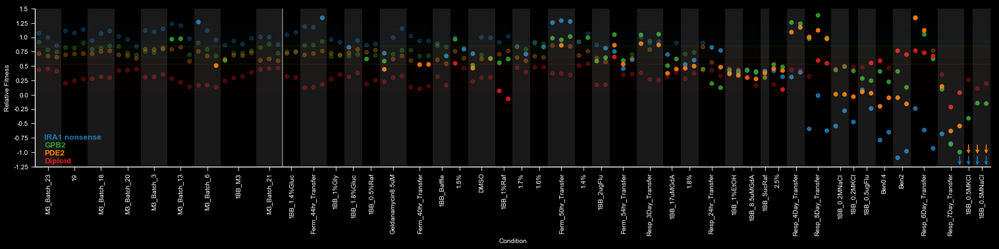

In [16]:
# print([col for col in this_data.columns])
m3_rep_cols = []
m3_rep_conds = []
for col in sorted_m3_cols:
    
    actual_cols = [col+'_fitness' for col in conditions[col.replace('_fitness','')] if col+'_fitness' in this_data]
    m3_rep_cols = m3_rep_cols + actual_cols
    for rep in actual_cols:
        m3_rep_conds.append(col)
        
# m3_rep_cols = [col+'_fitness' for col in m3_rep_cols if col+'_fitness' in this_data]

nonm3_rep_cols = []
nonm3_rep_conds = []
for col in sorted_nonm3_cols:
    actual_cols = [col+'_fitness' for col in conditions[col.replace('_fitness','')] if col+'_fitness' in this_data]


    nonm3_rep_cols = nonm3_rep_cols + actual_cols
    for rep in actual_cols:
        nonm3_rep_conds.append(col)
        
# nonm3_rep_cols = [col+'_fitness' for col in nonm3_rep_cols if col+'_fitness' in this_data]


m3_conditions = sorted_m3_cols
nonm3_conditions = sorted_nonm3_cols

fig = plt.figure(figsize=(30,6))
gs = GridSpec(2, 2, width_ratios=[8, 1], height_ratios=[2, 6],hspace=0.04,wspace=0.05)


axB = fig.add_subplot(gs[2])
sns.despine(ax=axB)
gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid']
graphs.fitness_tubes_graph_replicates(axB,this_data,mean_std_bygene,this_data['barcode'].values,m3_rep_cols,nonm3_rep_cols,m3_rep_conds,nonm3_rep_conds,gene_list,
                                      side_bars=False,faded_alpha=0.8,style='dark')

ymin = -1.25
ymax = 1.5

# plt.text(s='B',x=-0.1,y=1.02,fontsize=15,fontweight='semibold',transform=axB.transAxes)



# plt.savefig('Figure3_allconditions_error_in_mean.pdf',bbox_inches='tight')
# plt.savefig('Figure3_allconditions_originalnames.pdf',bbox_inches='tight')
plt.savefig('talk_figures/Figure3_supplement_allreplicates.pdf',bbox_inches='tight')







/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/figure.py:2267: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


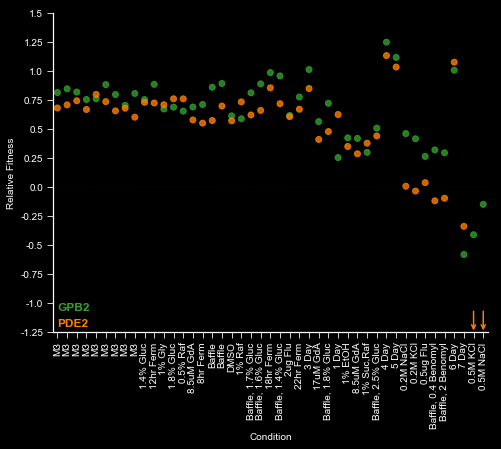

In [103]:
m3_conditions = sorted_m3_cols
nonm3_conditions = sorted_nonm3_cols



for gene in gene_list:
    fig = plt.figure(figsize=(8+1,6+2))
    gs = GridSpec(2, 2, width_ratios=[8, 1], height_ratios=[2, 6],hspace=0.04,wspace=0.05)

    # axA = fig.add_subplot(gs[0])
    # sns.despine(ax=axA)
    # graphs.zscore_graph(axA,sorted_mean_m3_z_scores,sorted_mean_nonm3_z_scores,sorted_m3_cols,sorted_nonm3_cols,ymax=21)

    ## need to add labels
    # plt.annotate()

    # plt.text(s='A',x=-0.1,y=1.02,fontsize=15,fontweight='semibold',transform=axA.transAxes)



    axB = fig.add_subplot(gs[2])
    sns.despine(ax=axB)
    gene_list = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid']
    gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid']
    gene_list = ['GPB2','PDE2']
    
#     gene_list = [gene]
    graphs.fitness_tubes_graph(axB,this_data,mean_std_bygene,this_data['barcode'].values,m3_conditions,nonm3_conditions,gene_list,
                               side_bars=False,faded_alpha=0.8,vline=False,tubes=False,eye_guides=False)

    ymin = -1.25
    ymax = 1.5

    # plt.text(s='B',x=-0.1,y=1.02,fontsize=15,fontweight='semibold',transform=axB.transAxes)

#     axB_kde = fig.add_subplot(gs[3])   
#     sns.despine(ax=axB_kde)
#     for gene in gene_list:
#         this_gene_data = this_data[this_data['mutation_type']==gene]
#         data = np.mean(np.asarray([this_gene_data[col].values for col in (list(sorted_m3_cols) + list(sorted_nonm3_cols))]),axis=1)
#     #     data = np.median(np.asarray([this_gene_data[col].values for col in (list(m3_conditions))]),axis=1)


#         sns.distplot(data,color=tools.mutant_colorset[gene],vertical=True,hist=False,kde_kws={'shade':False})

#         kde = statsmodels.nonparametric.kde.KDEUnivariate(data)
#         kde.fit()
#         y = kde.support
#         x = kde.density

#         mean = mean_std_bygene[gene][0]
#         twosigma_top = mean_std_bygene[gene][0]+2*mean_std_bygene[gene][1]
#         twosigma_bottom = mean_std_bygene[gene][0]-2*mean_std_bygene[gene][1]

#         x_loc_top = np.where(y<twosigma_top)[0][-1]
#         x_loc_bottom = np.where(y<twosigma_bottom)[0][-1]
#     #     x_loc_bottom = np.where(y>twosigma_bottom)[0][0]
#         x_loc_top = np.where(y>twosigma_top)[0][0]
#     #     sns.distplot(data,color=tools.mutant_colorset[gene],vertical=True,hist=True,kde_kws={'shade':False})

#         axB_kde.fill_betweenx(y[x_loc_bottom:x_loc_top], 0, x[x_loc_bottom:x_loc_top],alpha=0.5,color=tools.mutant_colorset[gene])
#         plt.ylim(-1.25,1.5)


#         plt.yticks(np.linspace(ymin,ymax,12),['' for i in np.linspace(ymin,ymax,12)])
#         axB_kde.xaxis.set_visible(False)
#         axB_kde.spines['bottom'].set_visible(False)

    plt.tight_layout() # only off when tight layout is used - might need to annotate afterwards


        # plt.savefig('Figure3_allconditions_error_in_mean.pdf',bbox_inches='tight')
        # plt.savefig('Figure3_allconditions_originalnames.pdf',bbox_inches='tight')
        # plt.savefig('Figure3_allconditions_biologicalerror_resorted.pdf',bbox_inches='tight')
#         plt.savefig(f'talk_figures/Figure3_allconditions_moreneutrals2_notop_{gene}.pdf',bbox_inches='tight')
    plt.savefig(f'talk_figures/Figure3_allconditions_moreneutrals2_notop_gbp2pde2.pdf',bbox_inches='tight')




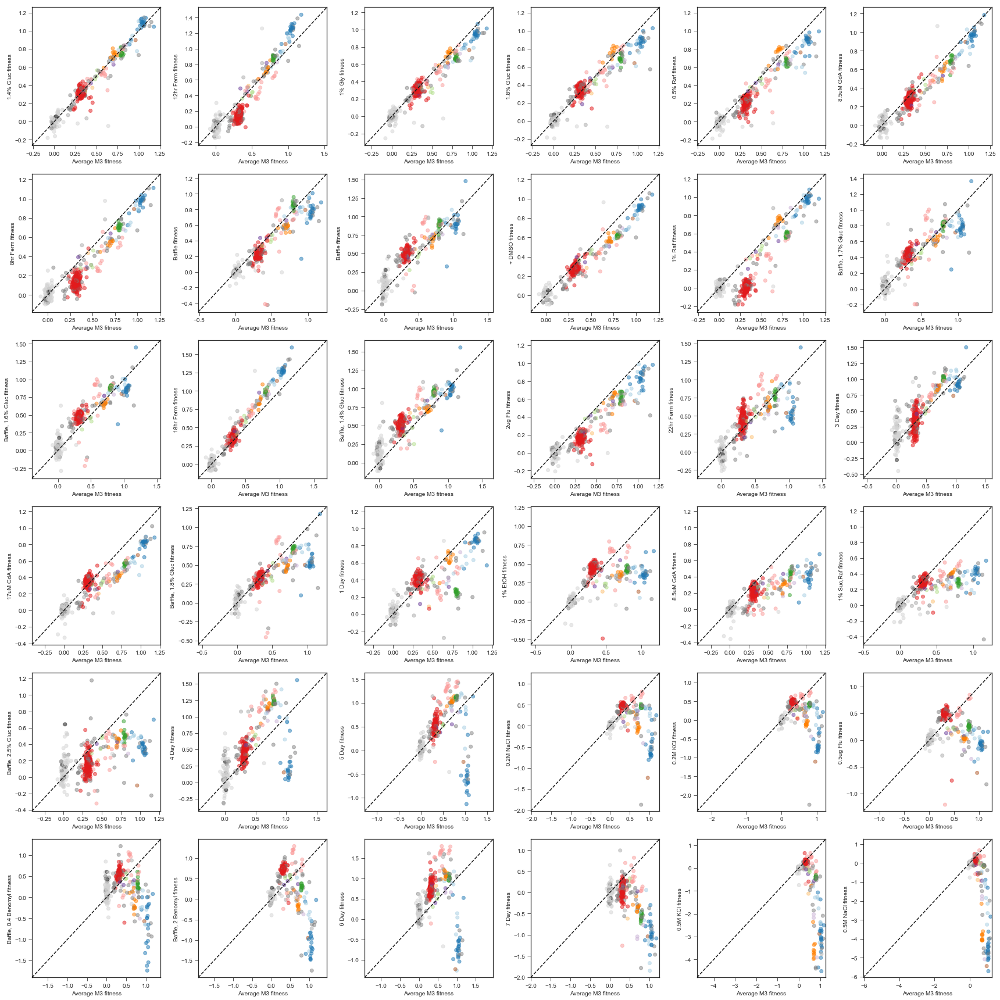

In [20]:
m3_average = np.mean(this_data[sorted_m3_cols].values,axis=1)

plt.figure(figsize=(6*4,6*4))
# plt.figure(figsize=(6,6))

for c,condition in enumerate(sorted_nonm3_cols):
    
    plt.subplot(6,6,c+1)
    plt.scatter(m3_average,this_data[condition].values,
                color=[mutant_colorset[gene] for gene in this_data['mutation_type'].values],
                alpha=0.5)
    
    ymin,ymax = plt.ylim()
    xmin,xmax = plt.xlim()
    
    allmin = min([xmin,ymin])
    allmax = max([xmax,ymax])
    
    plt.ylim(allmin,allmax)
    plt.xlim(allmin,allmax)
    
    plt.plot([allmin,allmax],[allmin,allmax],'k--')
    
    plt.xlabel('Average M3 fitness')
    plt.ylabel(f'{renamed_conditions[condition.replace("_fitness","")]} fitness')
plt.tight_layout()
plt.savefig('average_m3_vs_all_fitness.pdf',bbox_inches='tight')
    

In [17]:
# last_subtle = 17
first_nonsubtle = np.where(np.asarray(sorted_mean_nonm3_z_scores) > 2.0)[0][0]
print('subtle: ',list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle]))
print('strong: ',list(sorted_nonm3_cols[first_nonsubtle:]))

this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()
this_data = this_data.sort_values('barcode')

datasets = {}

gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid','ExpNeutral']

datasets['subtle_to_strong_wothers'] = tools.situate_data(this_data,list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle]),list(sorted_nonm3_cols[first_nonsubtle:]),
                  minimal_wothers_training_bcs,minimal_wothers_testing_bcs,gene_list)
datasets['subtle_to_strong_wothers_fixed_mutants'] = tools.situate_data(this_data,list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle]),list(sorted_nonm3_cols[first_nonsubtle:]),
                  minimal_wothers_training_bcs,minimal_wothers_testing_bcs,gene_list,fixed_mutant_sets=True)
datasets['batch_to_nonbatch_wothers_fixed_mutants'] = tools.situate_data(this_data,list(sorted_m3_cols),list(sorted_nonm3_cols),
                  minimal_wothers_training_bcs,minimal_wothers_testing_bcs,gene_list,fixed_mutant_sets=True)


subtle:  ['M3_Batch_23_fitness', '19_fitness', 'M3_Batch_18_fitness', 'M3_Batch_20_fitness', 'M3_Batch_3_fitness', 'M3_Batch_13_fitness', 'M3_Batch_6_fitness', '1BB_M3_fitness', 'M3_Batch_21_fitness', '1BB_1.4%Gluc_fitness', 'Ferm_44hr_Transfer_fitness', '1BB_1%Gly_fitness', '1BB_1.8%Gluc_fitness', '1BB_0.5%Raf_fitness', 'Geldanamycin8.5uM_fitness', 'Ferm_40hr_Transfer_fitness', '1BB_Baffle_fitness', '1.5%_fitness', 'DMSO_fitness', '1BB_1%Raf_fitness', '1.7%_fitness', '1.6%_fitness', 'Ferm_50hr_Transfer_fitness', '1.4%_fitness', '1BB_2ugFlu_fitness']
strong:  ['Ferm_54hr_Transfer_fitness', 'Resp_3Day_Transfer_fitness', '1BB_17uMGdA_fitness', '1.8%_fitness', 'Resp_24hr_Transfer_fitness', '1BB_1%EtOH_fitness', '1BB_8.5uMGdA_fitness', '1BB_SucRaf_fitness', '2.5%_fitness', 'Resp_4Day_Transfer_fitness', 'Resp_5Day_Transfer_fitness', '1BB_0.2MNaCl_fitness', '1BB_0.2MKCl_fitness', '1BB_0.5ugFlu_fitness', 'Ben0.4_fitness', 'Ben2_fitness', 'Resp_6Day_Transfer_fitness', 'Resp_7Day_Transfer_fitne

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/scipy/linalg/basic.py:1226: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)


1 0.49400719565158846
2 0.7514239257802436
3 0.7567783566079043
4 0.7620409423409727
5 0.7433601892190168
6 0.7548844377443393
7 0.7762802057920573
8 0.7589460101363861
9 0.8036482374706535
10 0.7960393094624155
11 0.7488697250252063
12 0.7455607432981706
13 0.75457820785706
14 0.7241123028777783
15 0.7159523640222947
16 0.7072261672327351
17 0.656461084019726
18 0.6765970896101499
19 0.6751106239753932
20 0.6792784084451957
21 0.6699914166834051
22 0.6664489211539217
23 0.6735086399020156
24 0.6587076035069797
25 0.6120721172895344
1 0.49400719565158846
2 0.7514239257802436
3 0.7567783566079043
4 0.7620409423409727
5 0.7433601892190168
6 0.7548844377443393
7 0.7762802057920573
8 0.7589460101363861
9 0.8036482374706535
10 0.7960393094624155
11 0.7488697250252063
12 0.7455607432981706
13 0.75457820785706
14 0.7241123028777783
15 0.7159523640222947
16 0.7072261672327351
17 0.656461084019726
18 0.6765970896101499
19 0.6751106239753932
20 0.6792784084451957
21 0.6699914166834051
22 0.66644

In [187]:
all_test_bcs = list(minimal_wothers_testing_bcs)
for bc in this_data['barcode'].values:
    if bc not in list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs):
        all_test_bcs.append(bc)
all_test_bcs = sorted(all_test_bcs)


datasets['subtle_to_strong_wothers_ALLTEST'] = tools.situate_data(this_data,list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle]),list(sorted_nonm3_cols[first_nonsubtle:]),
                  minimal_wothers_training_bcs,all_test_bcs,gene_list)

1 0.20531025085019206
2 0.670190116387601
3 0.6745056926053511
4 0.5631125933142764
5 0.5379879796590082
6 0.5287637506027698
7 0.5358932660000454
8 0.5108173111939731
9 0.5210033019257303
10 0.4871119640623822
11 0.4245330851015714
12 0.4033636402578258
13 0.4282967971502981
14 0.40631917520116856
15 0.4067795185756272
16 0.39001692134100063
17 0.3250573504796729
18 0.28174980463558075
19 0.2758572411030248
20 0.18320250131562
21 0.16051727732473964
22 0.13183858966051898
23 0.11997262767925687
24 -0.02991620269088302
25 -0.31162702321968827


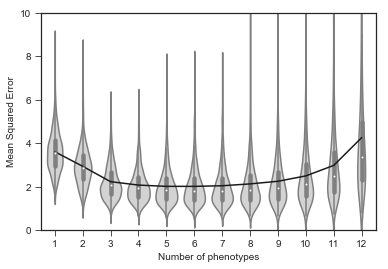

In [104]:
dataset = datasets['subtle_to_strong_wothers']
all_guesses = dataset['CV_all_guesses']
sns.violinplot(data=np.asarray(all_guesses),color='lightgray',alpha=0.1)
plt.plot(np.mean(all_guesses,axis=0),'k',label='Average')

plt.xticks(range(len(np.mean(all_guesses,axis=0))),range(1,len(np.mean(all_guesses,axis=0))+1))
plt.xlabel('Number of phenotypes')
plt.ylabel('Mean Squared Error')
plt.ylim(0,10)
plt.savefig('cross_validation_subtle_modelselection_fulldistribution.pdf',bbox_inches='tight')

(array([7]),)


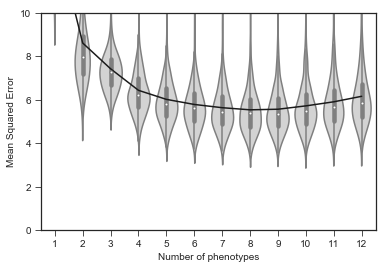

In [103]:
dataset = datasets['subtle_to_strong_wothers_fixed_mutants']
all_guesses = dataset['CV_all_guesses']
sns.violinplot(data=np.asarray(all_guesses),color='lightgray',alpha=0.1)
plt.plot(np.mean(all_guesses,axis=0),'k',label='Average')
print(np.where(np.mean(all_guesses,axis=0)==np.min(np.mean(all_guesses,axis=0))))

plt.xticks(range(len(np.mean(all_guesses,axis=0))),range(1,len(np.mean(all_guesses,axis=0))+1))
plt.xlabel('Number of phenotypes')
plt.ylabel('Mean Squared Error')
plt.ylim(0,10)

[(i,j) for i,j in enumerate(np.mean(all_guesses,axis=0))]
plt.savefig('cross_validation_subtle_modelselection_balancedtraintest_fulldistribution.pdf',bbox_inches='tight')

(array([3]),)


[(0, 4.511360040296568),
 (1, 3.7967107505367093),
 (2, 3.4569746047080114),
 (3, 3.318249429013312)]

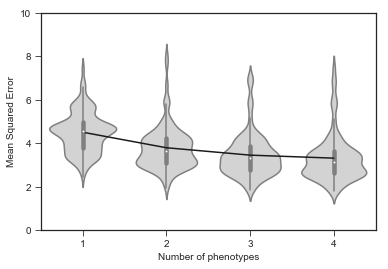

In [136]:
dataset = datasets['subtle_to_strong_wothers_fixed_mutants']
dataset = datasets['batch_to_nonbatch_wothers_fixed_mutants']
all_guesses = dataset['CV_all_guesses']
sns.violinplot(data=np.asarray(all_guesses),color='lightgray',alpha=0.1)
plt.plot(np.mean(all_guesses,axis=0),'k',label='Average')
print(np.where(np.mean(all_guesses,axis=0)==np.min(np.mean(all_guesses,axis=0))))

plt.xticks(range(len(np.mean(all_guesses,axis=0))),range(1,len(np.mean(all_guesses,axis=0))+1))
plt.xlabel('Number of phenotypes')
plt.ylabel('Mean Squared Error')
plt.ylim(0,10)

[(i,j) for i,j in enumerate(np.mean(all_guesses,axis=0))]
# plt.savefig('cross_validation_subtle_modelselection_balancedtraintest_fulldistribution.pdf',bbox_inches='tight')

0.0005088316725405356 0.0002864483758594249 0.5629531165566453
9


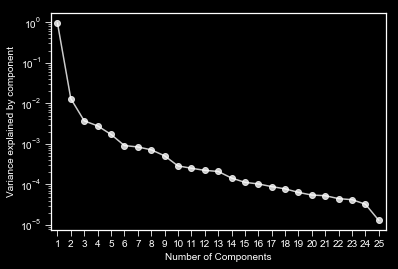

In [22]:
ax = plt.subplot(111)
these_cols = list(sorted_m3_cols)
these_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle])
# these_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:-2])


this_fitness = this_data[this_data['barcode'].isin(list(minimal_wothers_training_bcs))][these_cols].values
this_error = this_data[this_data['barcode'].isin(list(minimal_wothers_training_bcs))][[col.replace('_fitness','_error') for col in these_cols ]].values

this_fitness = this_data[this_data['barcode'].isin(list(minimal_wothers_training_bcs)+list(minimal_wothers_testing_bcs))][these_cols].values
this_error = this_data[this_data['barcode'].isin(list(minimal_wothers_training_bcs)+list(minimal_wothers_testing_bcs))][[col.replace('_fitness','_error') for col in these_cols ]].values

graphs.svd_noise_comparison_figure(ax,this_fitness,this_error,1000,yscale='log',style='dark',show_error=False)
plt.savefig('talk_figures/svd_detection.pdf',bbox_inches='tight')

In [529]:
CV_best_guesses, CV_all_guesses  = tools.SVD_train_test_folds(this_data,these_cols,[minimal_wothers_training_bcs,minimal_wothers_testing_bcs],100,fixed_mutant_sets=True)

[(1, 13.851822860271396),
 (2, 8.685017610512674),
 (3, 7.355710242788846),
 (4, 6.391502608922789),
 (5, 5.997179846476583),
 (6, 5.7767961074585),
 (7, 5.5973225678509735),
 (8, 5.4413099346947345),
 (9, 5.388021738148716),
 (10, 5.521430771784445),
 (11, 5.742816812761143),
 (12, 6.0593384841933515)]

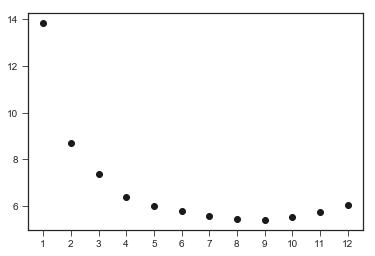

In [530]:
plt.plot(np.mean(CV_all_guesses,axis=0),'ko',label='Average')
plt.xticks(range(len(np.mean(CV_all_guesses,axis=0))),range(1,len(np.mean(CV_all_guesses,axis=0))+1))
[(i+1,j) for i,j in enumerate(np.mean(CV_all_guesses,axis=0))]
# plt.axvline(np.w)

[(1, 11.89749598075474), (2, 7.157430338932668), (3, 6.357416601442337), (4, 5.776044231964393), (5, 5.31810900809833), (6, 5.002137542677777), (7, 4.685242218105148), (8, 4.511312084396006), (9, 4.489053262368592), (10, 4.558220229538686), (11, 4.6719679984851075), (12, 4.796299915142711)]


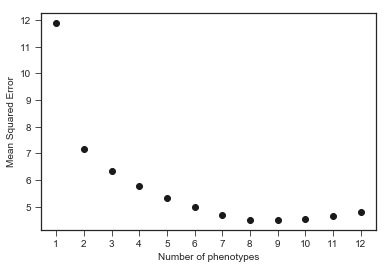

In [353]:
print([(i+1,item) for i,item in enumerate(np.mean(all_guesses,axis=0))])

plt.plot(np.mean(all_guesses,axis=0),'ko',label='Average')
plt.xticks(range(len(np.mean(all_guesses,axis=0))),range(1,len(np.mean(all_guesses,axis=0))+1))
plt.xlabel('Number of phenotypes')
plt.ylabel('Mean Squared Error')
plt.savefig('cross_validation_subtle_modelselection_balancedtraintest_justmean.pdf',bbox_inches='tight')

0.000547323359739082 0.0004732797635506793 0.8647169084401942
8


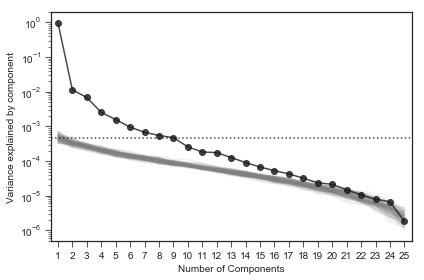

In [105]:
# minimal_wothers_training_bcs




this_err = this_data[this_data['barcode'].isin(minimal_wothers_training_bcs)][[col.replace('_fitness','_error') for col in list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle])]].values
this_fitness = this_data[this_data['barcode'].isin(minimal_wothers_training_bcs)][[col for col in list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle])]].values


# train_c = np.where()

reduce = [1]
# plt.figure(figsize=(4*len(reduce),4*1))
for r,err_reduction in enumerate(reduce):
    ax = plt.subplot(1,len(reduce),r+1)
#     plt.title(err_reduction)
    tools.svd_noise_comparison_figure(ax,this_fitness,this_err*err_reduction,100)
    plt.yscale('log')
plt.tight_layout()
# plt.savefig('SVD_noise_model_trainingwothers+subtle.pdf',bbox_inches='tight')

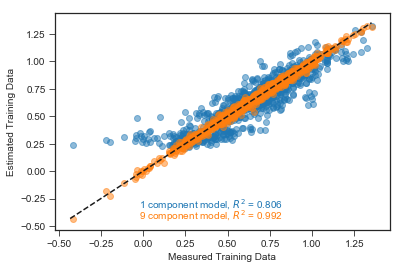

In [20]:

dataset = datasets['subtle_to_strong_wothers_fixed_mutants']
both_old = dataset['both_old']
dhats = dataset['dhats']
model = dataset['CV_best_rank_index']
model = 8


plt.scatter(both_old,dhats[0],alpha=0.5,label='1 component model')
plt.scatter(both_old,dhats[model],alpha=0.5,label=f'{model + 1} component model')
plt.xlabel('Measured Training Data')
plt.ylabel('Estimated Training Data')
this_min = min([np.min(both_old),np.min(dhats[model])])
this_max = max([np.max(both_old),np.max(dhats[model])])
plt.plot([this_min,this_max],[this_min,this_max],'k--')
xdisplay, ydisplay = plt.gca().transAxes.transform_point((0.3, 0.1))

plt.annotate(fr'1 component model, $R^2$ = {tools.var_explained(both_old,dhats[0])[0]:.3g}',xy=(0.25,0.1),
             color=sns.color_palette()[0],xycoords='axes fraction')

xdisplay, ydisplay = plt.gca().transAxes.transform_point((0.3, 0.0))
plt.annotate(fr'{model+1} component model, $R^2$ = {tools.var_explained(both_old,dhats[model])[0]:.3g}',xy=(0.25,0.05),
             color=sns.color_palette()[1],xycoords='axes fraction')
    # plt.legend()
plt.savefig('overall_train_subtle_prediction.pdf',bbox_inches='tight')

In [250]:
[(model,tools.var_explained(both_old,dhats[model])[0]) for model in range(9)]

[(0, 0.8060645243564412),
 (1, 0.8903262744354286),
 (2, 0.9412692440059481),
 (3, 0.9601891343499773),
 (4, 0.9719635821143189),
 (5, 0.9790403401278055),
 (6, 0.9840976939289598),
 (7, 0.9881718632519453),
 (8, 0.9916948663533792)]

In [60]:
sns.set_context('notebook')

4 0.7228050230311741
9 0.7307401028124311


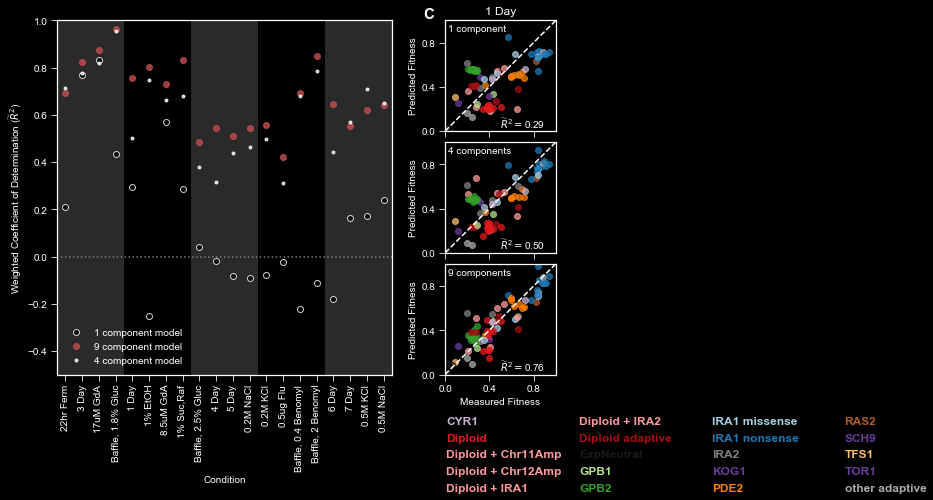

In [52]:
example_names = ['1.8%','Resp_24hr_Transfer','1BB_1%EtOH','Ben2','1BB_0.5MNaCl']
# graphs.Figure4_w_examples(datasets['batch_to_nonbatch_wothers_fixed_mutants'],gene_list,this_data,[col + '_fitness' for col in example_names],model=4)
interesting_conditions = ['Resp_24hr_Transfer_fitness','1BB_SucRaf_fitness','2.5%_fitness','Resp_4Day_Transfer_fitness', '1BB_0.5ugFlu_fitness','Resp_6Day_Transfer_fitness']
example_names = ['1.8%','Resp_24hr_Transfer','1BB_SucRaf','2.5%','Resp_4Day_Transfer', '1BB_0.5ugFlu','Resp_6Day_Transfer','1BB_0.5MNaCl']
example_names = ['1.8%','Resp_24hr_Transfer','1BB_SucRaf','2.5%','Resp_4Day_Transfer','1BB_0.5MNaCl']
example_names = ['Resp_24hr_Transfer']

graphs.Figure4_w_examples(datasets['subtle_to_strong_wothers'],gene_list,this_data,[col + '_fitness' for col in example_names],models=[3,8],
                          weighted=True,style='dark',permute=False,build_up='talk_figures/Figure4_with_prediction_examples_weighted',labels=False)
plt.savefig(f'talk_figures/Figure4_with_prediction_examples_weighted_extra1.pdf',bbox_inches='tight')

2 0.6816635976414404
3 0.6907432233991371
4 0.7228050230311741
5 0.6950411134599521
6 0.6962830025912685
7 0.7167318907956762
8 0.7216683446558692
9 0.7307401028124311
10 0.7099818427672806


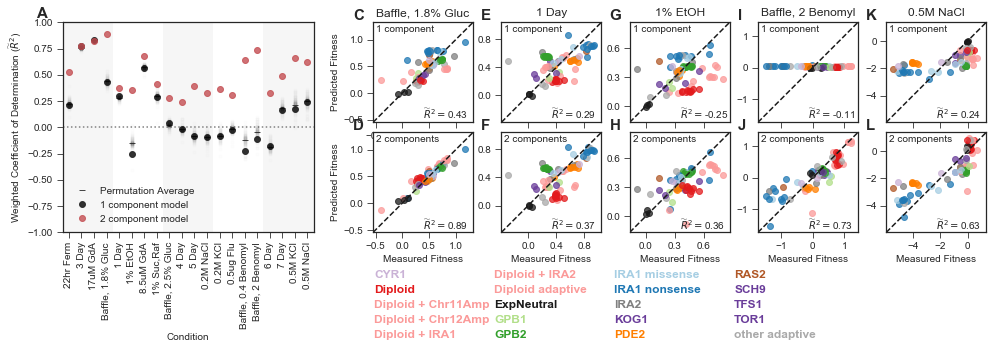

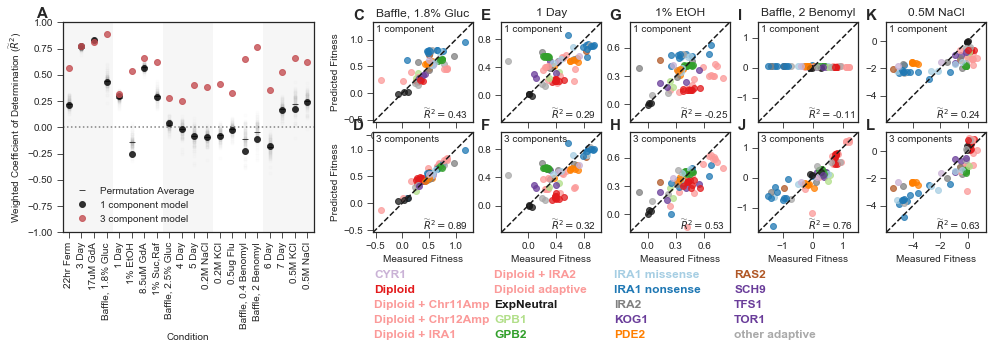

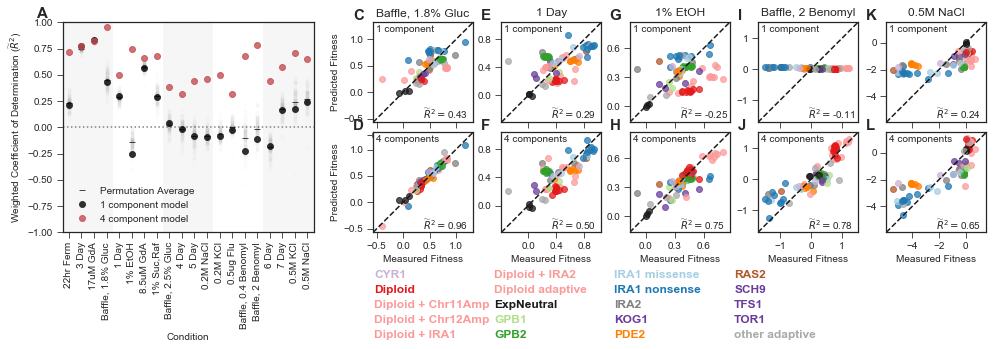

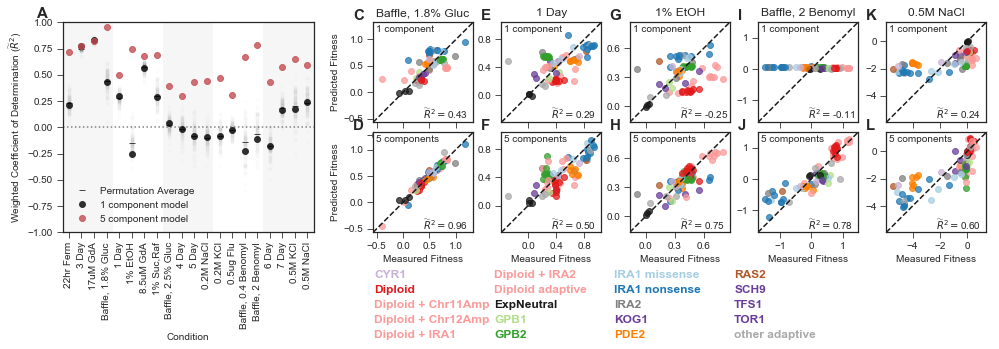

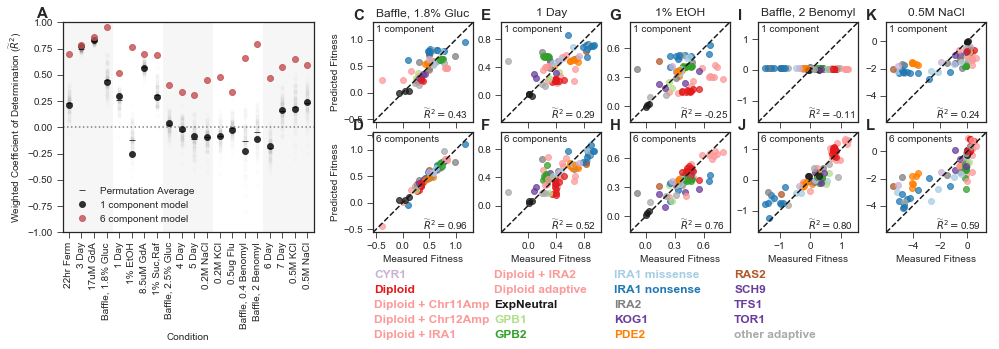

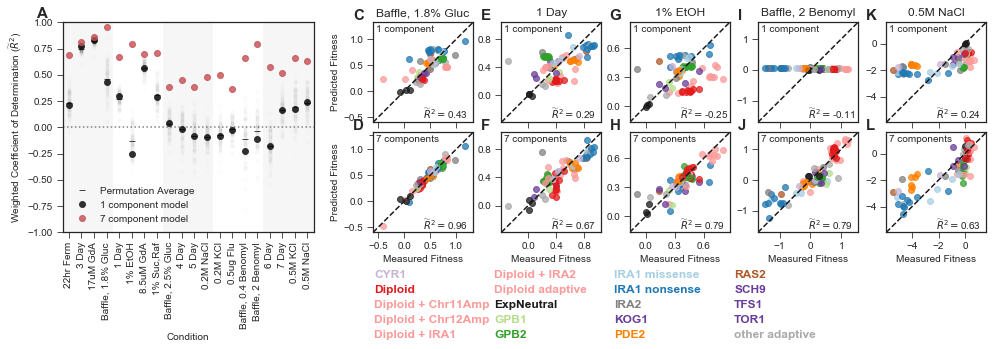

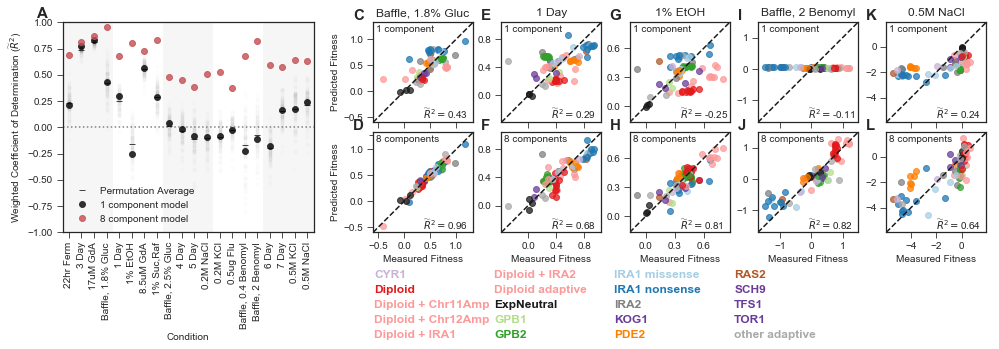

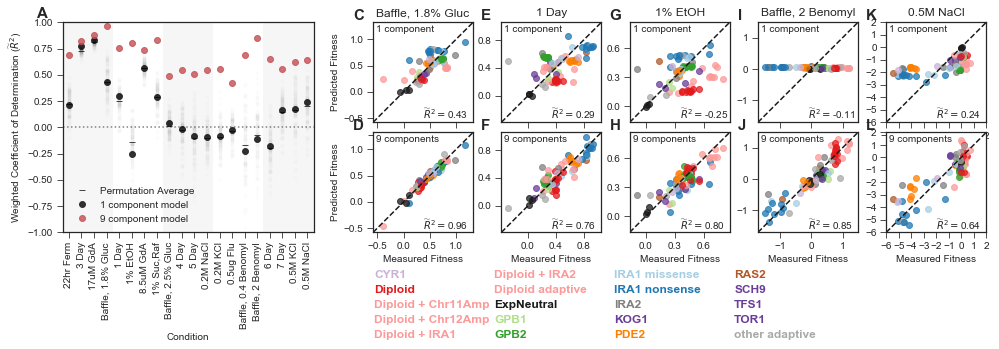

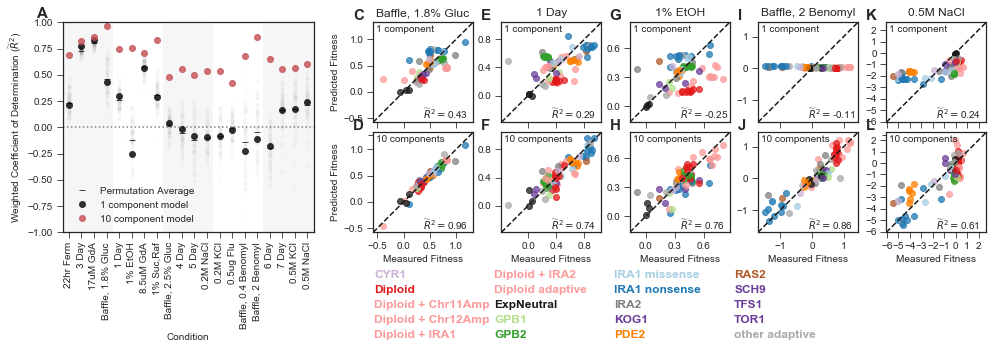

In [92]:
example_names = ['1.8%','Resp_24hr_Transfer','1BB_1%EtOH','Ben2','1BB_0.5MNaCl']

# graphs.Figure4_w_examples(datasets['batch_to_nonbatch_wothers_fixed_mutants'],gene_list,this_data,[col + '_fitness' for col in example_names],model=4)

for m in range(1,10):
    graphs.Figure4_w_examples(datasets['subtle_to_strong_wothers'],gene_list,this_data,[col + '_fitness' for col in example_names],model=m)
    plt.savefig(f'Figure4_with_prediction_examples_weighted_bytype_m{m}.pdf',bbox_inches='tight')

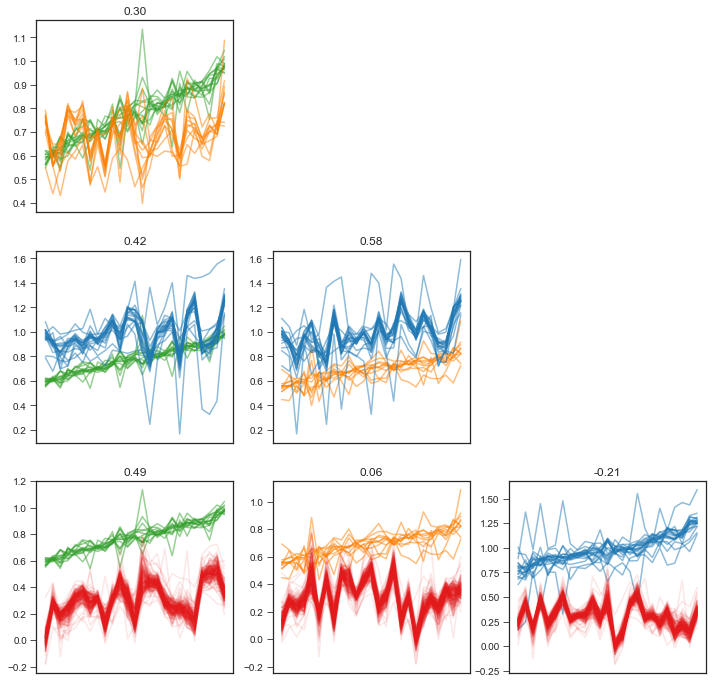

In [437]:
np.where(np.asarray(overall_gene_list) == 'PDE2')

(array([1]),)

In [435]:
gene2

'PDE2'

In [55]:
this_data = merged_fitness_data
this_data = this_data.replace([np.inf, -np.inf], np.nan)
this_data = this_data.dropna('columns',how='all')
this_data = this_data.dropna()
this_data = this_data.sort_values('barcode')


dataset = datasets['subtle_to_strong_wothers']

bc_removal = [6391,60700,71109]


all_guesses = dataset['CV_all_guesses']
both_old = dataset['both_old']
dhats = dataset['dhats']
this_fitness  = dataset['this_fitness']

both_new = dataset['both_new']
guesses = dataset['guesses']
model = dataset['CV_best_rank_index']
test_conditions  = dataset['test_conditions']

train  = copy.copy(dataset['train'])
test = copy.copy(dataset['test'])

training_bcs = copy.copy(dataset['training_bcs'])
testing_bcs = copy.copy(dataset['testing_bcs'])


if bc_removal != False:
    train_where = np.where(np.isin(training_bcs,bc_removal))[0]
    test_where = np.where(np.isin(testing_bcs,bc_removal))[0]
    
    train[1] = [x for i,x in enumerate(train[1]) if i not in train_where]
    test[1] = [x for i,x in enumerate(test[1]) if i not in test_where]
    
    training_bcs = [x for i,x in enumerate(training_bcs) if i not in test_where]
    testing_bcs = [x for i,x in enumerate(testing_bcs) if i not in test_where]

    
nonsubtle_fits = []
subtle_fits = []
overall_subtle = []
overall_nonsubtle = []
for model in range(25):
    # this_gene_data = this_data[this_data['barcode'].isin(test_mutant_data)]
    types = this_data[this_data['barcode'].isin(testing_bcs)]['mutation_type'].values
    
    new_mut_locs = dataset['mut_locs'][model][test[1]]
    
    old_cond_locs = dataset['cond_locs'][model][train[0]]

    new_cond_locs = dataset['cond_locs'][model][test[0]]
    
    these_sigmas = dataset['dimension_weights'][model]
    these_sigmas = these_sigmas[:model+1,:model+1]
    

    overall_nonsubtle.append(tools.var_explained_weighted_by_type(this_fitness[test[1],:][:,test[0]],
                                                                  np.dot(new_mut_locs,np.dot(these_sigmas,new_cond_locs.T)),types)[0])


    this_sse = np.asarray([tools.var_explained_weighted_by_type(this_fitness[test[1],test[0][i]],
                                                                  np.dot(new_mut_locs,np.dot(these_sigmas,new_cond_locs.T))[:,i],types)[0] for i in range(new_cond_locs.shape[0])])
    nonsubtle_fits.append(this_sse)
    
    overall_subtle.append(tools.var_explained_weighted_by_type(this_fitness[test[1],:][:,train[0]],
                                                                  np.dot(new_mut_locs,np.dot(these_sigmas,old_cond_locs.T)),types)[0])


    subtle_sse = np.asarray([tools.var_explained_weighted_by_type(this_fitness[test[1],train[0][i]],
                                                                  np.dot(new_mut_locs,np.dot(these_sigmas,old_cond_locs.T))[:,i],types)[0] for i in range(old_cond_locs.shape[0])])


    subtle_fits.append(subtle_sse)
    

In [56]:
len(test[1])

72

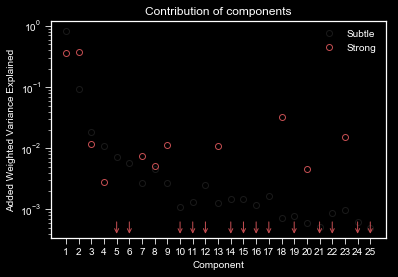

In [57]:
[(i+1,o) for i,o in enumerate(overall_subtle)]
np.diff(overall_subtle)

plt.plot([overall_subtle[0]]+list(np.diff(overall_subtle)),'o',markeredgecolor='k',markerfacecolor='None',label='Subtle')
plt.ylabel('Added Weighted Variance Explained')
# plt.yscale('log',basey=10)

# for i,item in enumerate([overall_subtle[0]]+list(np.diff(overall_subtle))):
# #     plt.annotate(xy=(i+0.2,item+0.0*item),s=f'{item*100:.2f}% ({overall_subtle[i]*100:.2f}%)',transform=plt.gca().transAxes)
#     plt.annotate(xy=(i+0.2,item-0.1*item),s=f'{item*100:.2f}%',transform=plt.gca().transAxes)

plt.plot([overall_nonsubtle[0]]+list(np.diff(overall_nonsubtle)),'o',markeredgecolor='r',markerfacecolor='None',label='Strong')
plt.ylabel('Added Weighted Variance Explained')
plt.yscale('log',basey=10)
plt.xticks(range(len(overall_subtle)),range(1,len(overall_subtle)+1))
plt.xlabel('Component')

# for i,item in enumerate([overall_nonsubtle[0]]+list(np.diff(overall_nonsubtle))):
# #     plt.annotate(xy=(i+0.2,item+0.0*item),s=f'{item*100:.2f}% ({overall_subtle[i]*100:.2f}%)',transform=plt.gca().transAxes)
#     plt.annotate(xy=(i+0.2,item+0.1*item),s=f'{item*100:.2f}%',transform=plt.gca().transAxes,color='r')

    
ymin,ymax = plt.ylim()
for i,item in enumerate([overall_nonsubtle[0]]+list(np.diff(overall_nonsubtle))):
    if item < 0:
#         plt.annotate(xytext=(i,2*ymin),xy=(i,ymin+0.1*ymin),s=f'{item*100:.2f}%',transform=plt.gca().transAxes,color='r',
#                      ha='center',arrowprops=dict(arrowstyle='->',color='r'))
        plt.annotate(xytext=(i,2*ymin),xy=(i,ymin+0.1*ymin),s="",transform=plt.gca().transAxes,color='r',
                     ha='center',arrowprops=dict(arrowstyle='->',color='r'))
        
#     plt.annotate(xy=(i+0.2,item+0.0*item),s=f'{item*100:.2f}% ({overall_subtle[i]*100:.2f}%)',transform=plt.gca().transAxes)
     


# plt.xlim(-0.5,9.0)
plt.title('Contribution of components')
plt.legend()

# plt.savefig('added_VE_in_subtleANDstrong_overall.pdf')
# plt.ylabel('Added Variance Explained')

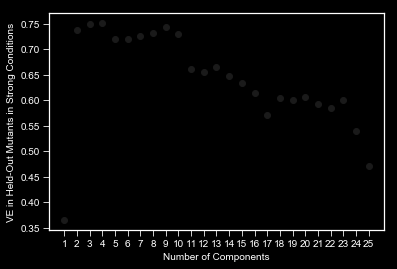

In [58]:


plt.plot(range(1,len(overall_nonsubtle)+1),overall_nonsubtle,'ko')
plt.xticks(range(1,len(overall_nonsubtle)+1),range(1,len(overall_nonsubtle)+1))

plt.xlabel('Number of Components')
plt.ylabel('VE in Held-Out Mutants in Strong Conditions')
plt.savefig('ve_strong.pdf',bbox_inches='tight')

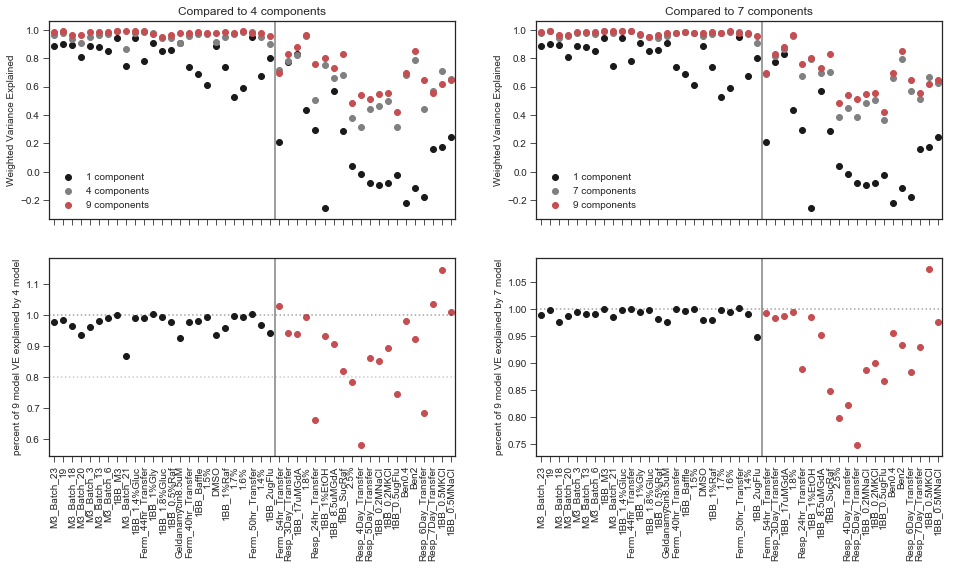

In [49]:
# train_conditions = dataset['train_conditions']

both_fits = np.concatenate((subtle_fits,nonsubtle_fits),axis=1)

# fits_swapped =np.asarray(subtle_fits).swapaxes(0,1)

model = 2
fits_swapped =np.asarray(both_fits).swapaxes(0,1)

all_cols = train_conditions + test_conditions

plt.subplots(2,2,figsize=(16,8),sharex=True,sharey=True)
model = 3
plt.subplot(221)
plt.title(f'Compared to {model+1} components')
for c,col in enumerate(all_cols):
    plt.scatter(c,fits_swapped[c,0],color='k')
    plt.scatter(c,fits_swapped[c,model],color='gray')
    plt.scatter(c,fits_swapped[c,8],color='r')

plt.ylabel('Weighted Variance Explained')
plt.legend(['1 component',f'{model+1} components','9 components'])
plt.xticks(range(len(all_cols)),['' for col in all_cols],rotation=90)
plt.axvline(len(train_conditions)-0.5,color='gray')
plt.xlim(-0.5,len(all_cols)-0.5)

plt.subplot(223)
plt.axhline(1.0,color='k',linestyle=':',alpha=0.4)
plt.axhline(0.8,color='gray',linestyle=':',alpha=0.4)
for c,col in enumerate(all_cols):

    plt.scatter(c,fits_swapped[c,model]/fits_swapped[c,8],label=col,color=('k' if col in train_conditions else 'r') )

plt.xticks(range(len(all_cols)),[col.replace('_fitness','') for col in all_cols],rotation=90)
plt.axvline(len(train_conditions)-0.5,color='gray')
plt.xlim(-0.5,len(all_cols)-0.5)
plt.ylabel(f'percent of 9 model VE explained by {model+1} model')
# plt.ylim(0.0,1.2)

model = 6
plt.subplot(222)
plt.title(f'Compared to {model+1} components')
for c,col in enumerate(all_cols):
    plt.scatter(c,fits_swapped[c,0],label=col,color='k')
    plt.scatter(c,fits_swapped[c,model],label=col,color='gray')
    plt.scatter(c,fits_swapped[c,8],label=col,color='r')

plt.ylabel('Weighted Variance Explained')
plt.legend(['1 component',f'{model+1} components','9 components'])
plt.xticks(range(len(all_cols)),['' for col in all_cols],rotation=90)
plt.axvline(len(train_conditions)-0.5,color='gray')
plt.xlim(-0.5,len(all_cols)-0.5)

plt.subplot(224)
plt.axhline(1.0,color='k',linestyle=':',alpha=0.4)
for c,col in enumerate(all_cols):

    plt.scatter(c,fits_swapped[c,model]/fits_swapped[c,8],label=col,color=('k' if col in train_conditions else 'r') )

plt.xticks(range(len(all_cols)),[col.replace('_fitness','') for col in all_cols],rotation=90)
plt.axvline(len(train_conditions)-0.5,color='gray')
plt.xlim(-0.5,len(all_cols)-0.5)
plt.ylabel(f'percent of 9 model VE explained by {model+1} model')
# plt.ylim(0.0,1.2)

plt.savefig('VE_comparison_unweighted.pdf',bbox_inches='tight')



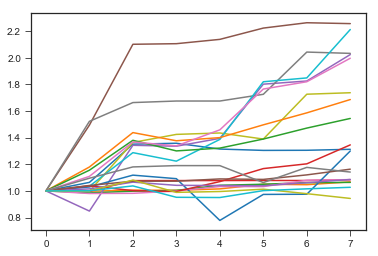

In [73]:
fits_swapped =np.asarray(fits).swapaxes(0,1)

for c,col in enumerate(test_conditions):
    plt.plot(fits_swapped[c,1:]/fits_swapped[c,1])

In [90]:
category_swapped = {}
category_colors = {'M3':'Greys',
                  'glucose':'Reds',
                  'drugs':'Blues',
                  'salt':'Oranges',
                   'carbons':'Greens',
                   'ferm':'Pastel1',
                   'resp/stat':'Purples'
                  }

condition_colorset = {}

all_cols = np.concatenate((sorted_m3_cols,sorted_nonm3_cols))
all_cols = [col.replace('_fitness','') for col in all_cols]

for cat in np.unique(list(tools.condition_categories.values())):

    category_swapped[cat] = [kv[0] for kv in tools.condition_categories.items() if kv[1] == cat ]
    print(category_swapped[cat])
    
    these_cols = [col for col in all_cols if col in category_swapped[cat]]
    
    category_swapped[cat] = these_cols
    
for cat,cols in category_swapped.items():
    for c,col in enumerate(cols):
        condition_colorset[col] = sns.color_palette(category_colors[cat],len(cols))[c]



['19', 'M3_Batch_3', 'M3_Batch_6', 'M3_Batch_13', 'M3_Batch_18', 'M3_Batch_20', 'M3_Batch_21', 'M3_Batch_23', '1BB_M3']
['1BB_1%Raf', '1BB_0.5%Raf', '1BB_1%Gly', '1BB_1%EtOH', '1BB_SucRaf']
['1BB_8.5uMGdA', '1BB_17uMGdA', '1BB_2ugFlu', '1BB_0.5ugFlu', 'DMSO', 'Geldanamycin8.5uM', 'Ben0.4', 'Ben2']
['Ferm_44hr_Transfer', 'Ferm_40hr_Transfer', 'Ferm_54hr_Transfer', 'Ferm_50hr_Transfer']
['1BB_Baffle', '1.4%', '1.5%', '1.6%', '1.7%', '1.8%', '2.5%', '1BB_1.4%Gluc', '1BB_1.8%Gluc']
['Resp_24hr_Transfer', 'Resp_3Day_Transfer', 'Resp_4Day_Transfer', 'Resp_5Day_Transfer', 'Resp_6Day_Transfer', 'Resp_7Day_Transfer']
['1BB_0.2MNaCl', '1BB_0.5MNaCl', '1BB_0.2MKCl', '1BB_0.5MKCl']


In [130]:
condition_colorset

{'1.4%': (0.8503344867358708, 0.14686658977316416, 0.13633217993079583),
 '1.5%': (0.9874509803921568, 0.5411764705882353, 0.41568627450980394),
 '1.6%': (0.9466666666666667, 0.26823529411764707, 0.19607843137254902),
 '1.7%': (0.9835755478662053, 0.4127950788158401, 0.28835063437139563),
 '1.8%': (0.7364705882352941, 0.08, 0.10117647058823528),
 '19': (0.8870588235294118, 0.8870588235294118, 0.8870588235294118),
 '1BB_0.2MKCl': (0.9921568627450981, 0.6564705882352941, 0.3827450980392157),
 '1BB_0.2MNaCl': (0.9937254901960785, 0.8501960784313726, 0.7043137254901961),
 '1BB_0.5%Raf': (0.681045751633987, 0.8718954248366013, 0.6562091503267974),
 '1BB_0.5MKCl': (0.9545098039215686, 0.44, 0.10666666666666666),
 '1BB_0.5MNaCl': (0.7709803921568628,
  0.2541176470588235,
  0.007058823529411764),
 '1BB_0.5ugFlu': (0.21568627450980393, 0.5294117647058824, 0.7542483660130719),
 '1BB_1%EtOH': (0.21568627450980393, 0.6287581699346405, 0.3333333333333333),
 '1BB_1%Gly': (0.8606689734717416, 0.9458

In [53]:
interesting_conditions = ['Resp_24hr_Transfer_fitness','1BB_SucRaf_fitness','2.5%_fitness','Resp_4Day_Transfer_fitness','Resp_5Day_Transfer_fitness', '1BB_0.5ugFlu_fitness','Resp_6Day_Transfer_fitness']

interesting_conditions = ['Resp_24hr_Transfer_fitness','Resp_4Day_Transfer_fitness','Resp_5Day_Transfer_fitness','Resp_6Day_Transfer_fitness']

interesting_conditions = ['Resp_24hr_Transfer_fitness','1BB_SucRaf_fitness','2.5%_fitness','Resp_4Day_Transfer_fitness','Resp_5Day_Transfer_fitness','Resp_6Day_Transfer_fitness']



In [54]:
train_conditions = dataset['train_conditions']

fits_swapped =np.asarray(subtle_fits).swapaxes(0,1)

plt.figure(figsize=(8,4))

plt.subplot(121)
for c,col in enumerate(train_conditions):
    plt.plot(fits_swapped[c,1:],label=col,color=condition_colorset[col.replace('_fitness','')])
# plt.legend(loc=(1.0,0.0))
plt.xticks(range(fits_swapped.shape[1]),range(1,fits_swapped.shape[1]+1))
plt.ylabel('weighted R^2')

plt.subplot(122)
for c,col in enumerate(train_conditions):
    plt.plot(fits_swapped[c,1:]/fits_swapped[c,1],label=col,color=condition_colorset[col.replace('_fitness','')])
plt.legend(loc=(1.0,0.0))
plt.xticks(range(fits_swapped.shape[1]-1),range(2,fits_swapped.shape[1]+1))
plt.ylabel('divided by 2-component model')

plt.figure(figsize=(8,4))

plt.subplot(121)
for c,col in enumerate(train_conditions):
    plt.plot(np.diff(fits_swapped[c]),label=col,color=condition_colorset[col.replace('_fitness','')])
# plt.legend(loc=(1.0,0.0))
plt.xticks(range(fits_swapped.shape[1]-1),range(2,fits_swapped.shape[1]+1))
plt.ylabel('Added Variance explained')

plt.subplot(122)
for c,col in enumerate(train_conditions):
    plt.plot(np.diff(fits_swapped[c,1:]),label=col,color=condition_colorset[col.replace('_fitness','')])
plt.legend(loc=(1.0,0.0))
plt.xticks(range(fits_swapped.shape[1]-2),range(3,fits_swapped.shape[1]+2))
plt.ylabel('Added Variance explained')

NameError: name 'dataset' is not defined

Text(0,0.5,'Added Variance explained')

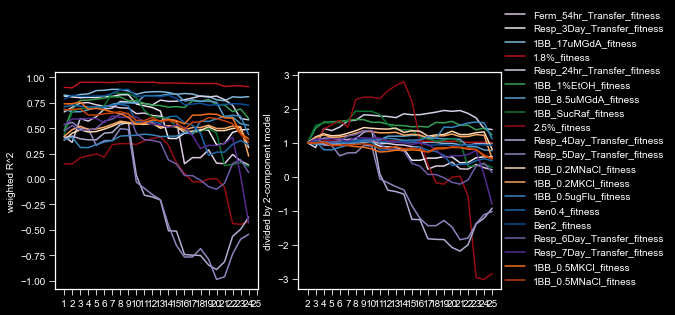

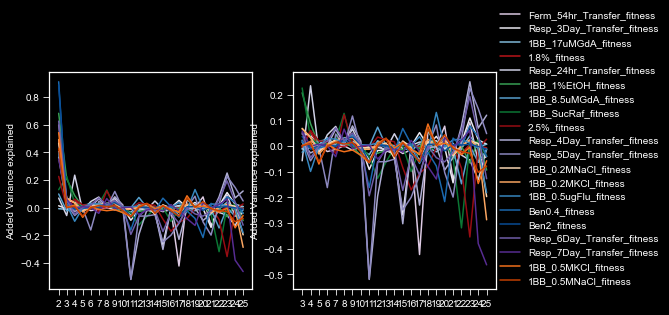

In [62]:
test_conditions = dataset['test_conditions']

fits_swapped =np.asarray(nonsubtle_fits).swapaxes(0,1)

plt.figure(figsize=(8,4))

plt.subplot(121)
for c,col in enumerate(test_conditions):
    plt.plot(fits_swapped[c,1:],label=col,color=condition_colorset[col.replace('_fitness','')])
# plt.legend(loc=(1.0,0.0))
plt.xticks(range(fits_swapped.shape[1]),range(1,fits_swapped.shape[1]+1))
plt.ylabel('weighted R^2')

plt.subplot(122)
for c,col in enumerate(test_conditions):
    plt.plot(fits_swapped[c,1:]/fits_swapped[c,1],label=col,color=condition_colorset[col.replace('_fitness','')])
plt.legend(loc=(1.0,0.0))
plt.xticks(range(fits_swapped.shape[1]-1),range(2,fits_swapped.shape[1]+1))
plt.ylabel('divided by 2-component model')

plt.figure(figsize=(8,4))

plt.subplot(121)
for c,col in enumerate(test_conditions):
    plt.plot(np.diff(fits_swapped[c]),label=col,color=condition_colorset[col.replace('_fitness','')])
# plt.legend(loc=(1.0,0.0))
plt.xticks(range(fits_swapped.shape[1]-1),range(2,fits_swapped.shape[1]+1))
plt.ylabel('Added Variance explained')

plt.subplot(122)
for c,col in enumerate(test_conditions):
    plt.plot(np.diff(fits_swapped[c,1:]),label=col,color=condition_colorset[col.replace('_fitness','')])
plt.legend(loc=(1.0,0.0))
plt.xticks(range(fits_swapped.shape[1]-2),range(3,fits_swapped.shape[1]+2))
plt.ylabel('Added Variance explained')

In [60]:
interesting_conditions = ['Resp_24hr_Transfer_fitness']

Text(0.5,0,'Component')

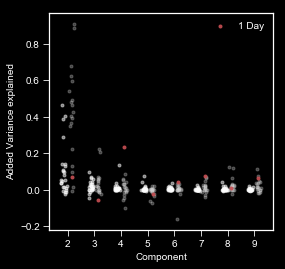

In [63]:

subtle_swapped =np.asarray(subtle_fits).swapaxes(0,1)
fits_swapped =np.asarray(nonsubtle_fits).swapaxes(0,1)
model = 8
end = model + 1

focal_conditions = []

interesting_locs = np.where(np.isin(test_conditions,interesting_conditions))[0]
uninteresting_locs = np.where(~np.isin(test_conditions,interesting_conditions))[0]

plt.figure(figsize=(4,4))

for c in range(subtle_swapped.shape[0]):
    plt.scatter([tools.jitter_point(i-0.15,0.05) for i in range(len(np.diff(subtle_swapped[c,:end])))],np.diff(subtle_swapped[c,:end]),color='w',alpha=0.5,marker='.')

for c in uninteresting_locs:
    plt.scatter([tools.jitter_point(i+0.15,0.05) for i in range(len(np.diff(fits_swapped[c,:end])))],np.diff(fits_swapped[c,:end]),color='lightgray',alpha=0.3,marker='.')

plt.xticks(range(fits_swapped.shape[1]-1),range(2,fits_swapped.shape[1]+2))
plt.ylabel('Added Variance explained')

for c,col in zip(interesting_locs,interesting_conditions):
    plt.scatter([tools.jitter_point(i+0.15,0.05) for i in range(len(np.diff(fits_swapped[c,:end])))],np.diff(fits_swapped[c,:end]),
                color='r',marker='.',alpha=0.9,label=renamed_conditions[col.replace('_fitness','')])
#     plt.plot(np.diff(fits_swapped[c,:]),label=renamed_conditions[col.replace('_fitness','')],color=condition_colorset[col.replace('_fitness','')],marker='o',linestyle='',alpha=0.7)
plt.legend()
plt.xticks(range(end-1),range(2,end+1))
plt.ylabel('Added Variance explained')
plt.xlabel('Component')
# plt.yscale('log')

# plt.savefig(f'added_VE_interesting_withothers_{end}.pdf',bbox_inches='tight')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


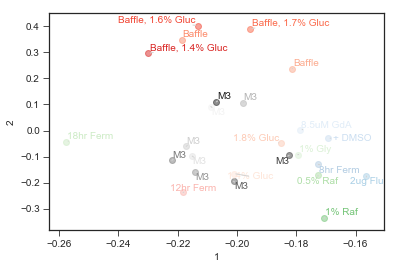

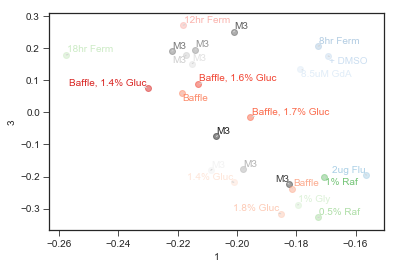

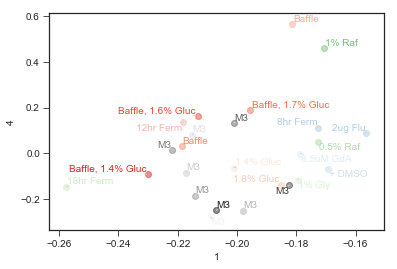

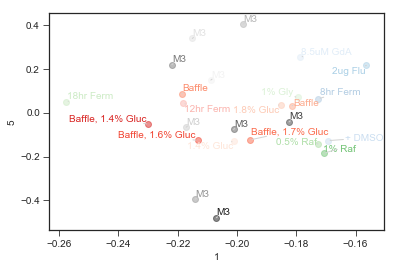

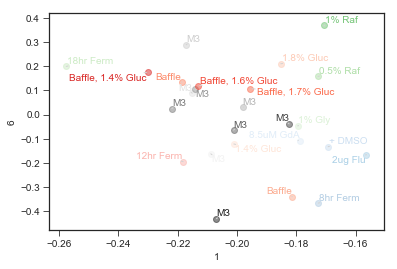

...

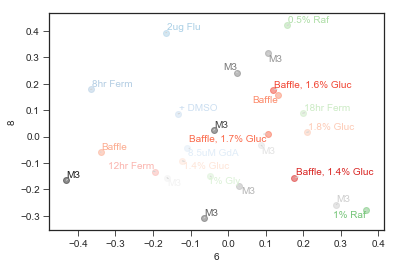

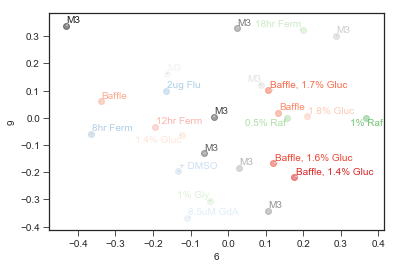

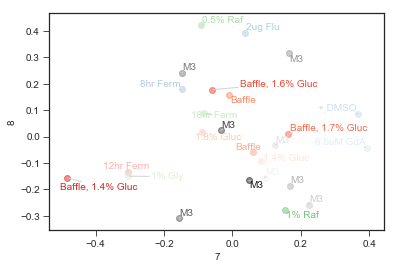

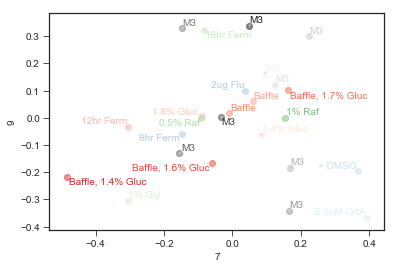

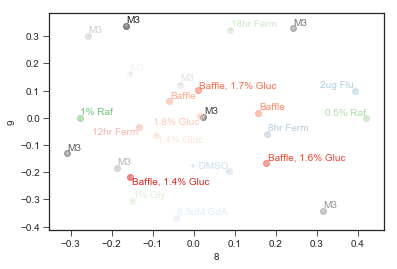

In [421]:
## plotting the space

this_set = 'subtle_to_strong_wothers'
# this_set = 'subtle_to_strong_wothers_ALLTEST'

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']
mutants_to_orient_by= ['GPB2','PDE2']
# mutants_to_orient_by = ['Diploid','IRA1_nonsense']
mutants_to_orient_by = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']
all_bcs = list(datasets[this_set]['training_bcs']) +  list(datasets[this_set]['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets[this_set]['centroids'][model]
these_indices = []
these_bcs = []

for b,bc in enumerate(all_bcs):
    if this_data[this_data['barcode']==bc]['mutation_type'].values[0] in mutants_to_orient_by:
        
        these_indices.append(b)
        these_bcs.append(bc)
        
these_bcs = all_bcs
these_indices = range(len(all_bcs))

these_locs = datasets[this_set]['mut_locs'][model][these_indices,:]

# these_locs = np.asarray([geom_medians[mut_type] for mut_type in mutants_to_orient_by])

offcenter = np.mean(these_locs,axis=0)
centered_medians = these_locs + (-1)*np.tile(offcenter,these_locs.shape[0]).reshape(these_locs.shape)

# for x,y in combinations(range(model+1),2):
#     plt.figure()
#     plt.xlabel(x+1)
#     plt.ylabel(y+1)
#     for b,bc in enumerate(these_bcs):
#         mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
#         if bc == 151:
#             plt.scatter(these_locs[b,x],these_locs[b,y],color=mutant_colorset[mutant_type],marker='D',alpha=0.5)
#         else:
        
#             plt.scatter(these_locs[b,x],these_locs[b,y],color=mutant_colorset[mutant_type],alpha=0.5)
#     for mutant_type in medians_to_include:
#         plt.scatter(geom_medians[mutant_type][x],geom_medians[mutant_type][y],color=mutant_colorset[mutant_type],marker='D')
#     plt.savefig(f'space_plotted_m{model}_{x+1}_{y+1}.pdf')
    
these_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols[:first_nonsubtle])
these_locs = datasets[this_set]['cond_locs'][model]
for x,y in combinations(range(model+1),2):
    plt.figure(figsize=(6,4))

    plt.xlabel(x+1)
    plt.ylabel(y+1)
    
    ts = []
    for c,cond in enumerate(these_cols):
        plt.scatter(these_locs[c,x],these_locs[c,y],color=condition_colorset[cond.replace('_fitness','')],alpha=0.5)


    for c,cond in enumerate(these_cols):
        ts.append(plt.text(these_locs[c,x],these_locs[c,y], color=condition_colorset[cond.replace('_fitness','')],s=renamed_conditions[cond.replace('_fitness','')]))
    adjust_text(ts, x=these_locs[:,x],y=these_locs[:,y], force_points=0.1, arrowprops=dict(arrowstyle='-', color='lightgray'))
    
                    

    plt.savefig(f'space_plotted_subtleconditions_m{model}_{x+1}_{y+1}.pdf')
#     plt.savefig(f'space_plotted_conditions_m{model}_{x+1}_{y+1}.pdf')
    





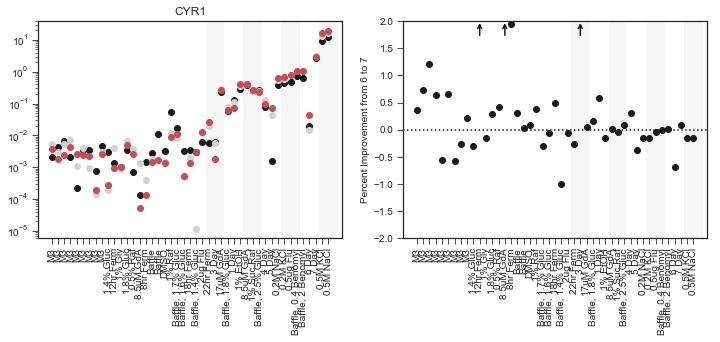

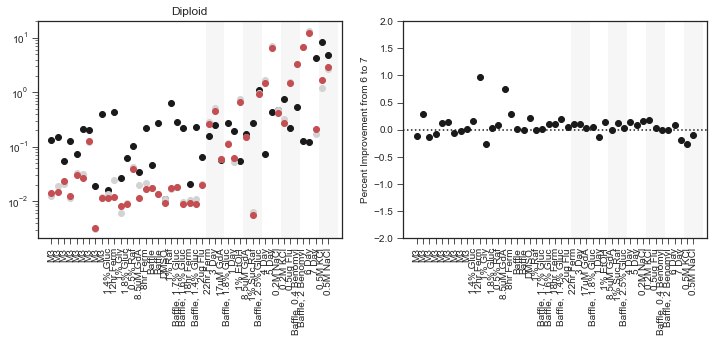

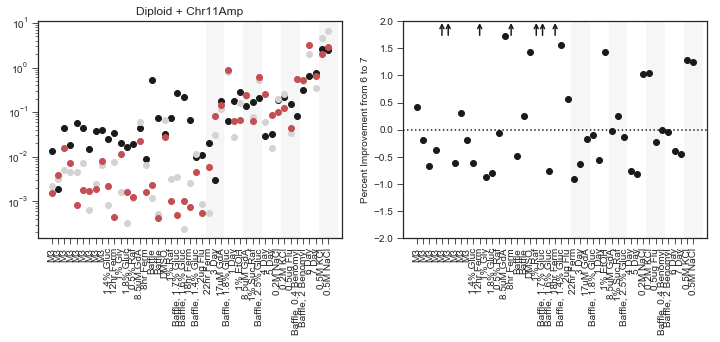

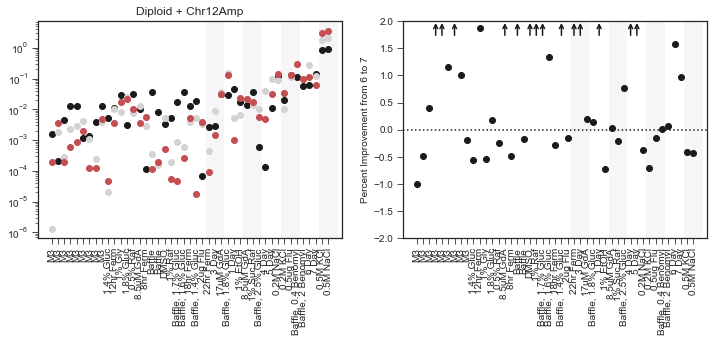

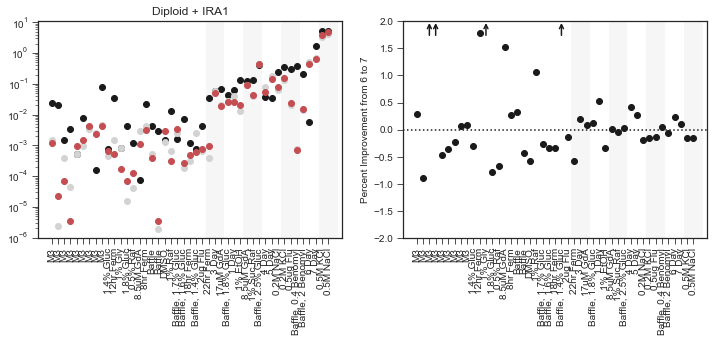

...

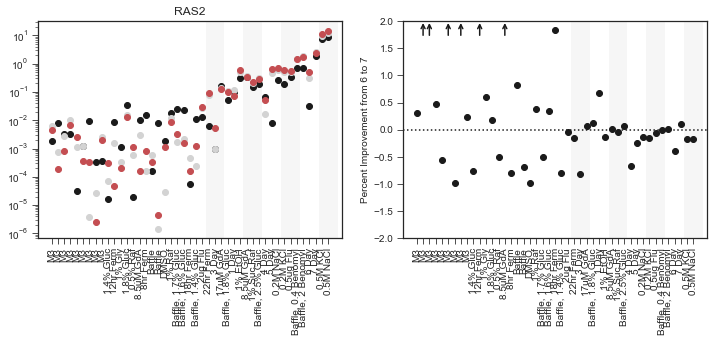

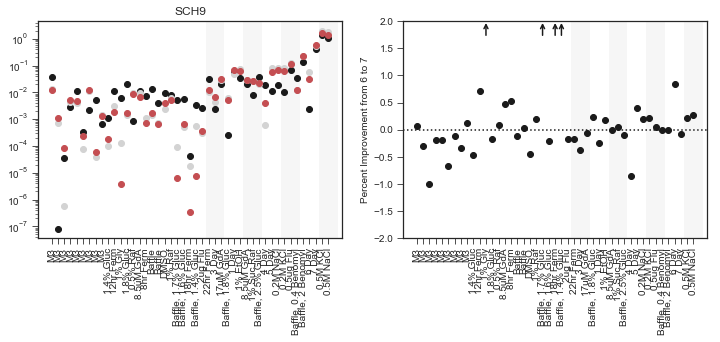

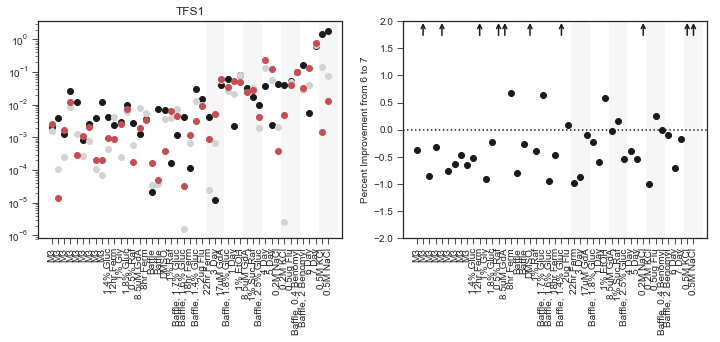

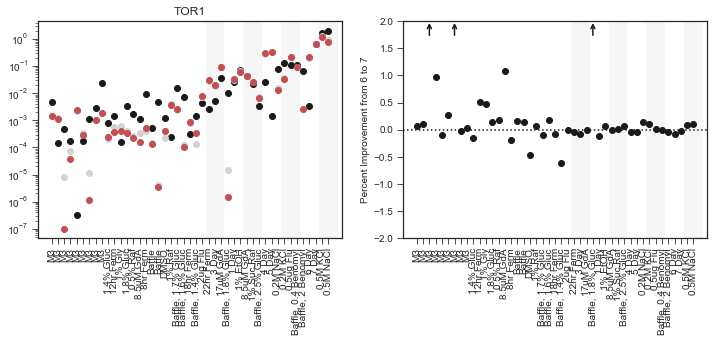

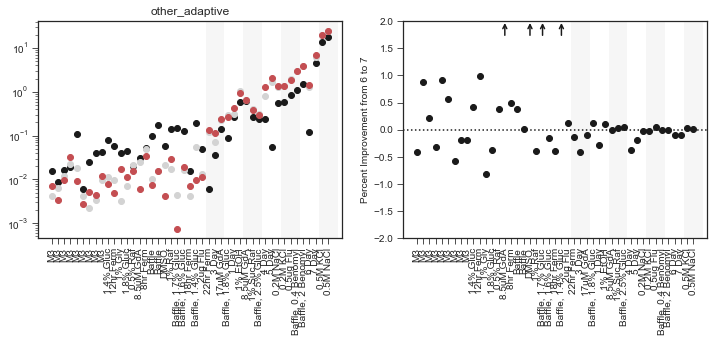

In [78]:
dataset = datasets['subtle_to_strong_wothers']
n_perms = 100
weighted= True
ymax = 1.0
ymin = -1.0

all_guesses = dataset['CV_all_guesses']
both_old = dataset['both_old']
dhats = dataset['dhats']
this_fitness = dataset['this_fitness']
train  = dataset['train']
test = dataset['test']
both_new = dataset['both_new']
guesses = dataset['guesses']
model = dataset['CV_best_rank_index']
test_conditions  = dataset['test_conditions']
train_conditions = dataset['train_conditions']


nonsubtle_fits = []
subtle_fits = []
overall_subtle = []
overall_nonsubtle = []

model_list = [0,3,8]
model_list = [0,5,6]
# model_list = [0,6,7]
# model_list = [0,7,8]
model_colors = ['k','lightgray','r']



all_bcs = sorted(list(dataset['training_bcs'])+list(dataset['testing_bcs']))
# this_fitness = 
# testing_bv

testing_bcs = list(dataset['testing_bcs'])


genes = ['IRA1_nonsense','IRA1_missense','GPB2','PDE2','Diploid','Diploid_adaptive']
genes = np.unique(this_data[this_data['barcode'].isin(testing_bcs)]['mutation_type'].values)

for gene in genes:
    these_bcs = this_data[this_data['mutation_type']==gene]['barcode'].values
    these_bcs = [bc for bc in these_bcs if bc in testing_bcs]
    
    this_f = this_fitness[np.where(np.isin(all_bcs,these_bcs))[0]]
    these_locs = np.where(np.isin(testing_bcs,these_bcs))[0]
    plt.figure(figsize=(12,4))
    plt.subplot(121)
    plt.title(gene)
    
    fits = []
    
    for m,model in enumerate(model_list):
        # this_gene_data = this_data[this_data['barcode'].isin(test_mutant_data)]
        types = this_data[this_data['barcode'].isin(dataset['testing_bcs'])]['mutation_type'].values
        training_types = this_data[this_data['barcode'].isin(dataset['training_bcs'])]['mutation_type'].values

        new_mut_locs = dataset['mut_locs'][model][test[1]]
        old_cond_locs = dataset['cond_locs'][model][train[0]]
        new_cond_locs = dataset['cond_locs'][model][test[0]]   
        these_sigmas = dataset['dimension_weights'][model]
        these_sigmas = these_sigmas[:model+1,:model+1]
        
        new_fits = [np.sum(np.square(this_f[:,i]-np.dot(new_mut_locs,np.dot(these_sigmas,new_cond_locs.T))[these_locs,:][:,i])) for i in range(new_cond_locs.shape[0])]
        old_fits = [np.sum(np.square(this_f[:,i]-np.dot(new_mut_locs,np.dot(these_sigmas,old_cond_locs.T))[these_locs,:][:,i])) for i in range(old_cond_locs.shape[0])]
        
        fits.append(old_fits+new_fits)
        plt.plot(old_fits+new_fits,marker='o',linestyle='',color=model_colors[m])
        plt.yscale('log')
    plt.xticks(range(len(train_conditions+test_conditions)),[renamed_conditions[col.replace('_fitness','')] for col in train_conditions+test_conditions],rotation=90)
    ymin,ymax = plt.ylim()
    
    for i in range(int(np.ceil(len(test_conditions)/3))):
        if (i % 2) == 0:
            # print(i)
            rect = matplotlib.patches.Rectangle((len(train_conditions)+3*i-0.5,ymin),3,ymax-ymin,
                                            linewidth=0,edgecolor='gray',facecolor='gray',alpha=0.07)
        
            plt.gca().add_patch(rect)

    plt.subplot(122)
    
    data = (np.asarray(fits[1])-np.asarray(fits[2]))/(np.asarray(fits[2]))
    plt.plot(data,'ok')
    plt.axhline(0,color='k',linestyle=':')
    plt.xticks(range(len(train_conditions+test_conditions)),[renamed_conditions[col.replace('_fitness','')] for col in train_conditions+test_conditions],rotation=90)
    ymax = 2.0
    plt.ylabel(f'Percent Improvement from {model_list[1]+1} to {model_list[2]+1}')
    
    plt.ylim(-2.0,2.0)
    
    toohigh = np.where(data>ymax)[0]
    low_counter = 0
    for entry in toohigh:
        plt.annotate("", xy=(entry, ymax), xytext=(entry, ymax-0.3),arrowprops=dict(arrowstyle="->",lw=1.5,color='k'))
#         if len(toohigh) > 0:    
#             low_counter += 1
    
    ymin,ymax = plt.ylim()
    
    for i in range(int(np.ceil(len(test_conditions)/3))):
        if (i % 2) == 0:
            # print(i)
            rect = matplotlib.patches.Rectangle((len(train_conditions)+3*i-0.5,ymin),3,ymax-ymin,
                                            linewidth=0,edgecolor='gray',facecolor='gray',alpha=0.07)
        
            plt.gca().add_patch(rect)

Resp_24hr_Transfer_fitness
[  151  6391 60700 71109]
1BB_SucRaf_fitness
[  151  6174 24737 60700]
2.5%_fitness
[  151  6174  6391 60700]
Resp_4Day_Transfer_fitness
[ 6174  6391 23688 71109]
Resp_5Day_Transfer_fitness
[ 6391 23688 60700 71109]
Resp_6Day_Transfer_fitness
[ 6391 23688 60700 71109]


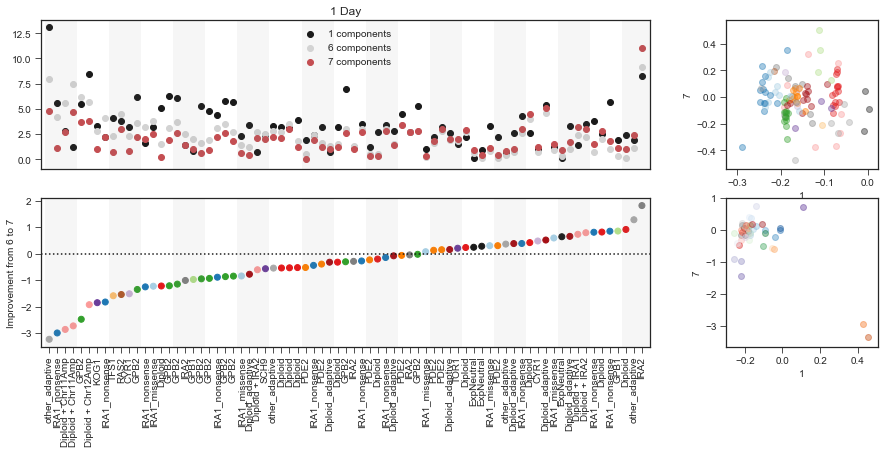

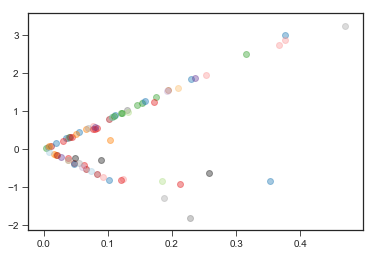

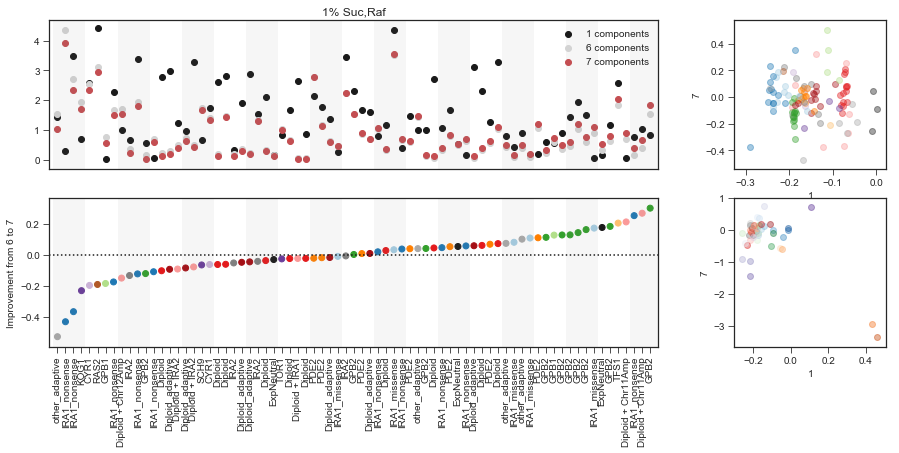

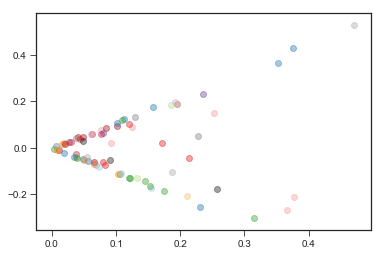

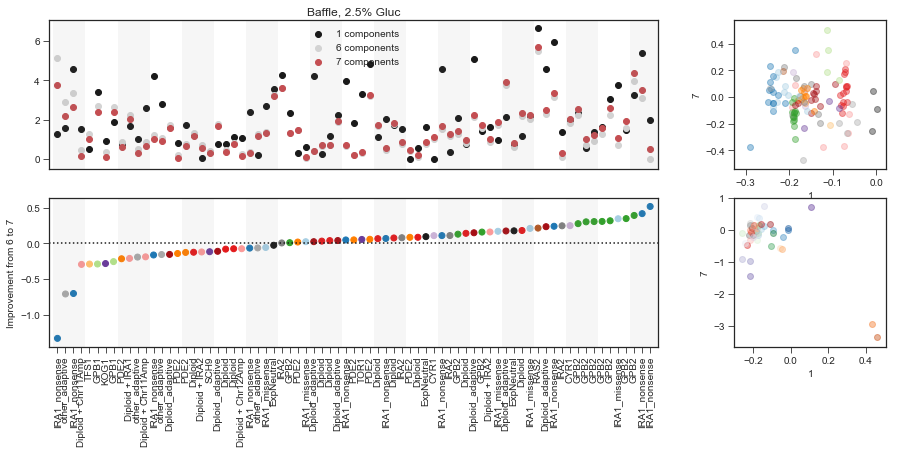

...

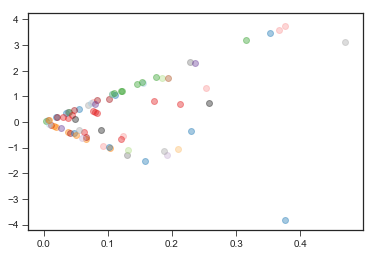

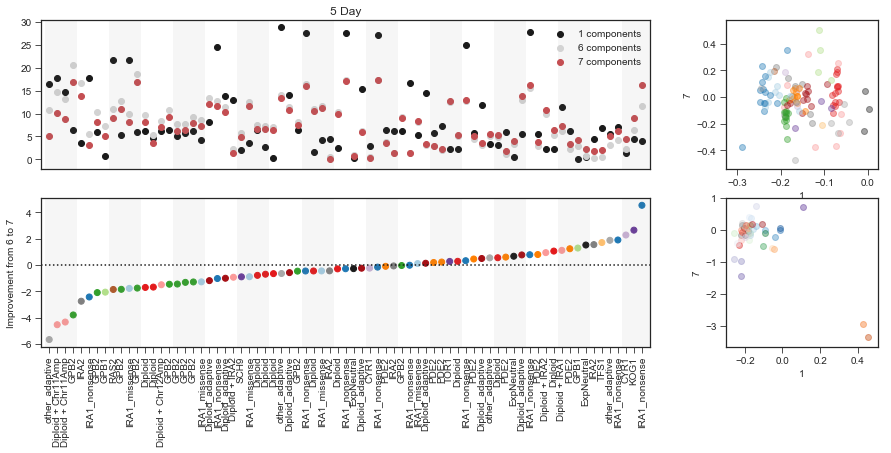

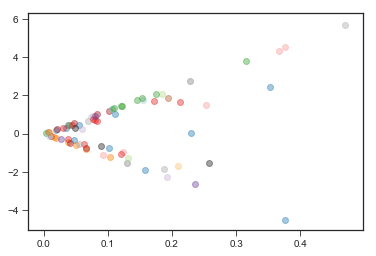

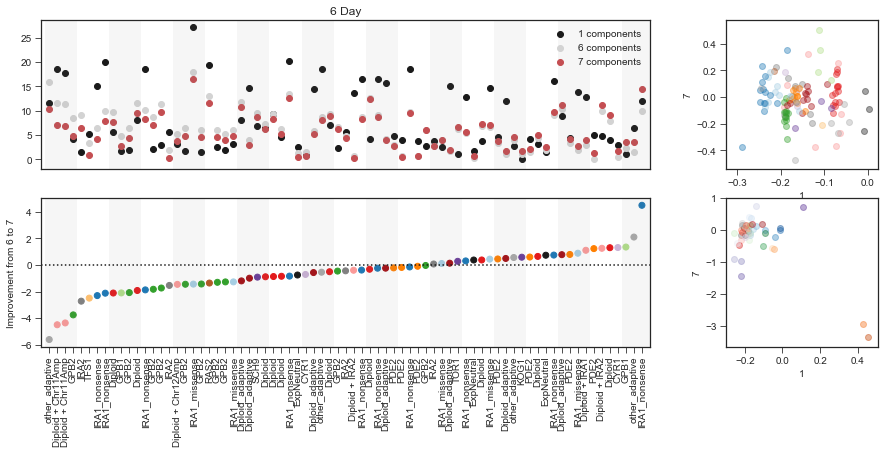

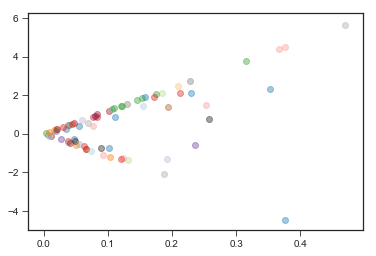

In [145]:
dataset = datasets['subtle_to_strong_wothers']
n_perms = 100
weighted= True
ymax = 1.0
ymin = -1.0

all_guesses = dataset['CV_all_guesses']
both_old = dataset['both_old']
dhats = dataset['dhats']
this_fitness = dataset['this_fitness']
this_error = dataset['this_error']
train  = dataset['train']
test = dataset['test']
both_new = dataset['both_new']
guesses = dataset['guesses']
model = dataset['CV_best_rank_index']
test_conditions  = dataset['test_conditions']
train_conditions = dataset['train_conditions']


nonsubtle_fits = []
subtle_fits = []
overall_subtle = []
overall_nonsubtle = []

model_lists = [[0,3,8],[0,3,4],[0,4,5],[0,5,6],[0,6,7],[0,7,8]]

# model_lists = [[0,21,22]]
# model_list = [0,3,4]
# model_list = [0,4,5]
model_lists = [[0,5,6]]
# model_lists = [[0,6,7]]
# model_list = [0,7,8]
for model_list in model_lists:
    model_colors = ['k','lightgray','r']

    all_conditions = train_conditions + test_conditions


    all_bcs = sorted(list(dataset['training_bcs'])+list(dataset['testing_bcs']))

    testing_bcs = list(dataset['testing_bcs'])

    these_bcs = testing_bcs

    these_genes = this_data[this_data['barcode'].isin(these_bcs)]['mutation_type'].values
    gene_bc = np.asarray([f'{gene} ({bc})' for bc,gene in zip(these_bcs,these_genes)])
    gene_bc = np.asarray([f'{gene}' for bc,gene in zip(these_bcs,these_genes)])


    for condition in interesting_conditions:

        condition_loc = np.where(np.isin(all_conditions,condition))[0][0]

        this_f = this_fitness[np.where(np.isin(all_bcs,these_bcs))[0]]
        this_e = this_error[np.where(np.isin(all_bcs,these_bcs))[0]]

        fits = []

        for m,model in enumerate(model_list):

            new_mut_locs = dataset['mut_locs'][model][test[1]]
            old_cond_locs = dataset['cond_locs'][model][train[0]]
            new_cond_locs = dataset['cond_locs'][model][test[0]]   
            these_sigmas = dataset['dimension_weights'][model]
            these_sigmas = these_sigmas[:model+1,:model+1]

            new_fits = [np.abs(np.dot(new_mut_locs,np.dot(these_sigmas,new_cond_locs.T))[bc,condition_loc-old_cond_locs.shape[0]]-this_f[bc,condition_loc])/this_e[bc,condition_loc] for bc in range(len(these_bcs))]

            sorting  = np.argsort(new_fits)

            fits.append(new_fits)

        data = (np.asarray(fits[1])-np.asarray(fits[2]))/(np.asarray(fits[1]))
        data = (np.asarray(fits[1])-np.asarray(fits[2]))
        data = np.asarray(fits[2])-np.asarray(fits[1])
        sorting = np.argsort(data)
        unsorted_data = copy.copy(data)
        data = data[sorting]
        sorted_genes = these_genes[sorting]

        fig = plt.figure(figsize=(15,6))
        gs = GridSpec(2, 2, width_ratios=[12, 3])
        
        ax1 = fig.add_subplot(gs[0])
        
        
        plt.title(renamed_conditions[condition.replace('_fitness','')])

        for m,model in enumerate(model_list):
            sorted_fits = np.asarray(fits[m])[sorting]
            plt.scatter(range(len(sorted_fits)),sorted_fits,marker='o',color=model_colors[m],label=f'{model+1} components')

        plt.xticks([])
        plt.legend()

        plt.xlim(-1,len(these_bcs))
        ymin,ymax = plt.ylim()

        for i in range(int(np.ceil(len(these_bcs)/4))):
            if (i % 2) == 0:
                # print(i)
                rect = matplotlib.patches.Rectangle((0+4*i-0.5,ymin),4,ymax-ymin,
                                                linewidth=0,edgecolor='gray',facecolor='gray',alpha=0.07)

                plt.gca().add_patch(rect)

        ax3 = fig.add_subplot(gs[2])

        plt.scatter(range(len(data)),data,marker='o',color=[mutant_colorset[gene] for gene in sorted_genes])


        plt.axhline(0,color='k',linestyle=':')
        plt.xticks(range(len(these_bcs)),sorted_genes,rotation=90)
        
        print(condition)
        print(this_data[this_data['barcode'].isin(np.asarray(testing_bcs)[sorting][:4])]['barcode'].values)

        ymin = -1.0
        ymax = 4.0
        plt.ylabel(f'Improvement from {model_list[1]+1} to {model_list[2]+1}')

        plt.xlim(-1,len(these_bcs))
        ymin,ymax = plt.ylim()

        for i in range(int(np.ceil(len(these_bcs)/4))):
            if (i % 2) == 0:
                # print(i)
                rect = matplotlib.patches.Rectangle((0+4*i-0.5,ymin),4,ymax-ymin,
                                                linewidth=0,edgecolor='gray',facecolor='gray',alpha=0.07)

                plt.gca().add_patch(rect)
                
        ax2 = fig.add_subplot(gs[1])
        
        mut_locs = dataset['mut_locs'][model_list[2]]
        
        these_genes = this_data[this_data['barcode'].isin(all_bcs)]['mutation_type'].values

        for bc in range(mut_locs.shape[0]):
            plt.scatter(mut_locs[bc,model_list[0]],mut_locs[bc,model_list[2]],color=mutant_colorset[these_genes[bc]],marker='o',alpha=0.4)

        plt.xlabel(model_list[0]+1)
        plt.ylabel(model_list[2]+1)

        ax4 = fig.add_subplot(gs[3])
        
        cond_locs = dataset['cond_locs'][model_list[2]]



        for c in range(cond_locs.shape[0]):
            plt.scatter(cond_locs[c,model_list[0]],cond_locs[c,model_list[2]],color=condition_colorset[all_conditions[c].replace('_fitness','')],marker='o',alpha=0.4)

        plt.xlabel(model_list[0]+1)
        plt.ylabel(model_list[2]+1)

        plt.savefig(f'improvement_by_mutant_{condition}_{model_list[1]+1}_to_{model_list[2]+1}_wspace.pdf',bbox_inches='tight')
        
        plt.figure()
        
        these_genes = this_data[this_data['barcode'].isin(list(dataset['testing_bcs']))]['mutation_type'].values
        
        for bc in range(new_mut_locs.shape[0]):
            plt.scatter(np.abs(new_mut_locs[bc,model_list[2]]),-unsorted_data[bc],color=mutant_colorset[these_genes[bc]],alpha=0.4)
            
            
            
            

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


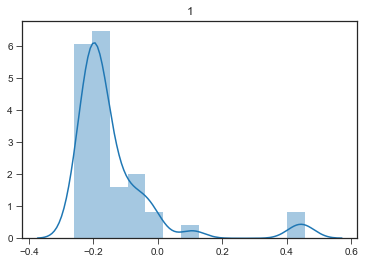

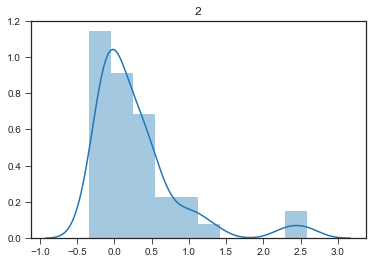

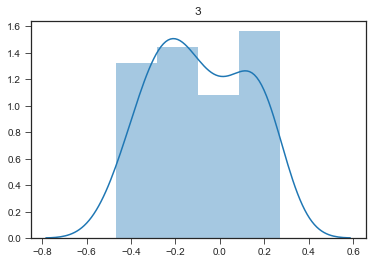

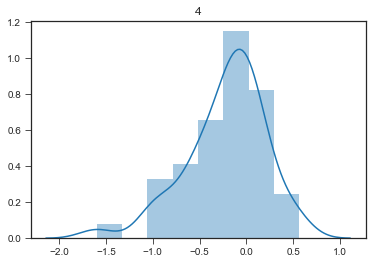

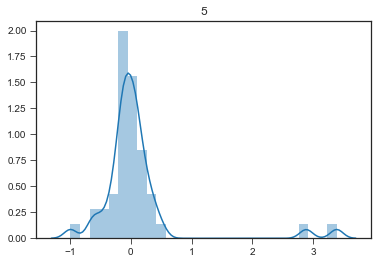

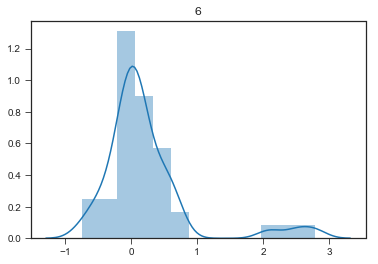

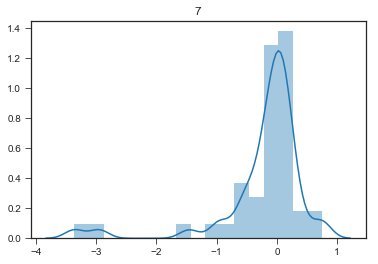

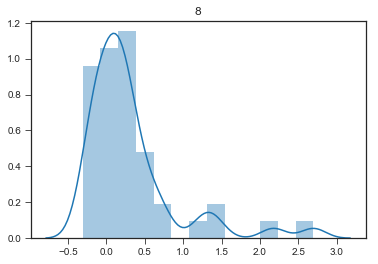

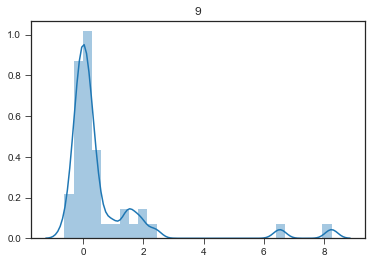

In [494]:
for i in range(9):
    plt.figure()
    plt.title(i+1)
    sns.distplot(dataset['cond_locs'][8][:,i])

SyntaxError: invalid syntax (<ipython-input-278-c6fc5b97f08e>, line 9)

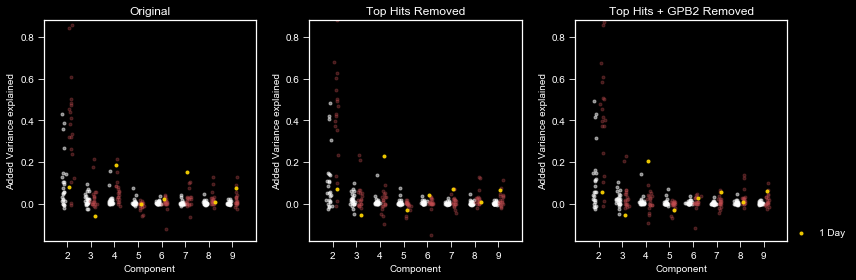

In [77]:
bc_removal = []
bc_removal.append([])
bc_removal

bc_removal.append([151,6391,60700,71109])
bc_removal.append(sorted(bc_removal[1] + list(this_data[this_data['mutation_type']=='GPB2']['barcode'].values)))

model = 8
end = model + 1
start = 0

removal_names = ['Original','Top Hits Removed','Top Hits + GPB2 Removed']

plt.figure(figsize=(12,4))


for m in range(3):
                  
    overall_subtle, subtle_fits, overall_nonsubtle, nonsubtle_fits = tools.fits_by_condition(dataset,this_data,bc_removal=bc_removal[m],max_model=9)


    subtle_swapped =np.asarray(subtle_fits).swapaxes(0,1)
    fits_swapped =np.asarray(nonsubtle_fits).swapaxes(0,1)

    focal_conditions = []

    interesting_locs = np.where(np.isin(test_conditions,interesting_conditions))[0]
    uninteresting_locs = np.where(~np.isin(test_conditions,interesting_conditions))[0]



    plt.subplot(1,3,m+1)
    plt.title(removal_names[m])
    
    plt.xticks(range(fits_swapped.shape[1]-1),range(2,fits_swapped.shape[1]+2))
    plt.ylabel('Added Variance explained')
    plt.xticks(range(end-1),range(2+start,end+1))
    plt.ylabel('Added Variance explained')
    plt.xlabel('Component')
    plt.ylim(-0.18,0.88)
    plt.xlim(-1,8)

    for c in range(subtle_swapped.shape[0]):
        plt.scatter([tools.jitter_point(i-0.15,0.05) for i in range(len(np.diff(subtle_swapped[c,:end])[start:]))],np.diff(subtle_swapped[c,:end])[start:],color='white',alpha=0.5,marker='.')

    plt.savefig(f'talk_figures/build_up_{m}_0.pdf',bbox_inches='tight')
    
    for c in uninteresting_locs:
        plt.scatter([tools.jitter_point(i+0.15,0.05) for i in range(len(np.diff(fits_swapped[c,:end])[start:]))],np.diff(fits_swapped[c,:end])[start:],color='r',alpha=0.3,marker='.')
    
    plt.savefig(f'talk_figures/build_up_{m}_1.pdf',bbox_inches='tight')
    


    for c,col in zip(interesting_locs,interesting_conditions):
        plt.scatter([tools.jitter_point(i+0.15,0.05) for i in range(len(np.diff(fits_swapped[c,:end])[start:]))],np.diff(fits_swapped[c,:end])[start:],
                    color='gold',marker='.',alpha=0.9,label=renamed_conditions[col.replace('_fitness','')])
    if m == 2:
        plt.legend(loc=(1.0,0.0))

    
    plt.savefig(f'talk_figures/build_up_{m}_2.pdf',bbox_inches='tight')
plt.tight_layout()
plt.savefig(f'talk_figures/added_VE_interesting_withothers_{start}_{end}_removehits_progression.pdf',bbox_inches='tight')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


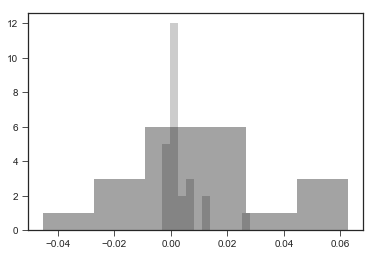

In [199]:
sns.distplot(np.diff(subtle_swapped[:,:end])[:,5],color='gray',kde=False)
sns.distplot(np.diff(fits_swapped[:,:end])[:,5],color='k',kde=False)

In [44]:
example_names = ['1.8%','Resp_24hr_Transfer','1BB_1%EtOH','Ben2','1BB_0.5MNaCl']

for m in range(1,10):
    graphs.Figure4_w_examples(datasets['subtle_to_strong_wothers'],gene_list,this_data,[col + '_fitness' for col in example_names],model=m,style='dark')
    plt.savefig(f'Figure4_with_prediction_examples_weighted_bytype_m{m}.pdf',bbox_inches='tight')

TypeError: Figure4_w_examples() got an unexpected keyword argument 'model'

In [47]:
graphs.prediction_examples(datasets['subtle_to_strong_wothers'],gene_list,this_data,interesting_conditions,models=[0,3,8],style='dark')

TypeError: prediction_examples() missing 1 required positional argument: 'example_conditions'

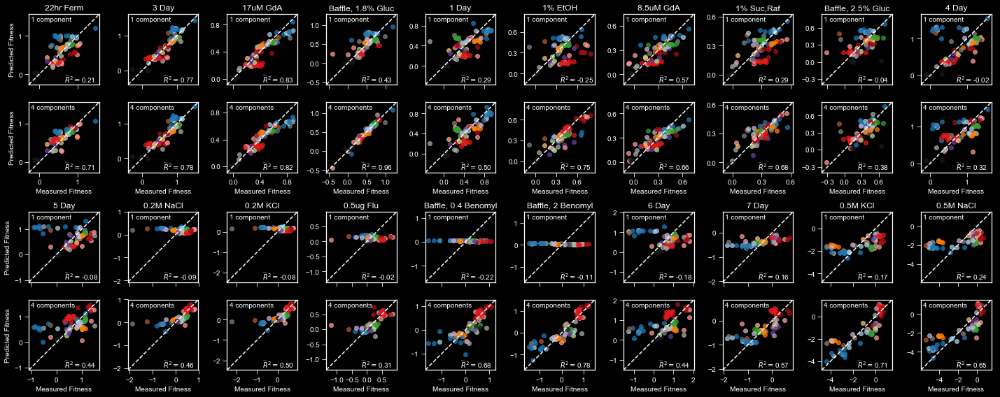

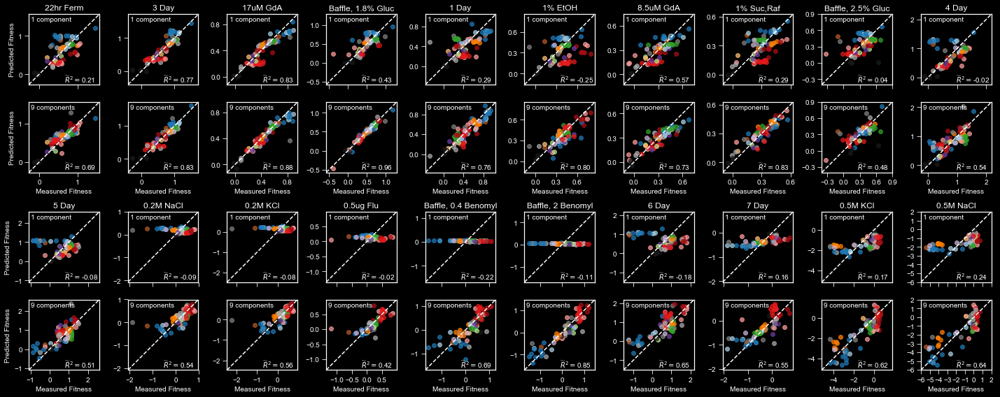

In [43]:
example_names = ['1.8%','Resp_24hr_Transfer','1BB_1%EtOH','Ben2','1BB_0.5MNaCl']
example_names = datasets['subtle_to_strong_wothers']['test_conditions']
# example_names = interesting_conditions

for model in [3,8]:
#     model = 8

    graphs.all_example_predictions(datasets['subtle_to_strong_wothers'],gene_list,this_data,example_names,model=[model],style='dark')
    plt.savefig(f'talk_figures/all_predictions_weighted_by_types_model{model+1}.pdf',bbox_inches='tight')


In [ ]:
def predictions_figure(ax,train,test,this_fitness,both_new,guesses,model,test_conditions):
    
    plt.axhline(0,color='gray',linestyle=':')

    perms = np.zeros(both_new.shape[1])

    n_perms = 1000
    for i in range(n_perms):
        perm_out = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,permuted_conditions=True)
        perm = np.asarray([tools.var_explained(both_new[:,i],perm_out[5][5][:,i])[0] for i in range(both_new.shape[1])])
        perms = perms + perm
        plt.plot(perm,color='gray',alpha=0.01)
    plt.plot((perms/n_perms),color='k',alpha=0.8,label='Permutation Average')

    dumb = np.asarray([tools.var_explained(both_new[:,i],guesses[0][:,i])[0] for i in range(both_new.shape[1])])
    plt.plot(dumb,color='k',linestyle='--',alpha=0.8,label='1 component model')


    colors=['r','b','g','m','orange']
    for m,model in enumerate(range(5,6)):
        this_sse = np.asarray([tools.var_explained(both_new[:,i],guesses[model][:,i])[0] for i in range(both_new.shape[1])])
        
        plt.plot(this_sse,'o-',label=f'{model+1} component model',color='r',alpha=1.0)
        
    # for i in range(100):
    #     perm_out = tools.SVD_predictions_train_test(this_fitness,train,test,by_condition=True,permuted_mutants=True)
    #     perm = np.asarray([tools.sum_squared_error(perm_out[5][5][:,i],both_new[:,i]) for i in range(both_new.shape[1])])
    #     plt.plot((dumb - perm)/(dumb - min_sse),color='orange',linestyle='--')

    plt.ylabel(r'Weighted Coefficient of Determination ($\tilde R^2$)')

    plt.xticks(range(len(test_conditions)),[renamed_conditions[col.replace('_fitness','')] for col in test_conditions],rotation=90)
    plt.legend()

    plt.ylim(-1.0,1.0)

    return ax


16 0.5515579870751841
17 0.5536997204216254
18 0.5498561944448608
19 0.521928935315737
20 0.48509181111810484
21 0.554917025026895
22 0.5117349166170635
23 0.4616869326920272
24 0.43490305689546127
25 -0.1623210463401068


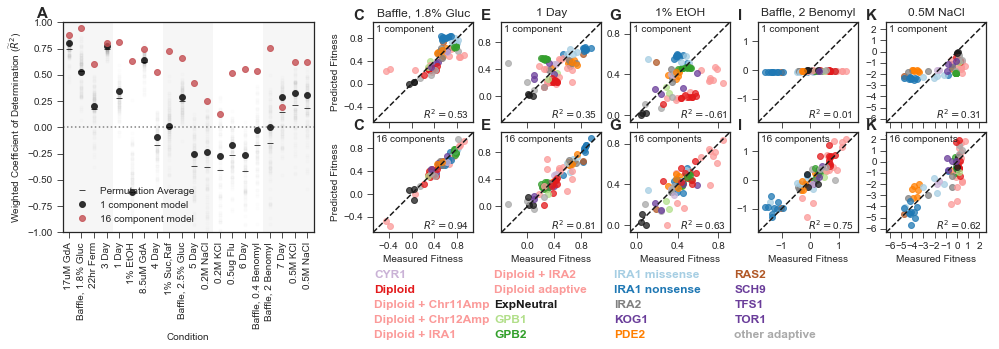

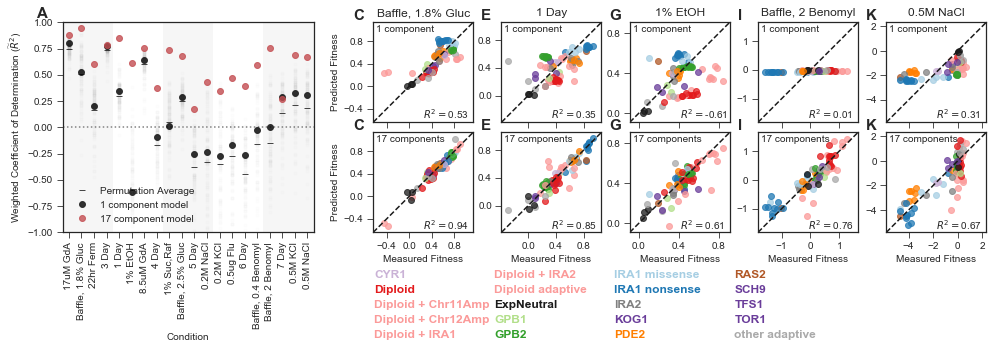

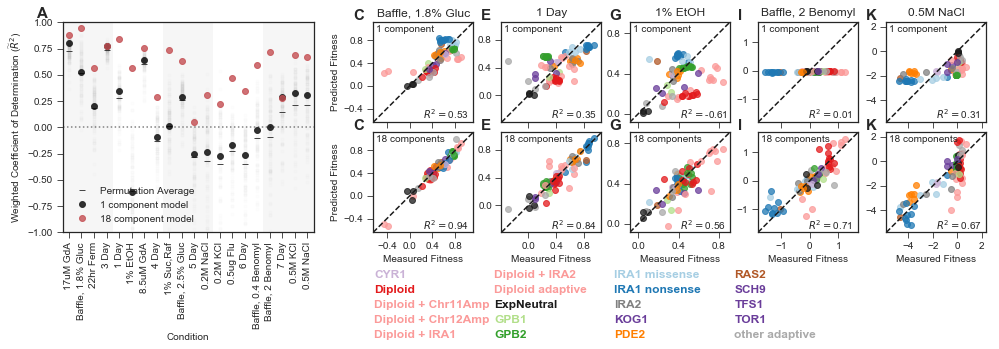

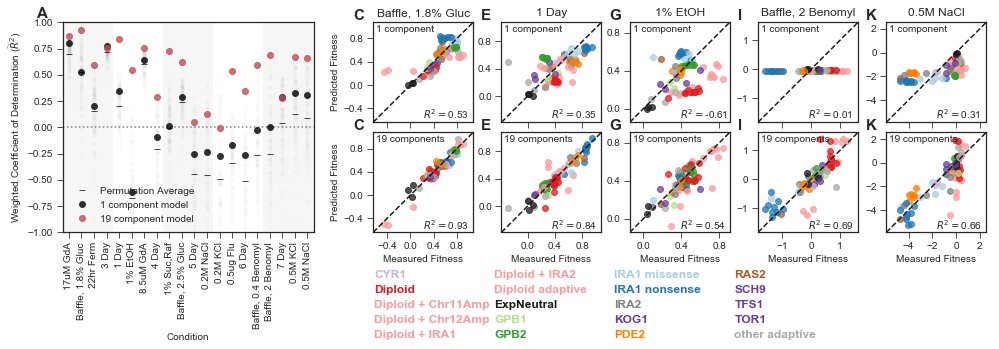

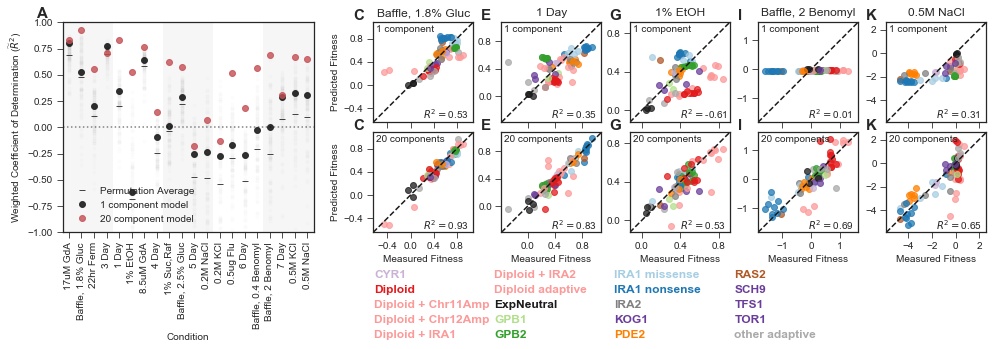

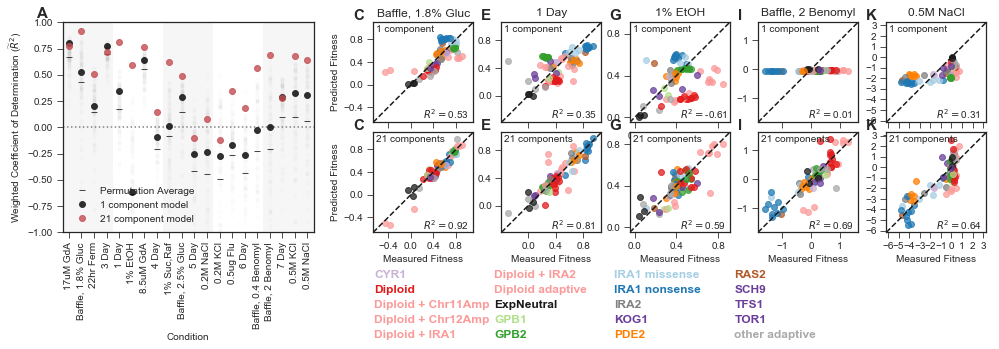

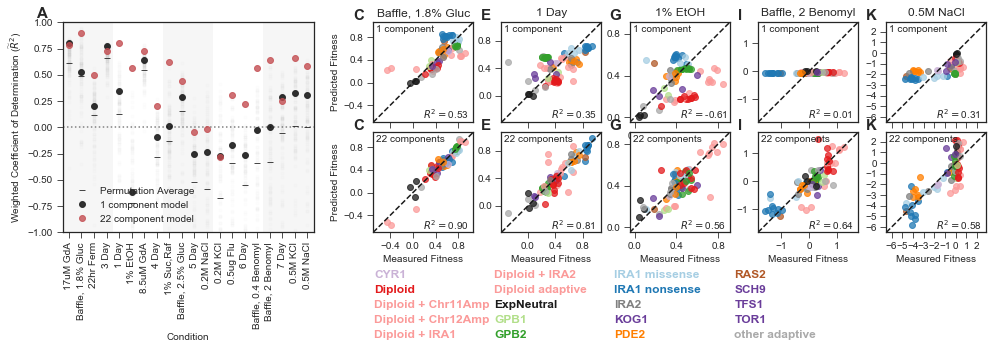

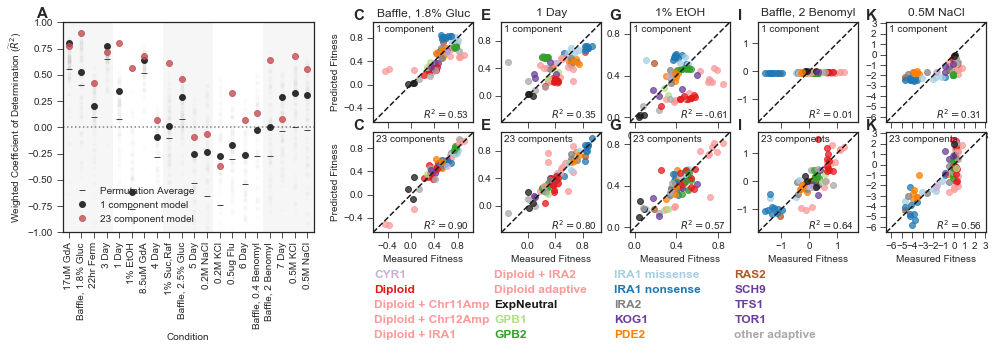

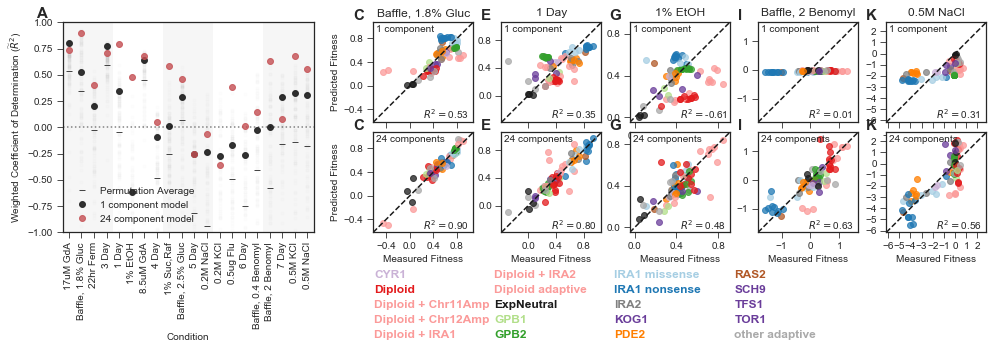

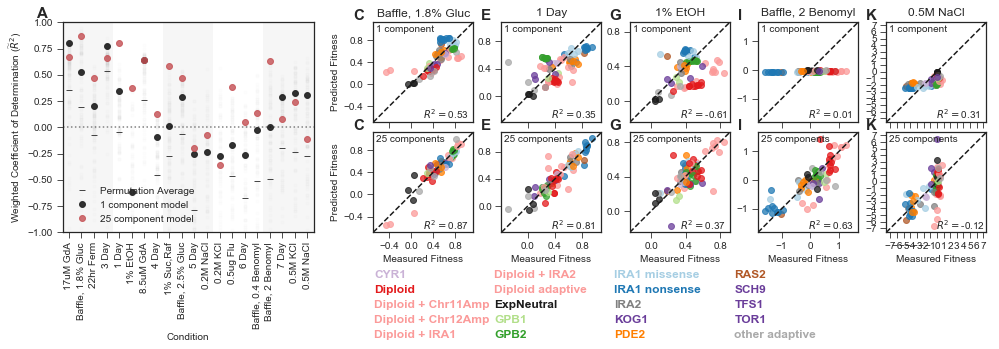

In [382]:
example_names = ['1.8%','Resp_24hr_Transfer','1BB_1%EtOH','Resp_7Day_Transfer','1BB_0.5MNaCl']
example_names = ['1.8%','Resp_24hr_Transfer','1BB_1%EtOH','Ben2','1BB_0.5MNaCl']

for model in range(15,25):
#     print(model)
    graphs.Figure4_w_examples(datasets['subtle_to_strong_wothers'],gene_list,this_data,[col + '_fitness' for col in example_names],model=model,weighted=False)
#     graphs.Figure4_w_examples(datasets['subtle_to_strong_wothers'],gene_list,this_data,[col + '_fitness' for col in example_names],model=7)
    plt.savefig(f'Figure4_with_prediction_unweighted_model{model+1}.pdf',bbox_inches='tight')

([<matplotlib.axis.XTick at 0x1283efc18>,
 <a list of 24 Text xticklabel objects>)

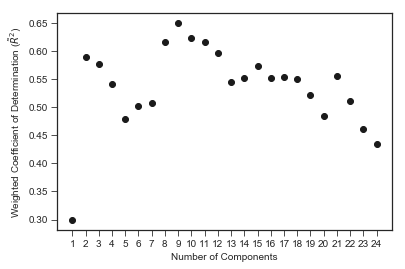

In [277]:
cv_values = [0.2984412167095204,0.5887318188076909,0.5764502524371644,0.5414193748799792,0.4790682295380243,
             0.5016388822903111,0.5082570565632776,0.6153698300986921,0.6503754821806228,0.6230326007527796,
             0.6169247872271322,0.5958623733176137,0.5445706750898864,0.5514775214938918,0.5742409349768096,
             0.5515579870751841,0.5536997204216254,0.5498561944448608,0.521928935315737,0.48509181111810484,
             0.554917025026895,0.5117349166170635,0.4616869326920272,0.43490305689546127
            ]

plt.plot(cv_values,'ko')
plt.ylabel(r'Weighted Coefficient of Determination ($\tilde R^2$)')
plt.xlabel('Number of Components')
plt.xticks(range(len(cv_values)),range(1,len(cv_values)+1))
# plt.savefig('overall_prediction.pdf',bbox_inches='tight')

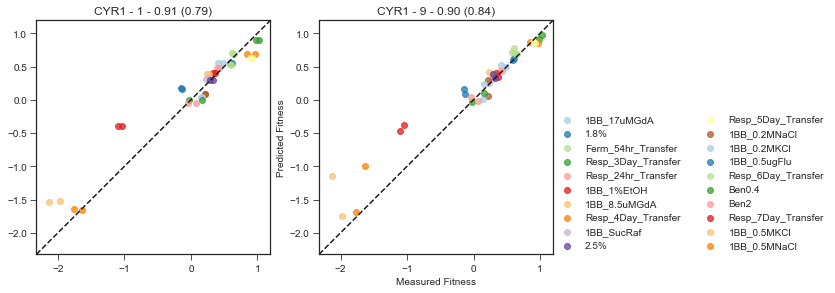

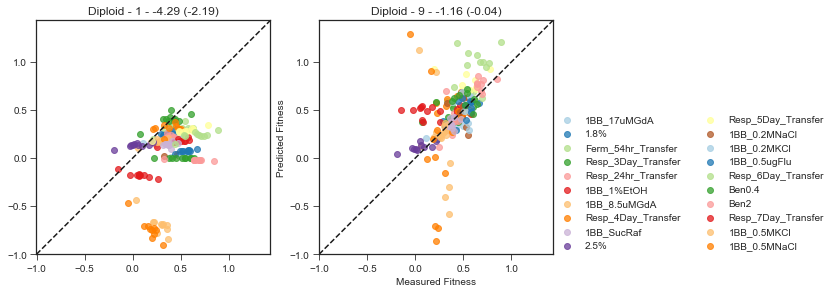

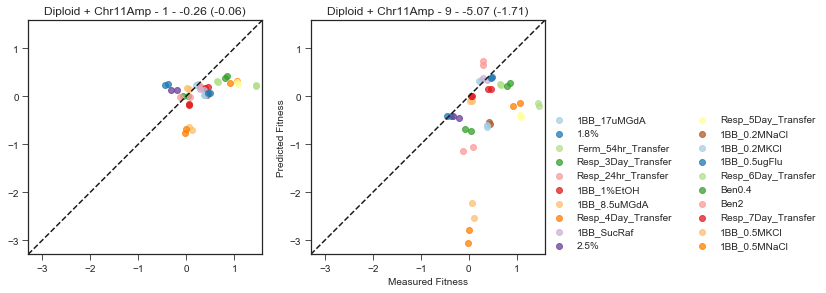

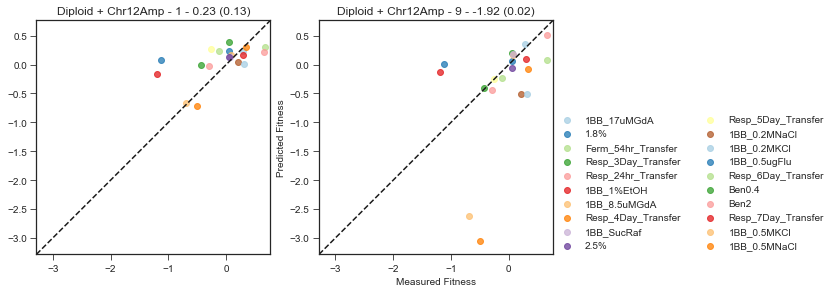

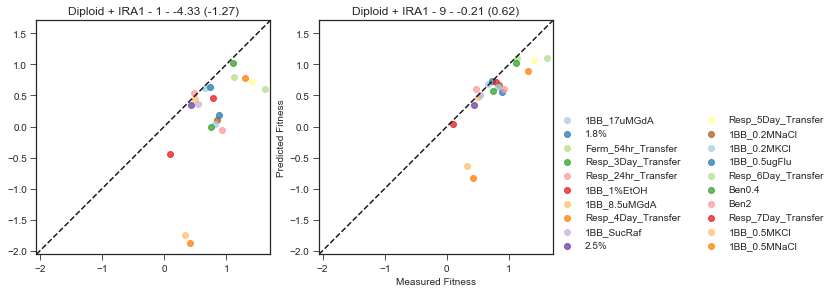

...

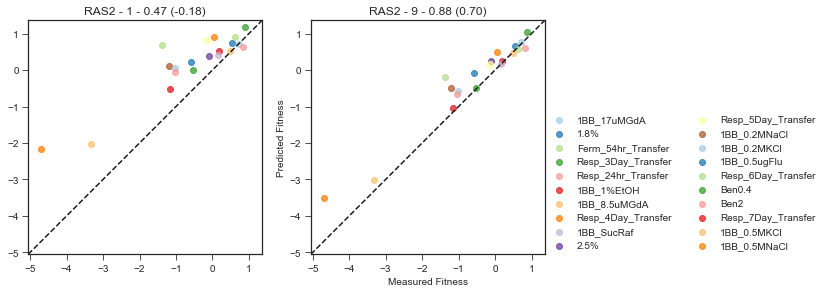

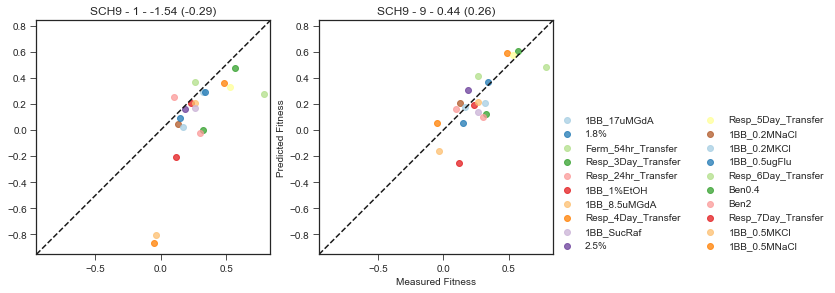

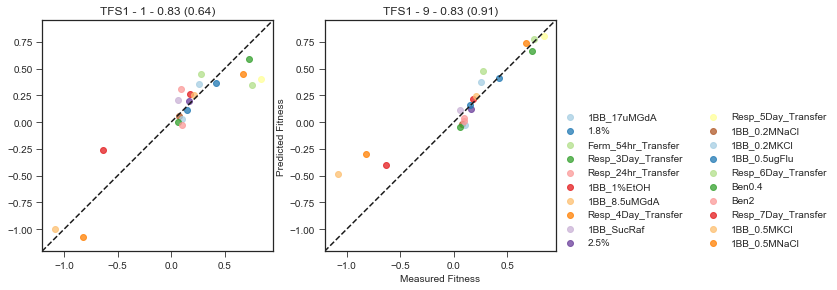

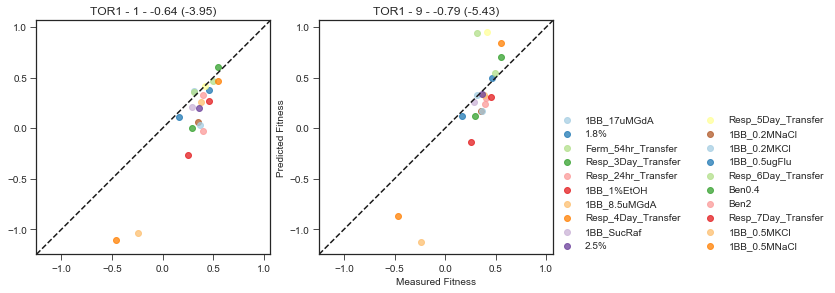

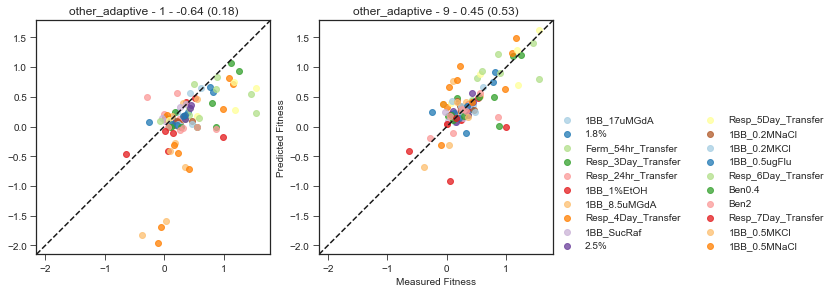

In [402]:
list_to_try = np.unique(this_gene_data['mutation_type'].values)

sets_to_try = ['subtle_to_strong_wothers']
for this_set in sets_to_try:
    test_mutant_data = datasets[this_set]['testing_bcs']
    test_conditions = datasets[this_set]['test_cols']
    guesses = datasets[this_set]['guesses']
    best_rank = datasets[this_set]['CV_best_rank_index']
    
    condition_colors = {col:sns.color_palette('Paired',len(test_conditions))[c] for c,col in enumerate(test_conditions)}
    
    this_gene_data = test_mutant_data
    this_gene_data = this_data[this_data['barcode'].isin(test_mutant_data)]

    this_gene_locs = range(len(this_gene_data))
#     jitters = [tools.jitter_point(0,0.01) for bc in range(len(this_gene_data[test_conditions[0]].values)) ]
    for gene in list_to_try:
        this_class = this_gene_data[this_gene_data['mutation_type']==gene]
        this_gene_locs = np.where(np.isin(test_mutant_data,this_class['barcode'].values))[0]
        plt.figure(figsize=(8,4))
        ax1= plt.subplot(1,2,1)
        rank = 0
       
        fit = tools.var_explained(this_class[test_conditions].values,guesses[rank][this_gene_locs,:])[0]
        close_fit = tools.var_explained(this_class[test_conditions[:-2]].values,guesses[rank][this_gene_locs,:-2])[0]
        plt.title(f'{gene} - {rank+1} - {fit:.2f} ({close_fit:.2f})')

        for i,col in enumerate(test_conditions):
            for bc in range(len(this_class[col].values)):
                if bc == 0:
                    plt.scatter(this_class[col].values[bc],guesses[rank][this_gene_locs[bc],i],
                            color=condition_colors[col],alpha=0.75,label=col.replace('_fitness',''))
                else:
                    plt.scatter(this_class[col].values[bc],guesses[rank][this_gene_locs[bc],i],
                            color=condition_colors[col],alpha=0.75)
        xmin1,xmax1 = plt.xlim()
        ymin1,ymax1 = plt.ylim()
        
        ax2 = plt.subplot(1,2,2)
        rank = best_rank
        rank = 8
        fit = tools.var_explained(this_class[test_conditions].values,guesses[rank][this_gene_locs,:])[0]
        close_fit = tools.var_explained(this_class[test_conditions[:-2]].values,guesses[rank][this_gene_locs,:-2])[0]
        plt.title(f'{gene} - {rank+1} - {fit:.2f} ({close_fit:.2f})')
        
        for i,col in enumerate(test_conditions):     
            for bc in range(len(this_class[col].values)):
                if bc == 0:
                    plt.scatter(this_class[col].values[bc],guesses[rank][this_gene_locs[bc],i],
                            color=condition_colors[col],alpha=0.75,label=col.replace('_fitness',''))
#                     plt.errorbar(this_class[col].values[bc],guesses[rank][this_gene_locs[bc],i],xerr=this_class[col.replace('_fitness','_error')].values[bc],
#                             color=condition_colors[col],alpha=0.75)
                else:
                    plt.scatter(this_class[col].values[bc],guesses[rank][this_gene_locs[bc],i],
                            color=condition_colors[col],alpha=0.75)
#                     plt.errorbar(this_class[col].values[bc],guesses[rank][this_gene_locs[bc],i],xerr=this_class[col.replace('_fitness','_error')].values[bc],
#                             color=condition_colors[col],alpha=0.75)
        xmin2,xmax2 = plt.xlim()
        ymin2,ymax2 = plt.ylim()
        
        bigmin = min([xmin1,ymin1,xmin2,ymin2])
        bigmax = max([xmax1,ymax1,xmax2,ymax2])

        for ax in [ax1,ax2]:
            plt.sca(ax)
            plt.plot([bigmin,bigmax],[bigmin,bigmax],'k--')
            # plt.tight_layout()
            plt.xlim(bigmin,bigmax)
            plt.ylim(bigmin,bigmax)
            plt.gca().set_aspect('equal')

#             loc = plticker.MultipleLocator(base=tick_base_calculator(bigmin,bigmax)) # this locator puts ticks at regular intervals
#             ax.xaxis.set_major_locator(loc)
#             ax.yaxis.set_major_locator(loc)
            plt.tight_layout()
        plt.xlabel('Measured Fitness')
        plt.ylabel('Predicted Fitness')
        plt.legend(ncol=2,loc=(1.0,0.0))
    #             plt.savefig(f'predictions/predictions_by_gene_{this_set}_{col.replace("/","")}_{rank+1}components_lims.pdf',bbox_inches='tight')

In [407]:
list_to_try = np.unique(this_gene_data['mutation_type'].values)

sets_to_try = ['subtle_to_strong_wothers']
for this_set in sets_to_try:
    test_mutant_data = datasets[this_set]['testing_bcs']
    test_conditions = datasets[this_set]['test_cols']
    guesses = datasets[this_set]['guesses']
    best_rank = datasets[this_set]['CV_best_rank_index']
    best_rank = 8
    
    condition_colors = {col:sns.color_palette('Paired',len(test_conditions))[c] for c,col in enumerate(test_conditions)}
    
    this_gene_data = test_mutant_data
    this_gene_data = this_data[this_data['barcode'].isin(test_mutant_data)]

    this_gene_locs = range(len(this_gene_data))
    
    mse_array1 = np.zeros((len(list_to_try),len(test_conditions)))
    mse_arraybest = np.zeros((len(list_to_try),len(test_conditions)))
#     jitters = [tools.jitter_point(0,0.01) for bc in range(len(this_gene_data[test_conditions[0]].values)) ]
    for g,gene in enumerate(list_to_try):
        this_class = this_gene_data[this_gene_data['mutation_type']==gene]
        this_gene_locs = np.where(np.isin(test_mutant_data,this_class['barcode'].values))[0]
        
        rank = 0

        for i,col in enumerate(test_conditions):
#             print(this_class[col].values)
            
            mse_array1[g,i] = np.mean(np.square(this_class[col].values-guesses[0][this_gene_locs,i]))
            mse_arraybest[g,i] = np.mean(np.square(this_class[col].values-guesses[best_rank][this_gene_locs,i]))

        


In [ ]:
# sets_to_try = ['subtle_to_strong','strong_to_subtle','subtle_to_strong_wothers','strong_to_subtle_wothers','subtle_to_VERYstrong','intermediate_to_VERYstrong','subtle_to_4strongest','intermediate_to_4strongest']
# sets_to_try = ['subtle_to_strong','subtle_to_strong_wothers','subtle_to_strong_wothers_to_minimal','subtle_to_strong_minimal_to_wothers']
# sets_to_try = [this_set + '_likelihood' for this_set in sets_to_try]
gene_list = ['IRA1_nonsense','GPB2','PDE2','Diploid']
sets_to_try = ['subtle_to_strong_wothers']

for this_set in sets_to_try:

    graphs.Figure5(datasets[this_set],gene_list,model=[3,8])
    plt.savefig(f'Figure5_mseDISTANCE_{this_set}_centroid_4_9.pdf',bbox_inches='tight')
    
    


In [17]:
key = 'subtle_to_strong_wothers'
datasets[key]['this_fitness'] 

fit, train_muts, test_muts, train_cond, test_cond = SVD_mixnmatch_locations(this_fitness,train,test,range(model))
all_muts = np.concatenate((train_muts,test_muts))
all_muts = all_muts[np.argsort(np.concatenate((train[1],test[1])))]

# data_situation['mut_locs'].append(all_muts)
# data_situation['distances'].append(distance.pdist(all_muts))

geom_medians = {}
avg_pairwise = {}
distances_from_median = {}

for gene in gene_list:
    these_locs = np.where(np.isin(used_mutants,this_data[this_data['mutation_type']==gene]['barcode'].values))
    geom_medians[gene] = geometric_median(all_muts[these_locs,:][0])
    avg_pairwise[gene] = np.mean(distance.pdist(all_muts[these_locs,:][0]))


    distances_from_median[gene] = []
    for loc in these_locs[0]:
        distances_from_median[gene].append(distance.euclidean(all_muts[loc,:][0],geom_medians[gene]))

NameError: name 'SVD_mixnmatch_locations' is not defined

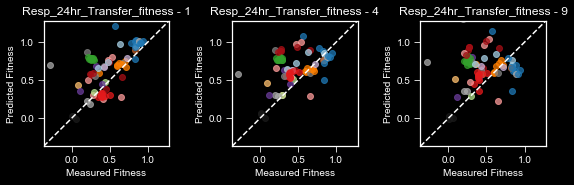

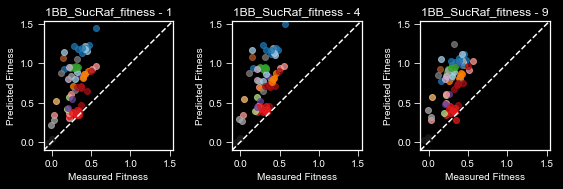

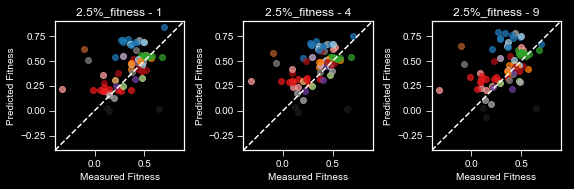

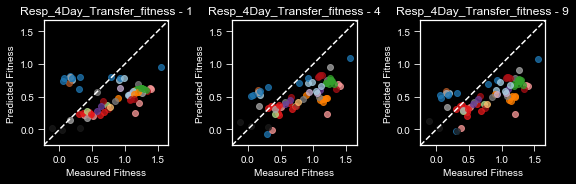

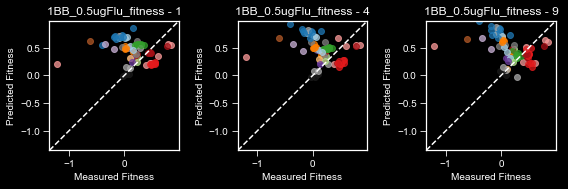

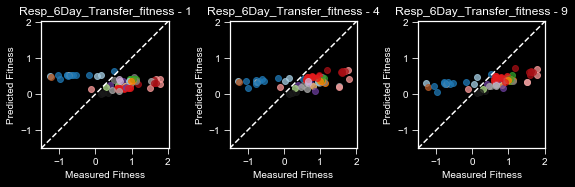

In [34]:
sets_to_try = ['subtle_to_strong_wothers']
for this_set in sets_to_try:
    test_mutant_data = datasets[this_set]['testing_bcs']
    test_conditions = datasets[this_set]['test_cols']
    guesses = datasets[this_set]['guesses']
    best_rank = datasets[this_set]['CV_best_rank_index']
    
    this_gene_data = test_mutant_data
    this_gene_data = this_data[this_data['barcode'].isin(test_mutant_data)]

    this_gene_locs = range(len(this_gene_data))
#     jitters = [tools.jitter_point(0,0.01) for bc in range(len(this_gene_data[test_conditions[0]].values)) ]

#     for i,col in enumerate(test_conditions):
    for i,col in enumerate(interesting_conditions):
        plt.figure(figsize=(8,4))
        
        for r,rank in enumerate([0,3,8]):
            plt.subplot(1,3,r+1)
            plt.title(f'{col} - {rank+1}')
            for bc in range(len(this_gene_data[col].values)):
    #             plt.scatter(this_gene_data[col].values[bc],guesses[rank][this_gene_locs[bc],i],color=mutant_colorset[this_gene_data['gene'].values[bc]],alpha=0.6)
                plt.scatter(this_gene_data[col].values[bc],guesses[rank][this_gene_locs[bc],i],color=mutant_colorset[this_gene_data['mutation_type'].values[bc]],alpha=0.75)
#                 plt.errorbar(this_gene_data[col].values[bc],guesses[rank][this_gene_locs[bc],i],xerr=this_gene_data[col.replace('_fitness','_error')].values[bc],\
#                              color=mutant_colorset[this_gene_data['mutation_type'].values[bc]],alpha=0.75)

            if rank == 0:
                xmin,xmax = plt.xlim()
                ymin,ymax = plt.ylim()
            plt.xlim(min(xmin,ymin),max(xmax,ymax))
            plt.ylim(min(xmin,ymin),max(xmax,ymax))
            plt.tight_layout()
            plt.plot([min(xmin,ymin),max(xmax,ymax)],[min(xmin,ymin),max(xmax,ymax)],'w--')
            plt.gca().set_aspect('equal')
            plt.xlabel('Measured Fitness')
            plt.ylabel('Predicted Fitness')
            plt.savefig(f'talk_figures/predictions/predictions_by_gene_{this_set}_{col.replace("/","")}_{rank+1}components_lims.pdf',bbox_inches='tight')

Identify the number of axes of difference GPB2 and PDE conditions have. Look only at GPB2, PDE2 mutants, center data, then PCA, then uncenter.

In [ ]:
datasets['subtle_to_strong_wothers'] = tools.situate_data(this_data,list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle]),list(sorted_nonm3_cols[first_nonsubtle:]),
                  minimal_wothers_training_bcs,minimal_wothers_testing_bcs,gene_list)

TypeError: 'dict_keys' object does not support indexing

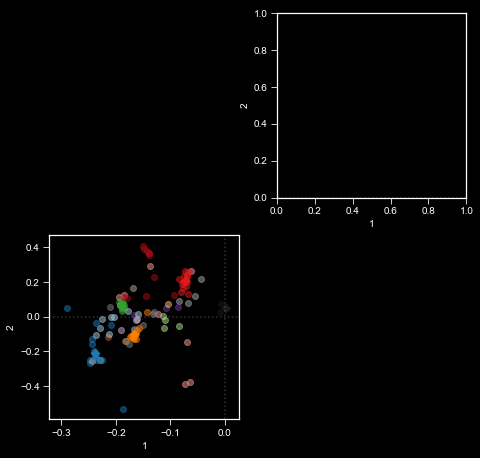

In [78]:
## space that isn't oriented at all

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']

all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers']['geom_medians'][model]

cols_to_exclude = ['1BB_0.5MKCl_fitness','1BB_0.5MNaCl_fitness']


these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]


plt.figure(figsize=((model+1)*4,(model+1)*4))
for x,y in combinations(range(model+1),2):
    
    ## mutants on lower triangle
    plt.subplot((model+1),(model+1),(model+1)*(y+1-1)+(x+1))
    plt.xlabel(x+1)
    plt.ylabel(y+1)
    plt.axvline(0,color='gray',alpha=0.4,linestyle=':')
    plt.axhline(0,color='gray',alpha=0.4,linestyle=':')
    for b,bc in enumerate(these_bcs):
        mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
        
        plt.scatter(these_locs[b,x],these_locs[b,y],color=mutant_colorset[mutant_type],alpha=0.5)
    for mutant_type in medians_to_include:
        plt.scatter(geom_medians[mutant_type][x],geom_medians[mutant_type][y],color=mutant_colorset[mutant_type],marker='D')
        
    ## conditions on upper triangle (mirrored)
    plt.subplot((model+1),(model+1),(model+1)*(x+1-1)+(y+1))
    plt.xlabel(x+1)
    plt.ylabel(y+1)
    plt.axvline(0,color='gray',alpha=0.4,linestyle=':')
    plt.axhline(0,color='gray',alpha=0.4,linestyle=':')
    
    cond_locs = dataset['cond_locs'][model]
    
    alpha = 1.0
    
    mean_x = np.mean(cond_locs[:,x])
    std_x = np.std(cond_locs[:,x])
    mean_y = np.mean(cond_locs[:,y])
    std_y = np.std(cond_locs[:,y])

    labels = []
    for c in range(cond_locs.shape[0]):
        if all_conditions[c] not in cols_to_exclude:
            plt.scatter(cond_locs[c,x],cond_locs[c,y],color=condition_colorset[all_conditions[c].replace('_fitness','')],marker='o',alpha=0.4)
            this_x = cond_locs[c,x]
            this_y = cond_locs[c,y]
            
            if (this_x < mean_x - alpha*std_x) or (this_x > mean_x + alpha*std_x) or (this_y < mean_y - alpha*std_y) or (this_y > mean_y + alpha*std_y):
                labels.append(plt.text(cond_locs[c,x],cond_locs[c,y], color=condition_colorset[all_conditions[c].replace('_fitness','')],s=renamed_conditions[all_conditions[c].replace('_fitness','')]))
#             elif (cond_locs[c,x] > np.mean(cond_locs[:,x]) + np.std(cond_locs[:,x])):
#                 labels.append(plt.text(cond_locs[c,x],cond_locs[c,y], color=condition_colorset[all_conditions[c].replace('_fitness','')],s=renamed_conditions[all_conditions[c].replace('_fitness','')]))              
#             elif (cond_locs[c,y] < np.mean(cond_locs[:,y]) - np.std(cond_locs[:,y])):
#                 labels.append(plt.text(_locs[c,x],cond_locs[c,y], color=condition_colorset[all_conditions[c].replace('_fitness','')],s=renamed_conditions[all_conditions[c].replace('_fitness','')]))              
#             elif (cond_locs[c,y] < np.mean(cond_locs[:,y]) + np.std(cond_locs[:,y])):
#                 labels.append(plt.text(these_locs[c,x],these_locs[c,y], color=condition_colorset[all_conditions[c].replace('_fitness','')],s=renamed_conditions[all_conditions[c].replace('_fitness','')]))
    adjust_text(labels, x=cond_locs[:,x],y=cond_locs[:,y], force_points=0.1, arrowprops=dict(arrowstyle='-', color='lightgray'))
    
plt.tight_layout()
plt.savefig(f'talk_figures/big_space_plotted_m{model+1}_mutants+conditions_nostrongsalt_annotated.pdf')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


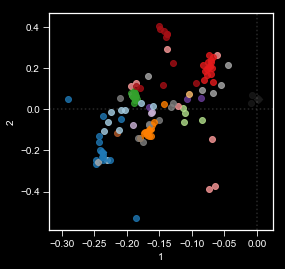

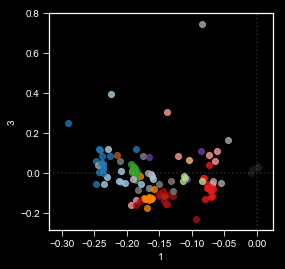

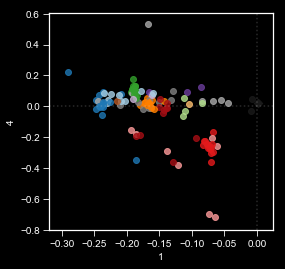

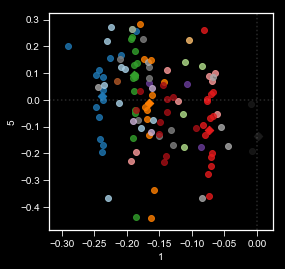

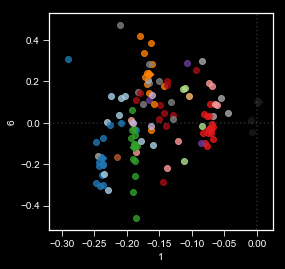

...

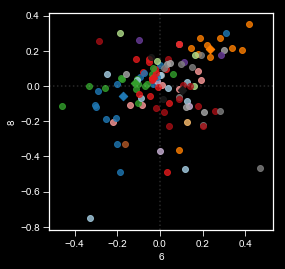

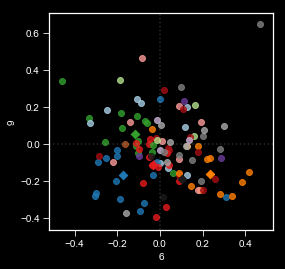

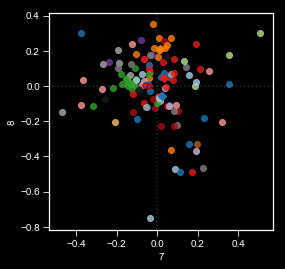

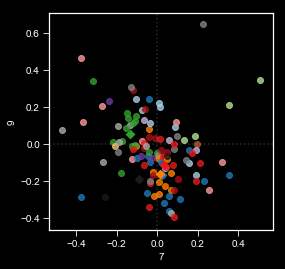

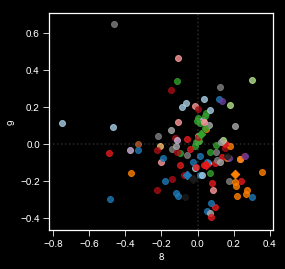

In [80]:
## space that isn't oriented at all

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']

all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers']['geom_medians'][model]



these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]

for x,y in combinations(range(model+1),2):
    plt.figure(figsize=(4,4))
    plt.xlabel(x+1)
    plt.ylabel(y+1)
    
    plt.axvline(0,color='lightgray',alpha=0.2,linestyle=':')
    plt.axhline(0,color='lightgray',alpha=0.2,linestyle=':')
    
    for b,bc in enumerate(these_bcs):
        mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
        
        plt.scatter(these_locs[b,x],these_locs[b,y],color=mutant_colorset[mutant_type],alpha=0.8)
    for mutant_type in medians_to_include:
        plt.scatter(geom_medians[mutant_type][x],geom_medians[mutant_type][y],color=mutant_colorset[mutant_type],marker='D')
    plt.savefig(f'talk_figures/space_plotted_m{model+1}_{x+1}_{y+1}.pdf',bbox_inches='tight')

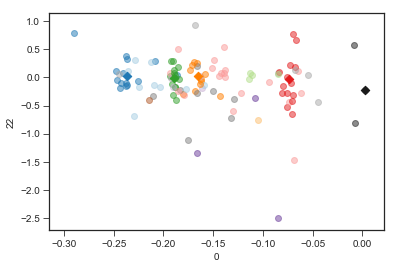

In [66]:
## space that isn't oriented at all

model = 24
x = 0
y = 22

medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']

all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers']['geom_medians'][model]



these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]

# for x,y in combinations(range(model),2):
plt.figure()
plt.xlabel(x)
plt.ylabel(y)
for b,bc in enumerate(these_bcs):
    mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]

    plt.scatter(these_locs[b,x],these_locs[b,y],color=mutant_colorset[mutant_type],alpha=0.5)
for mutant_type in medians_to_include:
    plt.scatter(geom_medians[mutant_type][x],geom_medians[mutant_type][y],color=mutant_colorset[mutant_type],marker='D')
#     plt.savefig(f'space_plotted_m{model}_{x}_{y}.pdf')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


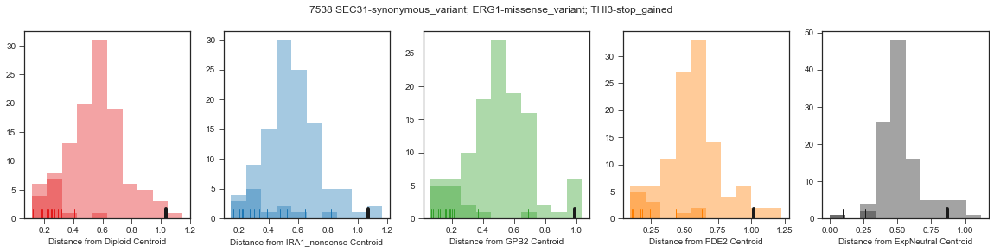

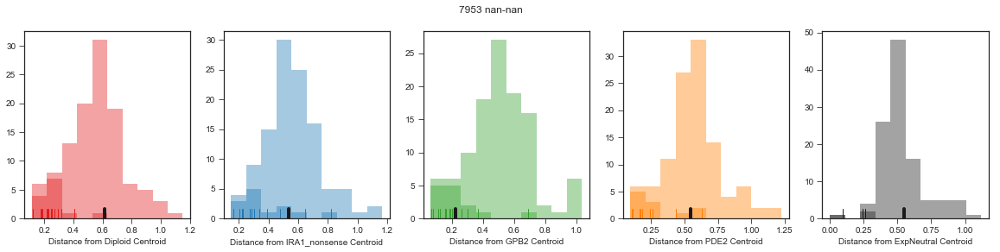

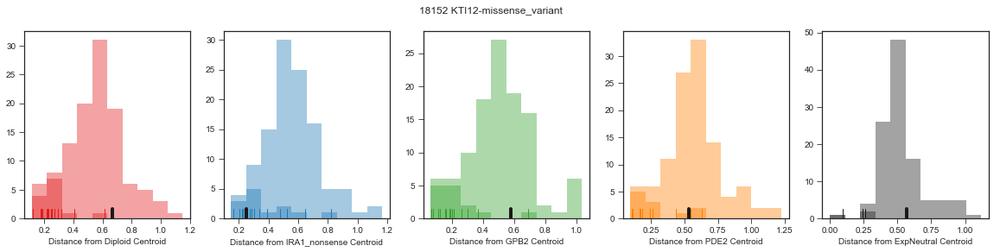

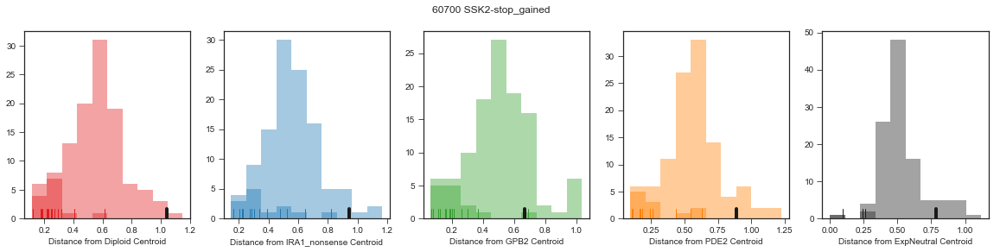

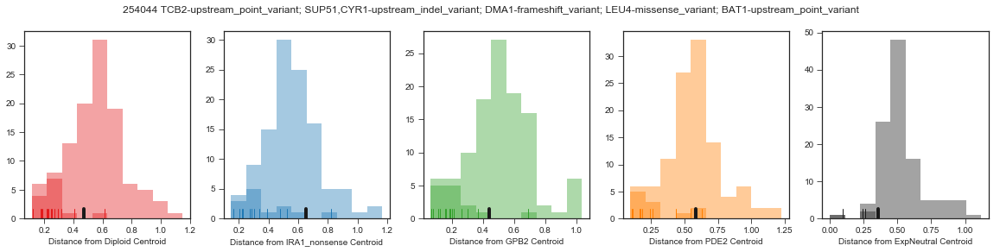

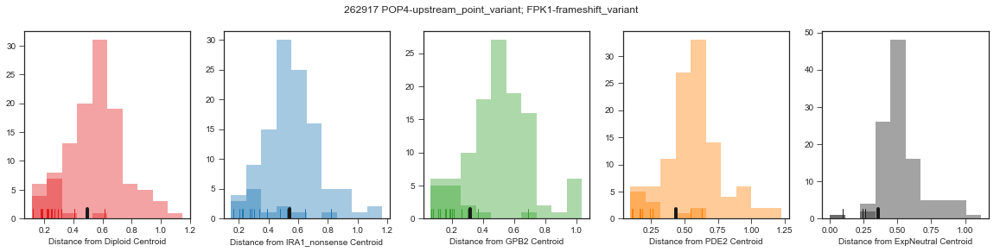

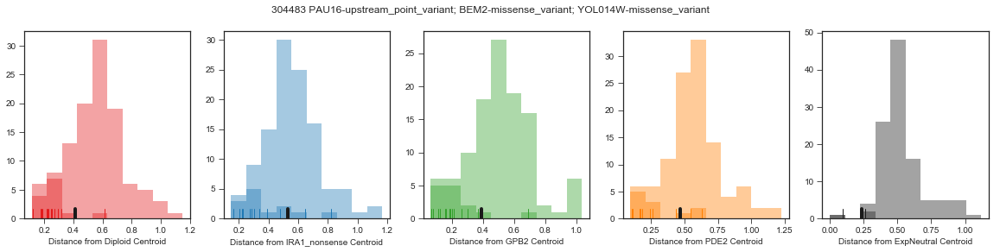

In [179]:
## The key is looking at the distribution of distances from each geometric median.

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']

dataset = datasets['subtle_to_strong_wothers']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = dataset['centroids'][model]
geom_medians = dataset['geom_medians'][model]

these_indices = []
these_bcs = []
for b,bc in enumerate(all_bcs):
    if this_data[this_data['barcode']==bc]['mutation_type'].values[0] in ['other_adaptive']:
        
        these_indices.append(b)
        these_bcs.append(bc)
        

these_locs = dataset['mut_locs'][model][these_indices,:]
all_locs = dataset['mut_locs'][model]
for b,bc in enumerate(these_bcs):
    
    plt.figure(figsize=(4*len(medians_to_include),4))
    
    gene = this_data[this_data['barcode']==bc]['additional_muts'].values[0]
    plt.suptitle(f'{bc} {gene}')

    for m,mutant_type in enumerate(medians_to_include):
        plt.subplot(1,len(medians_to_include),m+1)
        all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])
        vals,bins = np.histogram(all_distances)
        
        sns.distplot(all_distances,color=mutant_colorset[mutant_type],kde=False,bins=bins)

        sns.distplot(dataset['distance_from_centroid'][model][mutant_type],bins=bins,
                     color=mutant_colorset[mutant_type],rug=True,kde=False)

        this_distance = distance.pdist([these_locs[b,:],geom_medians[mutant_type]])
        sns.rugplot([this_distance],color='k',lw=4,height=0.05)

        plt.xlabel(f'Distance from {mutant_type} Centroid')
#         plt.savefig(f'adaptive_other_{bc}_distance_from_medians_{model+1}.pdf',bbox_inches='tight')


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


KeyboardInterrupt: 

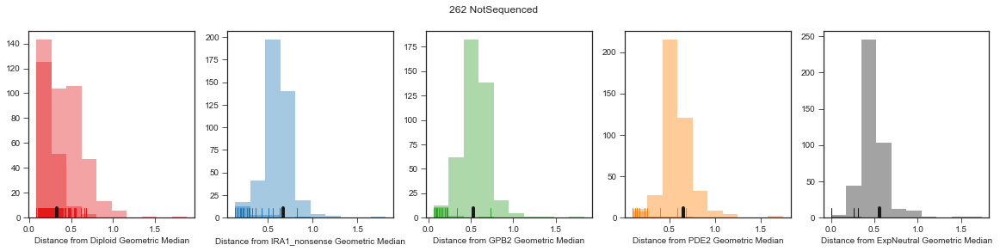

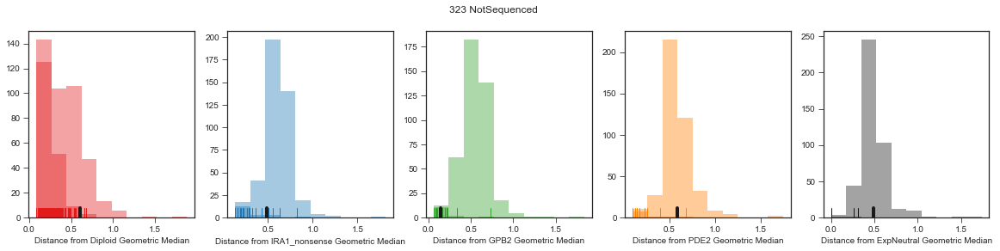

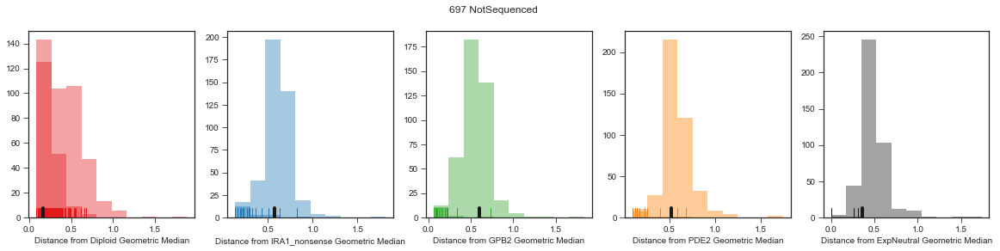

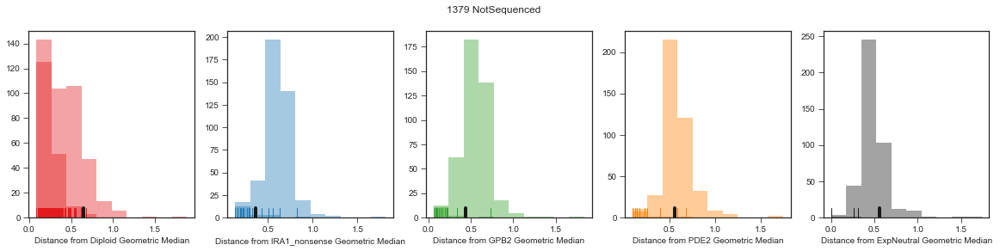

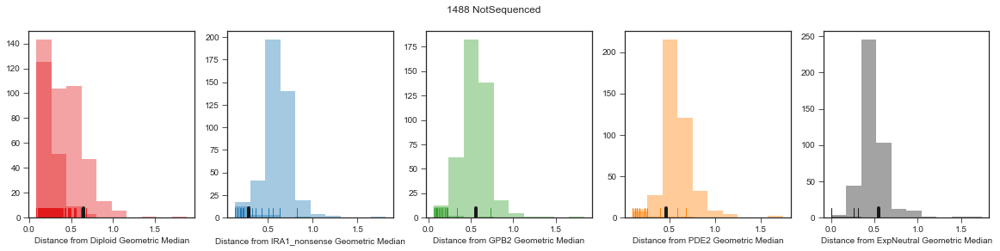

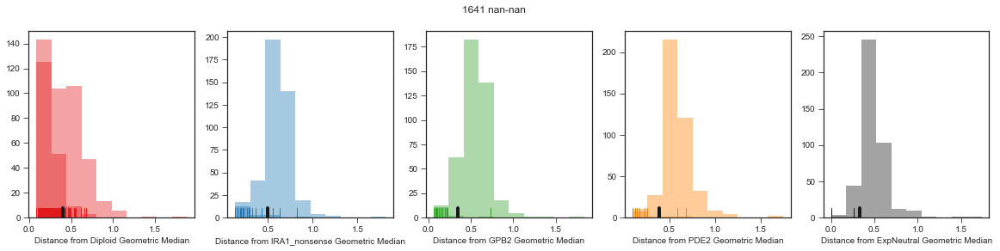

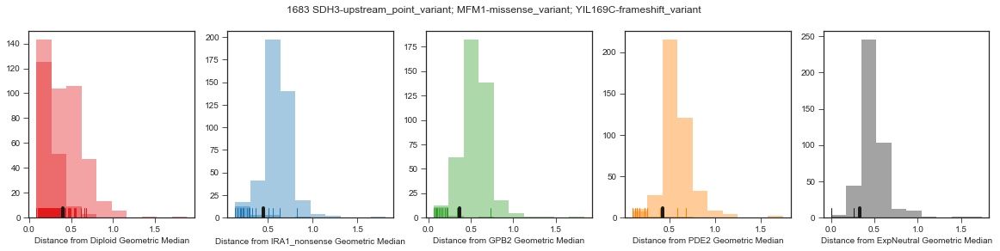

In [ ]:
## The key is looking at the distribution of distances from each geometric median.

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']

dataset = datasets['subtle_to_strong_wothers_ALLTEST']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = dataset['geom_medians'][model]

these_indices = []
these_bcs = []
for b,bc in enumerate(all_bcs):
    if this_data[this_data['barcode']==bc]['mutation_type'].values[0] in ['other','other_adaptive','NotSequenced','NotSequenced_adaptive']:
        
        these_indices.append(b)
        these_bcs.append(bc)
        

these_locs = dataset['mut_locs'][model][these_indices,:]
all_locs = dataset['mut_locs'][model]
for b,bc in enumerate(these_bcs):
    
    plt.figure(figsize=(4*len(medians_to_include),4))
    
    gene = this_data[this_data['barcode']==bc]['additional_muts'].values[0]
    plt.suptitle(f'{bc} {gene}')

    for m,mutant_type in enumerate(medians_to_include):
        plt.subplot(1,len(medians_to_include),m+1)
        all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])
        vals,bins = np.histogram(all_distances)
        
        sns.distplot(all_distances,color=mutant_colorset[mutant_type],kde=False,bins=bins)

        sns.distplot(dataset['distance_from_median'][model][mutant_type],bins=bins,
                     color=mutant_colorset[mutant_type],rug=True,kde=False)

        this_distance = distance.pdist([these_locs[b,:],geom_medians[mutant_type]])
        sns.rugplot([this_distance],color='k',lw=4,height=0.05)

        plt.xlabel(f'Distance from {mutant_type} Geometric Median')
        plt.savefig(f'ALLTEST_{bc}_distance_from_medians_{model+1}.pdf',bbox_inches='tight')



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


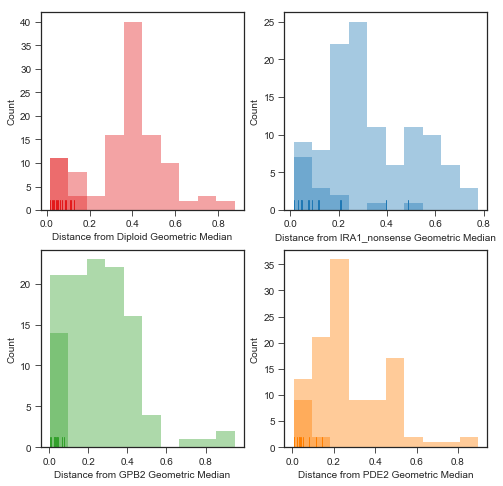

In [72]:
## The key is looking at the distribution of distances from each geometric median.
model = 3
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2']
# medians_to_include = ['Diploid','IRA1_nonsense','GPB2','Diploid_adaptive']
thresh = 0.05

dataset = datasets['subtle_to_strong_wothers']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = dataset['geom_medians'][model]


plt.figure(figsize=(2*4,2*4))
for m,mutant_type in enumerate(medians_to_include):
    

    plt.subplot(2,2,m+1)
    these_indices = []
    these_bcs = []
    for b,bc in enumerate(all_bcs):
        if this_data[this_data['barcode']==bc]['mutation_type'].values[0] in ([mutant_type]):

            these_indices.append(b)
            these_bcs.append(bc)
            
    these_locs = dataset['mut_locs'][model][these_indices,:]
    all_locs = dataset['mut_locs'][model]

#     all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])

    all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])
    vals,bins = np.histogram(all_distances)
    sns.distplot(all_distances,color=mutant_colorset[mutant_type],kde=False,bins=bins)

    sns.distplot(dataset['distance_from_median'][model][mutant_type],bins=bins,
             color=mutant_colorset[mutant_type],rug=True,kde=False)
    
    plt.xlabel(f'Distance from {mutant_type} Geometric Median')
    plt.ylabel('Count')

    plt.savefig(f'distance_from_geometric_medians_m{model+1}.pdf',bbox_inches='tight')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


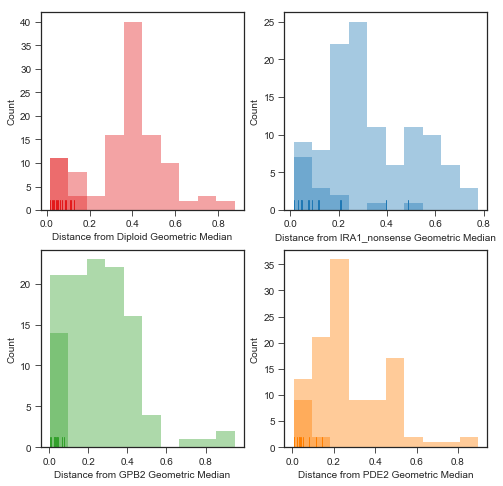

In [210]:
## The key is looking at the distribution of distances from each geometric median.
model = 3
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2']
# medians_to_include = ['Diploid','IRA1_nonsense','GPB2','Diploid_adaptive']
thresh = 0.15

dataset = datasets['subtle_to_strong_wothers']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = dataset['geom_medians'][model]


plt.figure(figsize=(2*4,2*4))
for m,mutant_type in enumerate(medians_to_include):

    plt.subplot(2,2,m+1)
    these_indices = []
    these_bcs = []
    for b,bc in enumerate(all_bcs):
        if this_data[this_data['barcode']==bc]['mutation_type'].values[0] in ([mutant_type]):

            these_indices.append(b)
            these_bcs.append(bc)
            
    these_locs = dataset['mut_locs'][model][these_indices,:]
    all_locs = dataset['mut_locs'][model]

#     all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])

    all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])
    vals,bins = np.histogram(all_distances)
    sns.distplot(all_distances,color=mutant_colorset[mutant_type],kde=False,bins=bins)

    sns.distplot(dataset['distance_from_median'][model][mutant_type],bins=bins,
             color=mutant_colorset[mutant_type],rug=True,kde=False)
    
    plt.xlabel(f'Distance from {mutant_type} Geometric Median')
    plt.ylabel('Count')

    plt.savefig(f'distance_from_geometric_medians_m{model+1}.pdf',bbox_inches='tight')

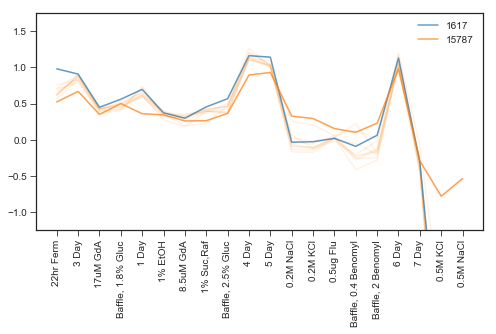

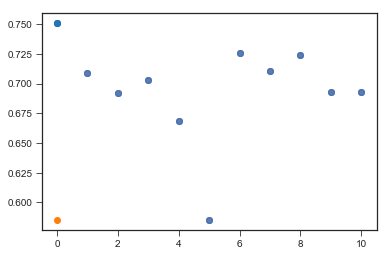

In [244]:
mutant_type = 'IRA1_nonsense'x
# mutant_type = 'PDE2'
# mutant_type = 'GPB2'
cutoff = 0.1
model = 3
conditions_used = 'strong'

odd_locs = np.where(dataset['distance_from_median'][model][mutant_type]>cutoff)[0]

these_bcs = this_data[(this_data['barcode'].isin(all_bcs)) & (this_data['mutation_type'].isin([mutant_type]))]['barcode'].values

odd_bcs = these_bcs[odd_locs]

if conditions_used == 'all':
    all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)
elif conditions_used == 'batch':
    all_cols = list(sorted_m3_cols)
elif conditions_used == 'subtle':
    all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle])
elif conditions_used == 'strong':
    all_cols = list(sorted_nonm3_cols[first_nonsubtle:])

plt.figure(figsize=(8,4))

these_data = this_data[this_data['mutation_type'].isin([mutant_type])]

all_cols_sorted = np.asarray(all_cols)[np.argsort(np.mean(these_data[all_cols],axis=0))]
all_cols_sorted = np.asarray(all_cols)

for b,bc in enumerate(this_data[this_data['mutation_type'].isin([mutant_type])]['barcode'].values):
    these_data = this_data[this_data['mutation_type'].isin([mutant_type])]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[mutant_type],alpha=0.1)

similar_data  = this_data[this_data['barcode'].isin(odd_bcs)]
similar_data = similar_data[all_cols_sorted].values.swapaxes(0,1)
for b,bc in enumerate(odd_bcs):
    plt.plot(similar_data[:,b],label=bc,alpha=0.7)

plt.legend()
plt.xticks(range(len(all_cols)),[tools.renamed_conditions[col.split('_fitness')[0]] for col in all_cols_sorted],rotation=90)


plt.ylim(-1.25,1.75)
# plt.savefig(f'gene_outliers_subtle_{mutant_type}_{m+1}_{cutoff}.pdf',bbox_inches='tight')
# plt.savefig(f'gene_outliers_all_{mutant_type}_{m+1}_{cutoff}.pdf',bbox_inches='tight')
plt.savefig(f'gene_outliers_{conditions_used}_{mutant_type}_{m+1}_{cutoff}.pdf',bbox_inches='tight')


plt.figure()

m3_data = these_data[sorted_m3_cols].values.swapaxes(0,1)

similar_data  = this_data[this_data['barcode'].isin(odd_bcs)]
similar_data = similar_data[sorted_m3_cols].values.swapaxes(0,1)

for b in range(len(np.mean(m3_data,axis=0))):
    plt.plot(np.mean(m3_data,axis=0),'o',color='b',alpha=0.2)
    
for b in range(similar_data.shape[1]):
    plt.plot(np.mean(similar_data,axis=0)[b],'o')



In [245]:
this_data[this_data['barcode'].isin(odd_bcs)]

,barcode,gene,type,ploidy,class,additional_muts,1.4%-R1_error,1.4%-R1_fitness,1.4%-R2_error,1.4%-R2_fitness,...,1BB_1%Raf_error,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type
15,1617,PDE2,frameshift_variant,Haploid,PKA,RIF1-upstream_indel_variant,0.042769,0.689349,0.049141,0.733807,...,0.042906,0.812613,0.017978,0.750983,0.023708,0.372185,0.019429,0.454074,0.051876,PDE2
109,15787,PDE2,missense_variant,Haploid,PKA,"tW,HIP1-upstream_indel_variant; YOL159C-missen...",0.051640,0.684120,0.064201,0.789816,...,0.043092,0.615605,0.018523,0.585922,0.024088,0.344561,0.019815,0.263739,0.053658,PDE2


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


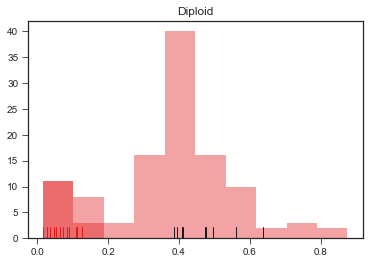

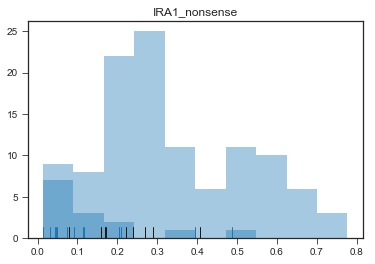

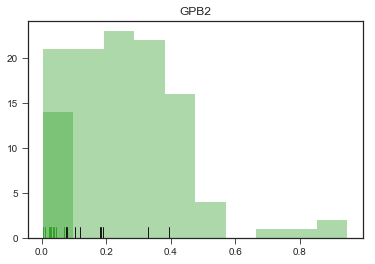

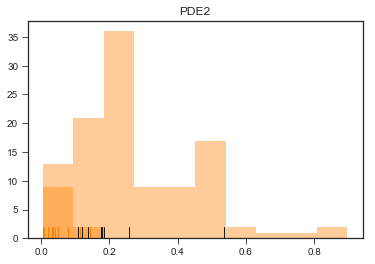

In [27]:
## The key is looking at the distribution of distances from each geometric median.
model = 3
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2']

thresh = 0.05

dataset = datasets['subtle_to_strong_wothers']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = dataset['geom_medians'][model]

# similar_mutants = {}

comparison_mutant_type = 'IRA1_missense'

for m,mutant_type in enumerate(medians_to_include):
    
#     similar_mutants[mutant_type] = []
    
    these_indices = []
    these_bcs = []
    for b,bc in enumerate(all_bcs):
        if this_data[this_data['barcode']==bc]['mutation_type'].values[0]in ([comparison_mutant_type]):

            these_indices.append(b)
            these_bcs.append(bc)
            
    these_locs = dataset['mut_locs'][model][these_indices,:]
    all_locs = dataset['mut_locs'][model]
    
    plt.figure()
    plt.title(f'{mutant_type}')
    all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])
    
    vals,bins = np.histogram(all_distances)
    sns.distplot(all_distances,color=mutant_colorset[mutant_type],kde=False,bins=bins)
    
    sns.distplot(dataset['distance_from_median'][model][mutant_type],bins=bins,
                  color=mutant_colorset[mutant_type],rug=True,kde=False)


    
    for b,bc in enumerate(these_bcs):
        gene = this_data[this_data['barcode']==bc]['additional_muts'].values[0]
        
        
        
        this_distance = distance.pdist([these_locs[b,:],geom_medians[mutant_type]])
        

        this_distance = distance.pdist([these_locs[b,:],geom_medians[mutant_type]])
#         sns.rugplot([this_distance],color='k',lw=4,height=0.05)
        sns.rugplot([this_distance],color='k')

#             plt.xlabel(f'Distance from {mutant_type} Geometric Median')
    

In [247]:
model = 3

geom_medians = dataset['geom_medians'][model]

medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2']

for gene1,gene2 in 
distance.pdist()

{'Diploid': array([-0.07376009,  0.20696808, -0.07388163, -0.2601794 ]),
 'ExpNeutral': array([0.00230812, 0.04844019, 0.02782718, 0.02031095]),
 'GPB2': array([-0.19021776,  0.06661947,  0.01011422,  0.10814063]),
 'IRA1_nonsense': array([-0.23794404, -0.21650432,  0.04722379,  0.01431366]),
 'PDE2': array([-0.16941026, -0.11076889, -0.12733732,  0.02133578])}

IRA1_nonsense 7961 GRR1-synonymous_variant [0.0779026]
IRA1_nonsense 11430 SPO74-frameshift_variant; HPA2-missense_variant; SCW10-synonymous_variant [0.11309015]
IRA1_nonsense 17927 YLR177W-missense_variant; TUL1-synonymous_variant; RNH202-stop_gained; PGM1-upstream_point_variant [0.09800747]
IRA1_nonsense 18152 KTI12-missense_variant [0.04286879]


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


GPB2 7953 nan-nan [0.02410253]
PDE2 18200 HXT8-synonymous_variant; SSD1-missense_variant [0.07049605]
PDE2 21956 MLH1-missense_variant [0.05212854]
PDE2 25747 PPE1-missense_variant; YOX1-synonymous_variant [0.06453154]


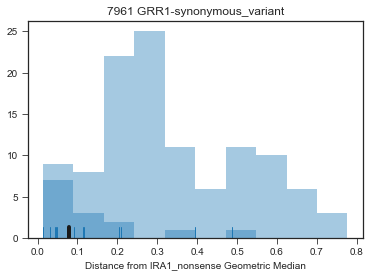

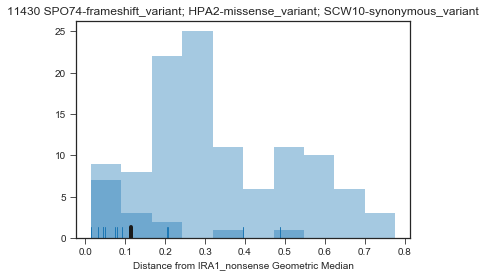

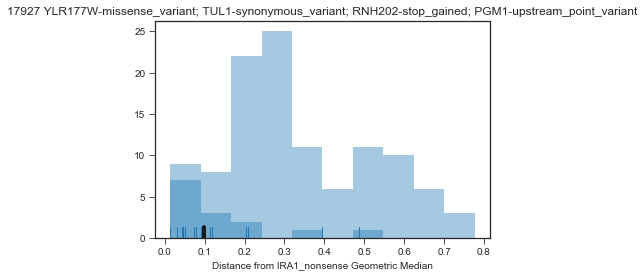

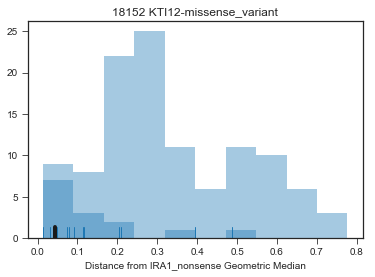

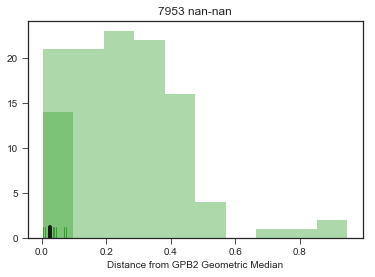

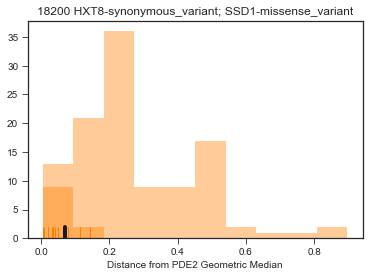

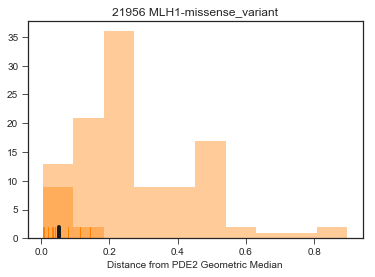

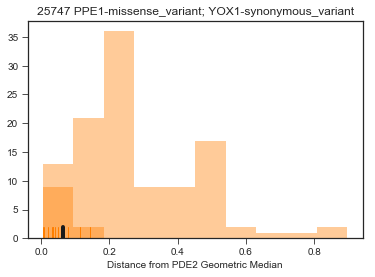

In [49]:
## The key is looking at the distribution of distances from each geometric median.
model = 3
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2']

thresh = 0.1

dataset = datasets['subtle_to_strong_wothers']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = dataset['geom_medians'][model]

similar_mutants = {}

for m,mutant_type in enumerate(medians_to_include):
    
    similar_mutants[mutant_type] = []
    
    these_indices = []
    these_bcs = []
    for b,bc in enumerate(all_bcs):
        if this_data[this_data['barcode']==bc]['mutation_type'].values[0] not in ([mutant_type] + ['NotSequenced','NotSequenced_adaptive']):

            these_indices.append(b)
            these_bcs.append(bc)
            
    these_locs = dataset['mut_locs'][model][these_indices,:]
    all_locs = dataset['mut_locs'][model]
    
    for b,bc in enumerate(these_bcs):
        gene = this_data[this_data['barcode']==bc]['additional_muts'].values[0]
        
        all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])
        
        this_distance = distance.pdist([these_locs[b,:],geom_medians[mutant_type]])
        
        if len(np.where(all_distances < this_distance)[0]) < thresh*len(all_distances):
            print(mutant_type,bc,gene,this_distance)
            similar_mutants[mutant_type].append(bc)
            plt.figure()
            plt.title(f'{bc} {gene}')
            all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])
            vals,bins = np.histogram(all_distances)
            sns.distplot(all_distances,color=mutant_colorset[mutant_type],kde=False,bins=bins)

            sns.distplot(dataset['distance_from_median'][model][mutant_type],bins=bins,
                     color=mutant_colorset[mutant_type],rug=True,kde=False)

            this_distance = distance.pdist([these_locs[b,:],geom_medians[mutant_type]])
            sns.rugplot([this_distance],color='k',lw=4,height=0.05)
            
            plt.xlabel(f'Distance from {mutant_type} Geometric Median')
    

In [205]:
similar_mutants.items()

dict_items([('Diploid', []), ('IRA1_nonsense', []), ('GPB2', []), ('PDE2', [25747])])

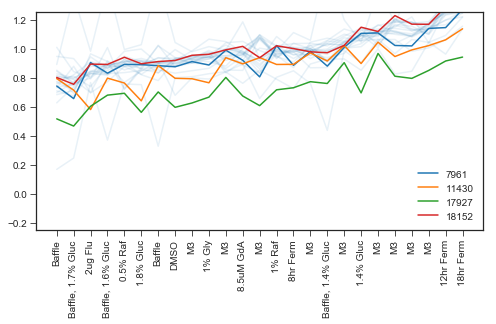

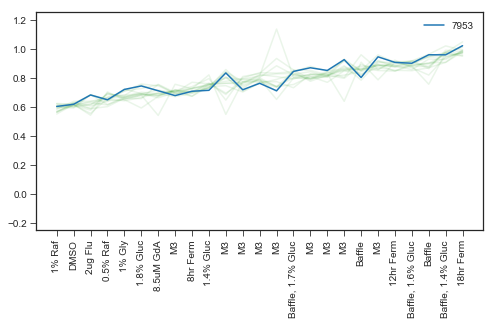

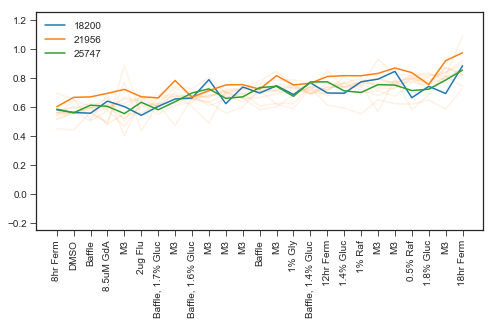

In [50]:


all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)
all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle])

for this_type,similar_bcs in similar_mutants.items():
    if len(similar_bcs) > 0:
        plt.figure(figsize=(8,4))
        
        these_data = this_data[this_data['mutation_type'].isin([this_type])]

        all_cols_sorted = np.asarray(all_cols)[np.argsort(np.mean(these_data[all_cols],axis=0))]


        for b,bc in enumerate(this_data[this_data['mutation_type'].isin([this_type])]['barcode'].values):
            these_data = this_data[this_data['mutation_type'].isin([this_type])]
            this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)

            plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[this_type],alpha=0.1)

        similar_data  = this_data[this_data['barcode'].isin(similar_bcs)]
        similar_data = similar_data[all_cols_sorted].values.swapaxes(0,1)
        for b,bc in enumerate(similar_bcs):
            plt.plot(similar_data[:,b],label=bc)

        plt.legend()
        plt.xticks(range(len(all_cols)),[tools.renamed_conditions[col.split('_fitness')[0]] for col in all_cols_sorted],rotation=90)


        plt.ylim(-0.25,1.25)











/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


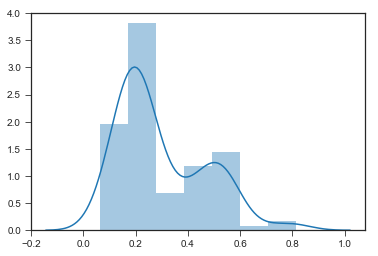

In [268]:
focal_bcs = this_data[this_data['mutation_type']=='RAS2']['barcode'].values

dataset = datasets['subtle_to_strong_wothers']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = dataset['geom_medians'][model]

similar_mutants = {}

for b,focal_bc in enumerate(focal_bcs):
    
    focal_index = np.where(np.isin(all_bcs,focal_bc))[0]
            
    these_locs = dataset['mut_locs'][model][these_indices,:]
    all_locs = dataset['mut_locs'][model]
    
    dists = distance.cdist(all_locs[focal_index,:],np.delete(all_locs, focal_index,axis=0))
    

    sns.distplot(dists)


In [273]:
this_data[this_data['mutation_type']=='RAS2']['barcode'].values

array([11430])

In [272]:
this_data[this_data['barcode']==all_bcs[42]]

,barcode,gene,type,ploidy,class,additional_muts,1.4%-R1_error,1.4%-R1_fitness,1.4%-R2_error,1.4%-R2_fitness,...,1BB_1%Raf_error,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type
106,15221,IRA1,missense_variant,Haploid,PKA,PCD1-synonymous_variant; YDL026W-upstream_poin...,0.046435,0.988754,0.058297,1.21455,...,0.043748,0.537965,0.020332,0.790298,0.02606,0.423111,0.031482,0.156543,0.063823,IRA1_missense


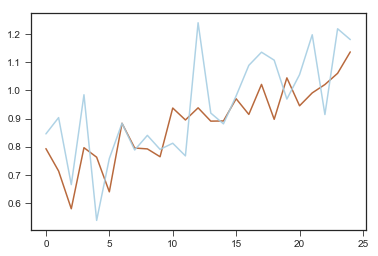

In [277]:
for b,bc in enumerate([11430,15221]):
    this_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
#     these_data = this_data[this_data['mutation_type'].isin([this_type])]
#     this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)

    bc_data = this_data[this_data['barcode']==bc][all_cols_sorted].values[0]

    plt.plot(bc_data,color=tools.mutant_colorset[this_type],alpha=0.9)


In [275]:
bc_data

array([[0.84535567, 0.90320394, 0.66515405, 0.98438466, 0.53796469,
        0.75791158, 0.88304988, 0.78810198, 0.84012256, 0.79029818,
        0.81214237, 0.76724793, 1.24022302, 0.91929538, 0.88102498,
        0.98025822, 1.08886485, 1.13559796, 1.1072562 , 0.96903496,
        1.05588415, 1.19753028, 0.9140723 , 1.21888162, 1.18034729]])

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/numpy/lib/arraysetops.py:472: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


0.05076194775079304


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


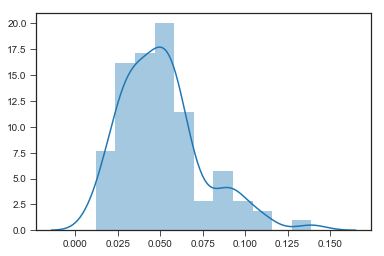

In [266]:
for b,focal_bc in enumerate(focal_bcs):
    
    focal_index = np.where(np.isin(all_bcs,this_data[this_data['mutation_type']=='GPB2'].values))
            
    these_locs = dataset['mut_locs'][model][these_indices,:]
    all_locs = dataset['mut_locs'][model]
    
    dists = distance.pdist(all_locs[focal_index,:][0])
    print(np.mean(dists))

    sns.distplot(dists)

(-0.25, 1.25)

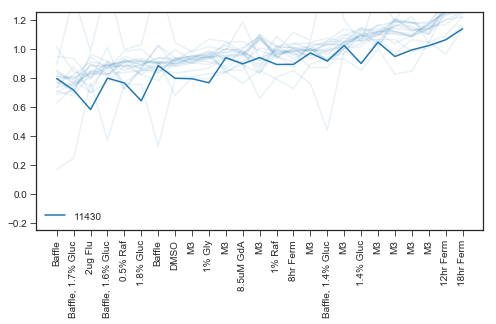

In [251]:


all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)
all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle])

this_type = 'IRA1_nonsense'
similar_bcs = this_data[this_data['mutation_type']=='RAS2']['barcode'].values

plt.figure(figsize=(8,4))
        
these_data = this_data[this_data['mutation_type'].isin([this_type])]

all_cols_sorted = np.asarray(all_cols)[np.argsort(np.mean(these_data[all_cols],axis=0))]


for b,bc in enumerate(this_data[this_data['mutation_type'].isin([this_type])]['barcode'].values):
    these_data = this_data[this_data['mutation_type'].isin([this_type])]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[this_type],alpha=0.1)

similar_data  = this_data[this_data['barcode'].isin(similar_bcs)]
similar_data = similar_data[all_cols_sorted].values.swapaxes(0,1)
for b,bc in enumerate(similar_bcs):
    plt.plot(similar_data[:,b],label=bc)

plt.legend()
plt.xticks(range(len(all_cols)),[tools.renamed_conditions[col.split('_fitness')[0]] for col in all_cols_sorted],rotation=90)


plt.ylim(-0.25,1.25)








In [70]:
condition_colorset = sns.color_palette('Paired',len(sorted_m3_cols)+len(sorted_nonm3_cols))

In [ ]:
## space that isn't oriented at all

model = 2
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']

all_bcs = list(datasets['subtle_to_strong_wothers_ALLTEST']['training_bcs']) +  list(datasets['subtle_to_strong_wothers_ALLTEST']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers_ALLTEST']['geom_medians'][model]



these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets['subtle_to_strong_wothers_ALLTEST']['mut_locs'][model][these_indices,:]
cond_locs =datasets['subtle_to_strong_wothers_ALLTEST']['cond_locs'][model]

all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)

for x,y in combinations(range(model),2):
    plt.figure(figsize=(8,4))
    plt.subplot(121)
    plt.xlabel(x)
    plt.ylabel(y)
    for b,bc in enumerate(these_bcs):
        mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
        
        plt.scatter(these_locs[b,x],these_locs[b,y],color=mutant_colorset[mutant_type],alpha=0.5)
    for mutant_type in medians_to_include:
        plt.scatter(geom_medians[mutant_type][x],geom_medians[mutant_type][y],color=mutant_colorset[mutant_type],marker='D')
    
    plt.subplot(122)
    plt.xlabel(x)
    plt.ylabel(y)
    for c,cond in enumerate(all_cols):
        
#         named = condition_colorset

        plt.scatter(cond_locs[c,x],cond_locs[c,y],color=condition_colorset[c],label=cond,alpha=0.5)
    plt.legend()
    
#     plt.savefig(f'ALLTEST_space_plotted_m{model}_{x}_{y}.pdf')

In [ ]:


model = 8
medians_to_include = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2','ExpNeutral']
mutants_to_orient_by= ['GPB2','PDE2']
# mutants_to_orient_by = ['Diploid','IRA1_nonsense']
mutants_to_orient_by = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2']
all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers']['geom_medians'][model]


mutants_to_orient_by = ['Diploid',['IRA1_nonsense','IRA1_missense'],'IRA1_nonsense','IRA1_missense',['TOR1','SCH9','KOG1'],'GPB2','PDE2','GPB1','IRA2','other_adaptive']
mutants_to_orient_by.append(['IRA1_nonsense','IRA1_missense','GPB2','PDE2','GPB1','IRA2'])
n_perms = 1e6
for genes in mutants_to_orient_by:
    if not type(genes) == list:
        genes = [genes]
#     print(genes)
    plt.figure()
    these_bcs = this_data[this_data['mutation_type'].isin(genes)]['barcode'].values
    these_indices = np.where(np.isin(all_bcs,these_bcs))[0]
    these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]
    actual_dist = distance.pdist(these_locs)
    actual_mean = np.mean(actual_dist)
    
    perm_dists = []
    for perm in range(int(n_perms)):

        perm_bcs = np.random.choice(all_bcs,size=len(these_indices),replace=False)
        perm_indices = np.where(np.isin(all_bcs,perm_bcs))[0]
        perm_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][perm_indices,:]
        perm_dist = distance.pdist(perm_locs)
        perm_dists.append(np.mean(perm_dist))

    plt.subplot(121)    
    all_indices = range(len(all_bcs))
    all_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][all_indices,:]

    vals,bins = np.histogram(distance.pdist(all_locs))

    sns.distplot(distance.pdist(all_locs),color='lightgray',kde=False,bins=bins)

    sns.distplot(actual_dist,color=mutant_colorset[genes[0]],kde=False,bins=bins)
    sns.rugplot([actual_mean],color=mutant_colorset[genes[0]])
    plt.yscale('log')


#     sns.distplot(perm_dists,color='lightgray')
#     sns.distplot(actual_dist,color='lightgray')
    
    plt.subplot(122)  
    p_val = (len(np.where(perm_dists < actual_mean)[0])+1)/(n_perms+1)
    sns.distplot(perm_dists,color='lightgray')
    sns.rugplot([actual_mean],color=mutant_colorset[genes[0]],height=0.1,lw=2)
#     plt.annotate(xy=(0,1),s=f'{p_val:.2g}',transform=plt.gca().transAxes)
    plt.title(f'{" ".join(genes)} p={p_val:.2g}')
    


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


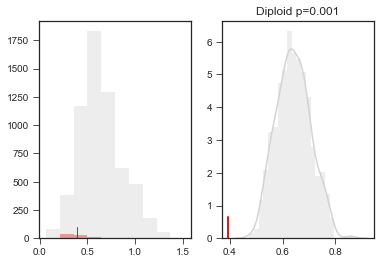

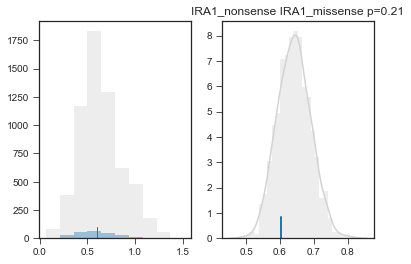

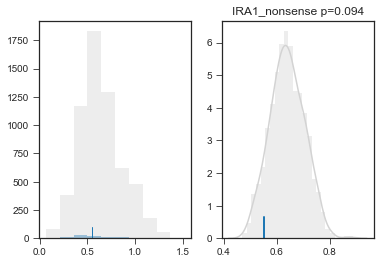

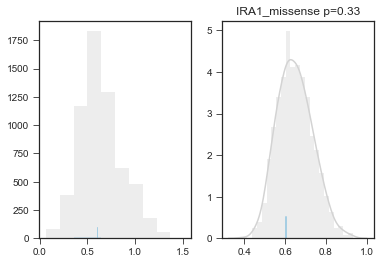

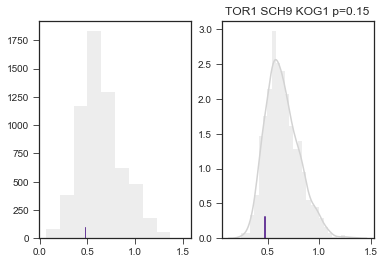

...

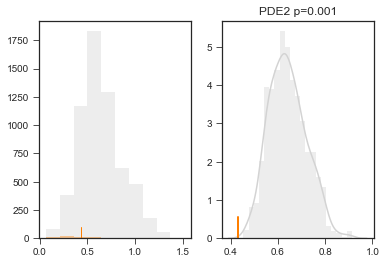

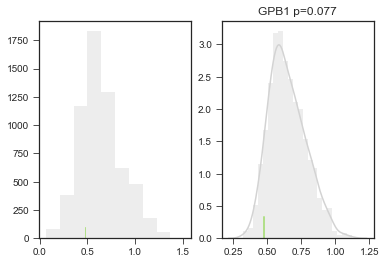

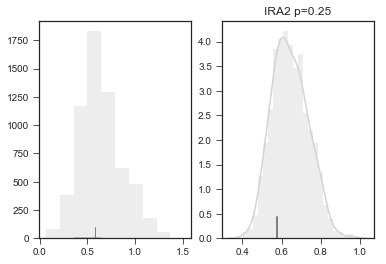

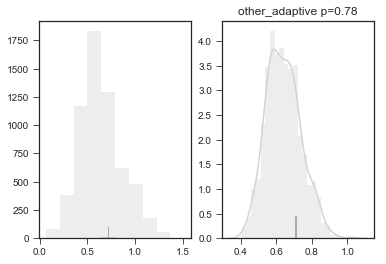

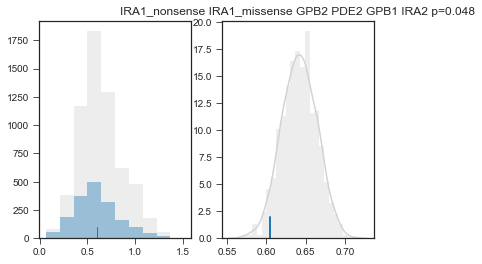

In [107]:


model = 8
medians_to_include = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2','ExpNeutral']
mutants_to_orient_by= ['GPB2','PDE2']
# mutants_to_orient_by = ['Diploid','IRA1_nonsense']
mutants_to_orient_by = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2']
all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers']['geom_medians'][model]


mutants_to_orient_by = ['Diploid',['IRA1_nonsense','IRA1_missense'],'IRA1_nonsense','IRA1_missense',['TOR1','SCH9','KOG1'],'GPB2','PDE2','GPB1','IRA2','other_adaptive']
mutants_to_orient_by.append(['IRA1_nonsense','IRA1_missense','GPB2','PDE2','GPB1','IRA2'])
n_perms = 1000
for genes in mutants_to_orient_by:
    if not type(genes) == list:
        genes = [genes]
#     print(genes)
    plt.figure()
    these_bcs = this_data[this_data['mutation_type'].isin(genes)]['barcode'].values
    these_indices = np.where(np.isin(all_bcs,these_bcs))[0]
    these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]
    actual_dist = distance.pdist(these_locs)
    actual_mean = np.mean(actual_dist)
    
    perm_dists = []
    for perm in range(int(n_perms)):

        perm_bcs = np.random.choice(all_bcs,size=len(these_indices),replace=False)
        perm_indices = np.where(np.isin(all_bcs,perm_bcs))[0]
        perm_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][perm_indices,:]
        perm_dist = distance.pdist(perm_locs)
        perm_dists.append(np.mean(perm_dist))

    plt.subplot(121)    
    all_indices = range(len(all_bcs))
    all_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][all_indices,:]

    vals,bins = np.histogram(distance.pdist(all_locs))

    sns.distplot(distance.pdist(all_locs),color='lightgray',kde=False,bins=bins)

    sns.distplot(actual_dist,color=mutant_colorset[genes[0]],kde=False,bins=bins)
    sns.rugplot([actual_mean],color=mutant_colorset[genes[0]])
#     plt.yscale('log')


#     sns.distplot(perm_dists,color='lightgray')
#     sns.distplot(actual_dist,color='lightgray')
    
    plt.subplot(122)  
    p_val = (len(np.where(perm_dists < actual_mean)[0])+1)/(n_perms+1)
    sns.distplot(perm_dists,color='lightgray')
    sns.rugplot([actual_mean],color=mutant_colorset[genes[0]],height=0.1,lw=2)
#     plt.annotate(xy=(0,1),s=f'{p_val:.2g}',transform=plt.gca().transAxes)
    plt.title(f'{" ".join(genes)} p={p_val:.2g}')
    



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


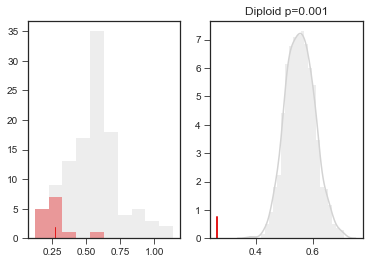

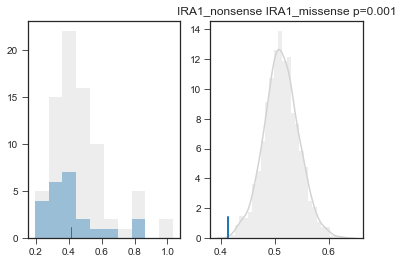

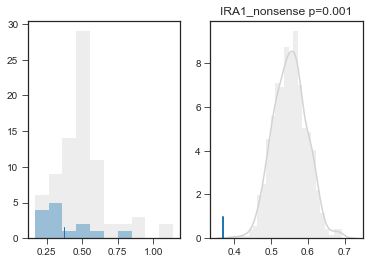

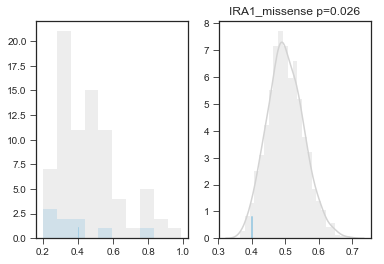

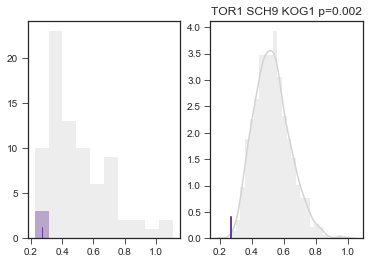

...

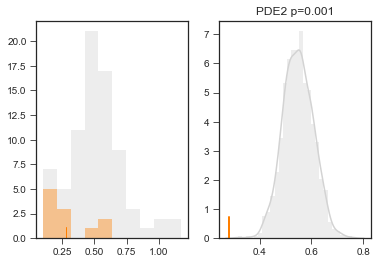

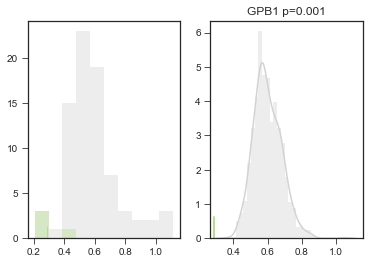

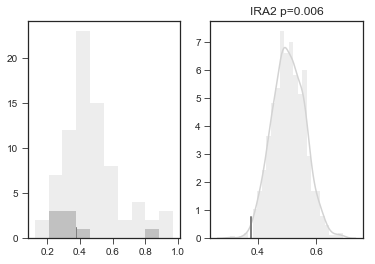

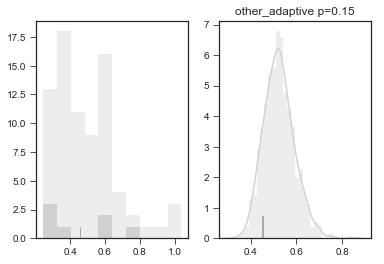

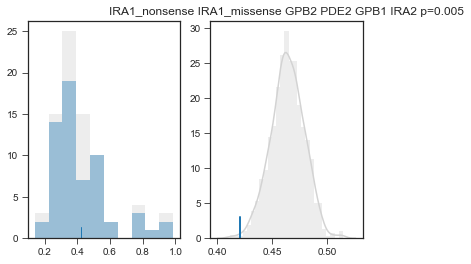

In [50]:
# from sklearn.cluster import KMeans

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2','ExpNeutral']
mutants_to_orient_by= ['GPB2','PDE2']
# mutants_to_orient_by = ['Diploid','IRA1_nonsense']
mutants_to_orient_by = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2']
all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers']['geom_medians'][model]


mutants_to_orient_by = ['Diploid',['IRA1_nonsense','IRA1_missense'],'IRA1_nonsense','IRA1_missense',['TOR1','SCH9','KOG1'],'GPB2','PDE2','GPB1','IRA2','other_adaptive']
mutants_to_orient_by.append(['IRA1_nonsense','IRA1_missense','GPB2','PDE2','GPB1','IRA2'])
n_perms = 1000
for genes in mutants_to_orient_by:
    
    if 'Diploid' not in genes:
        these_bcs = [bc for bc in this_data[~this_data['mutation_type'].isin(['Diploid','Diploid + Chr11Amp',
                 'Diploid + Chr12Amp',
                 'Diploid + IRA1',
                 'Diploid + IRA2',
                 'Diploid_adaptive'])]['barcode'].values]
        all_indices = np.where(np.isin(all_bcs,these_bcs))[0]
    else:
        all_indices = range(len(all_bcs))
    
    
    if not type(genes) == list:
        genes = [genes]
#     print(genes)
    plt.figure()
    these_bcs = this_data[this_data['mutation_type'].isin(genes)]['barcode'].values
    these_indices = np.where(np.isin(all_bcs,these_bcs))[0]
    these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]
    
    centroid = tools.centroid(these_locs)
    
    actual_dist = distance.cdist(these_locs,[centroid])
    actual_mean = np.mean(actual_dist)
    
    perm_dists = []
    for perm in range(int(n_perms)):

        perm_bcs = np.random.choice(all_bcs,size=len(these_indices),replace=False)
        perm_indices = np.where(np.isin(all_bcs,perm_bcs))[0]
        perm_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][perm_indices,:]
        perm_dist = distance.cdist(perm_locs,[centroid])
        perm_dists.append(np.mean(perm_dist))

    plt.subplot(121)    
#     all_indices = range(len(all_bcs))

        
    all_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][all_indices,:]

    vals,bins = np.histogram(distance.cdist(all_locs,[centroid]))

    sns.distplot(distance.cdist(all_locs,[centroid]),color='lightgray',kde=False,bins=bins)

    sns.distplot(actual_dist,color=mutant_colorset[genes[0]],kde=False,bins=bins)
    sns.rugplot([actual_mean],color=mutant_colorset[genes[0]])
#     plt.yscale('log')


#     sns.distplot(perm_dists,color='lightgray')
#     sns.distplot(actual_dist,color='lightgray')
    
    plt.subplot(122)  
    p_val = (len(np.where(perm_dists < actual_mean)[0])+1)/(n_perms+1)
    sns.distplot(perm_dists,color='lightgray')
    sns.rugplot([actual_mean],color=mutant_colorset[genes[0]],height=0.1,lw=2)
#     plt.annotate(xy=(0,1),s=f'{p_val:.2g}',transform=plt.gca().transAxes)
    plt.title(f'{" ".join(genes)} p={p_val:.2g}')
    




/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


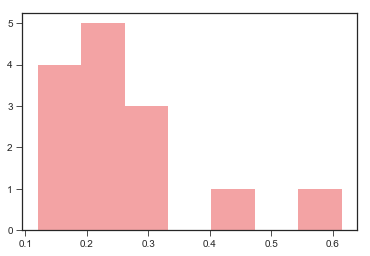

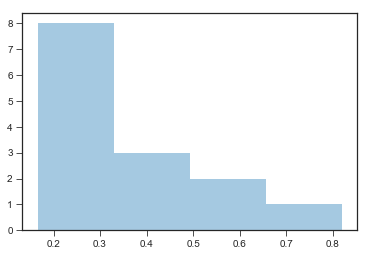

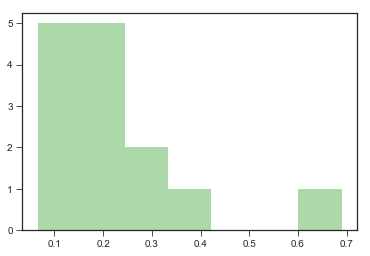

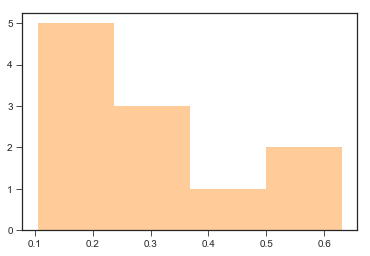

In [113]:
# from sklearn.cluster import KMeans

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2','ExpNeutral']
mutants_to_orient_by= ['GPB2','PDE2']
# mutants_to_orient_by = ['Diploid','IRA1_nonsense']
mutants_to_orient_by = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2']
all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers']['geom_medians'][model]


mutants_to_orient_by = ['Diploid',['IRA1_nonsense','IRA1_missense'],'IRA1_nonsense','IRA1_missense',['TOR1','SCH9','KOG1'],'GPB2','PDE2','GPB1','IRA2','other_adaptive']
mutants_to_orient_by.append(['IRA1_nonsense','IRA1_missense','GPB2','PDE2','GPB1','IRA2'])


mutants_to_orient_by = ['Diploid','IRA1_nonsense','GPB2','PDE2']
n_perms = 1000
for genes in mutants_to_orient_by:
    if not type(genes) == list:
        genes = [genes]
#     print(genes)
    plt.figure()
    these_bcs = this_data[this_data['mutation_type'].isin(genes)]['barcode'].values
    these_indices = np.where(np.isin(all_bcs,these_bcs))[0]
    these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]
    actual_dist = distance.cdist(these_locs,[datasets['subtle_to_strong_wothers']['centroids'][model][genes[0]]])
#     actual_mean = np.mean(actual_dist)


#     plt.subplot(121)    
    all_indices = range(len(all_bcs))
    all_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][all_indices,:]

#     vals,bins = np.histogram(distance.pdist(all_locs))

#     sns.distplot(distance.pdist(all_locs),color='lightgray',kde=False,bins=bins)
    sns.distplot(actual_dist,color=mutant_colorset[genes[0]],kde=False)

#     sns.distplot(actual_dist,color=mutant_colorset[genes[0]],kde=False,bins=bins)
#     sns.rugplot([actual_mean],color=mutant_colorset[genes[0]])
# #     plt.yscale('log')


# #     sns.distplot(perm_dists,color='lightgray')
# #     sns.distplot(actual_dist,color='lightgray')
    
#     plt.subplot(122)  
#     p_val = (len(np.where(perm_dists < actual_mean)[0])+1)/(n_perms+1)
#     sns.distplot(perm_dists,color='lightgray')
#     sns.rugplot([actual_mean],color=mutant_colorset[genes[0]],height=0.1,lw=2)
# #     plt.annotate(xy=(0,1),s=f'{p_val:.2g}',transform=plt.gca().transAxes)
#     plt.title(f'{" ".join(genes)} p={p_val:.2g}')
    




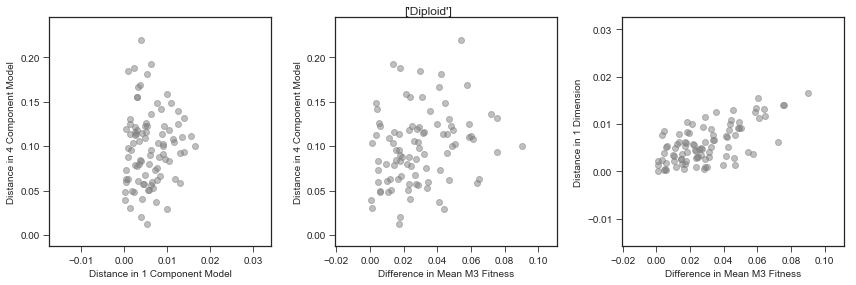

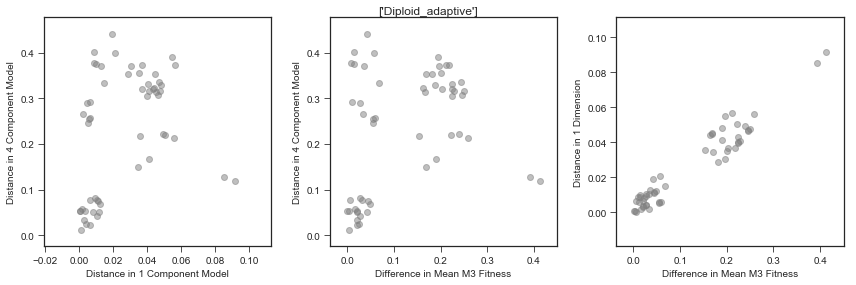

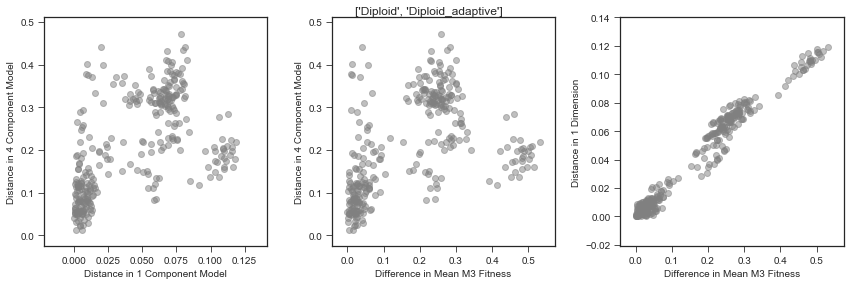

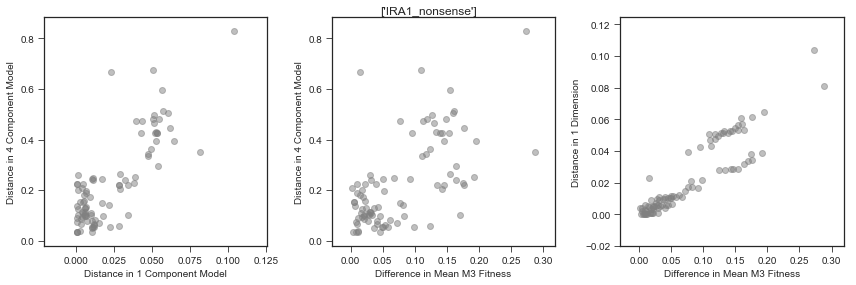

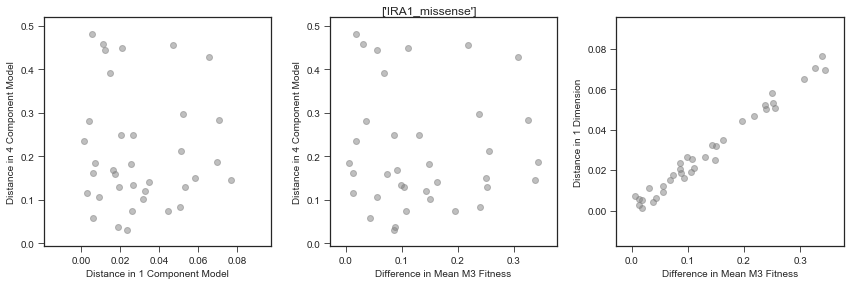

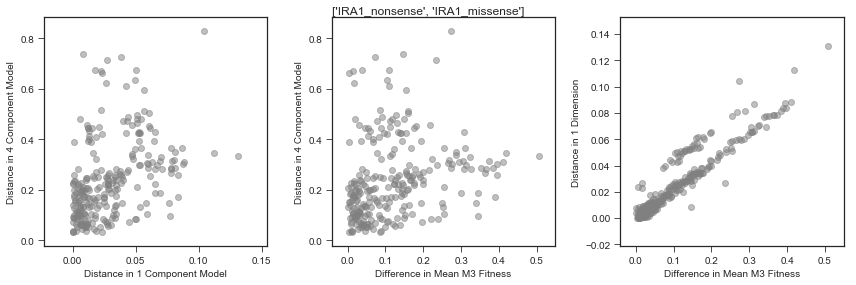

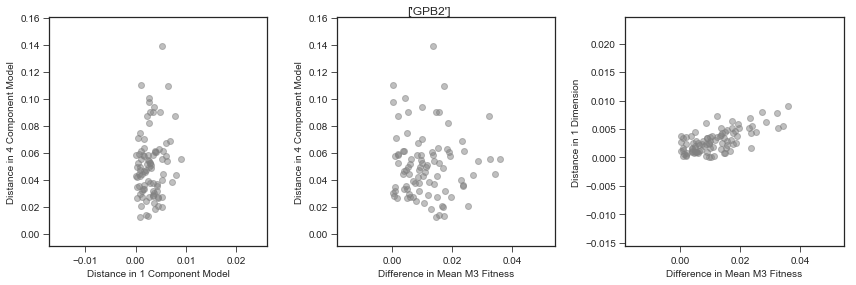

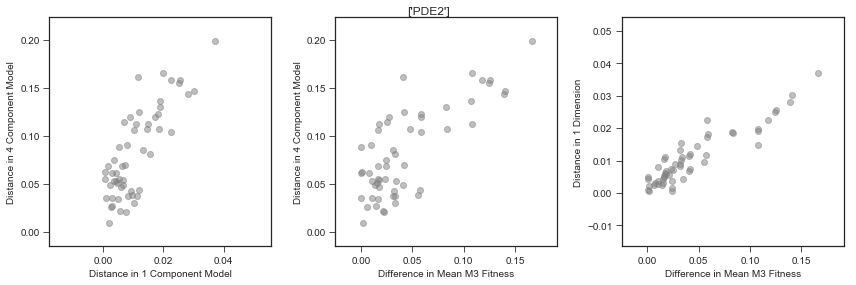

In [171]:
models = [3,8]
models = [0,8]
models = [0,3]
genes = ['Diploid','IRA1','GPB2','PDE2']
genes =['Diploid','Diploid_adaptive',['Diploid','Diploid_adaptive'],
        'IRA1_nonsense','IRA1_missense',['IRA1_nonsense','IRA1_missense'],'GPB2','PDE2']

for gene in genes:
    plt.figure(figsize=(12,4))
    
    
    if type(gene) is not list:
        gene = [gene]
        
    plt.suptitle(str(gene))
    
#     these_bcs = this_data[this_data['gene']==gene]['barcode'].values
    these_bcs = this_data[this_data['mutation_type'].isin(gene)]['barcode'].values
    these_indices = np.where(np.isin(all_bcs,these_bcs))[0]
    these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][models[1]][these_indices,:]

    full_dist = distance.pdist(these_locs)
    one_dist = distance.pdist(datasets['subtle_to_strong_wothers']['mut_locs'][models[0]][these_indices,:])
    fitness_diff = distance.pdist(np.asarray(np.mean(datasets['subtle_to_strong_wothers']['this_fitness'][these_indices,:len(sorted_m3_cols)],axis=1).reshape((len(these_indices),1))))

    plt.subplot(131)
    
    plt.scatter(one_dist,full_dist,color='gray',alpha=0.5)
    
    plt.xlabel(f'Distance in {models[0] +1 } Component Model')
    plt.ylabel(f'Distance in {models[1] +1 } Component Model')
    
    
    plt.subplot(132)
    
    plt.scatter(fitness_diff,full_dist,color='gray',alpha=0.5)
    
    plt.xlabel('Difference in Mean M3 Fitness')
    plt.ylabel(f'Distance in {models[1] +1 } Component Model')
    
    
    plt.subplot(133)

    plt.scatter(fitness_diff,one_dist,color='gray',alpha=0.5)
    
    plt.xlabel('Difference in Mean M3 Fitness')
    plt.ylabel(f'Distance in {models[0] +1 } Dimension')
    
    plt.tight_layout()



In [147]:
np.where(np.isin(fitness_cols,m3_cols))[0]

array([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [148]:
fitness_cols

['19_fitness',
 'M3_Batch_3_fitness',
 'M3_Batch_6_fitness',
 'M3_Batch_13_fitness',
 'M3_Batch_18_fitness',
 'M3_Batch_20_fitness',
 'M3_Batch_21_fitness',
 'M3_Batch_23_fitness',
 '1BB_M3_fitness',
 '1BB_Baffle_fitness',
 '1BB_1.4%Gluc_fitness',
 '1BB_1.8%Gluc_fitness',
 '1BB_0.2MNaCl_fitness',
 '1BB_0.5MNaCl_fitness',
 '1BB_0.2MKCl_fitness',
 '1BB_0.5MKCl_fitness',
 '1BB_8.5uMGdA_fitness',
 '1BB_17uMGdA_fitness',
 '1BB_2ugFlu_fitness',
 '1BB_0.5ugFlu_fitness',
 '1BB_1%Raf_fitness',
 '1BB_0.5%Raf_fitness',
 '1BB_1%Gly_fitness',
 '1BB_1%EtOH_fitness',
 '1BB_SucRaf_fitness',
 'Ferm_44hr_Transfer_fitness',
 'Ferm_40hr_Transfer_fitness',
 'Ferm_54hr_Transfer_fitness',
 'Ferm_50hr_Transfer_fitness',
 'Resp_24hr_Transfer_fitness',
 'Resp_3Day_Transfer_fitness',
 'Resp_4Day_Transfer_fitness',
 'Resp_5Day_Transfer_fitness',
 'Resp_6Day_Transfer_fitness',
 'Resp_7Day_Transfer_fitness',
 'DMSO_fitness',
 'Geldanamycin8.5uM_fitness',
 '1.4%_fitness',
 '1.5%_fitness',
 '1.6%_fitness',
 '1.7%_fit

In [150]:



np.mean(datasets['subtle_to_strong_wothers']['this_fitness'][:,:len(sorted_m3_cols)],axis=1)

array([ 1.17920425,  0.89149   ,  1.0832865 ,  1.06601443,  0.75107256,
        0.70917807,  0.63028333,  0.7968139 ,  0.50055611,  0.81965372,
        0.39111625,  0.99908096,  0.24569895,  0.86801343,  0.55871386,
        0.9114976 ,  0.83038685,  0.69233277,  0.90685263,  0.70294162,
        0.60171975,  0.65959387,  0.38141916,  0.27246193,  0.79611164,
        0.80100092,  0.8086238 ,  0.99804938,  0.66865153,  0.69859286,
        0.54498614,  1.06118061,  0.80199794,  0.81184763,  0.32067309,
        1.05591385,  0.78719342,  0.96221443,  1.03746014,  0.80286572,
        0.32675904,  0.79118423,  1.0160962 ,  1.02532017,  0.60251163,
        0.5849295 ,  0.8107996 ,  0.79194575,  1.06275503,  0.71774539,
        1.01578392,  0.72569562,  0.97914481,  0.55423431,  0.79581801,
        0.61376139,  0.36245332,  0.92390253,  0.71034892,  0.432823  ,
        0.79272649,  0.78350222,  0.78743862,  0.98419628,  0.70093403,
        1.04626361,  0.69488516,  1.01061421,  0.34797551,  0.31

NameError: name 'pca' is not defined

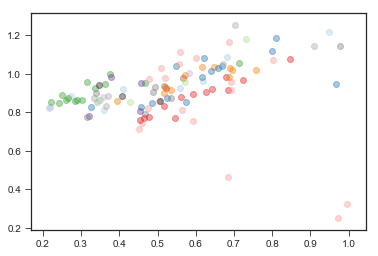

In [225]:
## The key is looking at the distribution of distances from each geometric median.

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']

dataset = datasets['subtle_to_strong_wothers']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = dataset['centroids'][model]

these_indices = []
these_bcs = []
for b,bc in enumerate(all_bcs):
    if this_data[this_data['barcode']==bc]['mutation_type'].values[0] in ['other_adaptive']:
        
        these_indices.append(b)
        these_bcs.append(bc)
        

these_locs = dataset['mut_locs'][model][these_indices,:]
all_locs = dataset['mut_locs'][model]
for b,bc in enumerate(these_bcs):
    
    plt.figure(figsize=(4*len(medians_to_include),4))
    
    gene = this_data[this_data['barcode']==bc]['additional_muts'].values[0]
    plt.suptitle(f'{bc} {gene}')

    for m,mutant_type in enumerate(medians_to_include):
        plt.subplot(1,len(medians_to_include),m+1)
        all_distances = distance.cdist(all_locs,[geom_medians[mutant_type]])
        vals,bins = np.histogram(all_distances)
        
        sns.distplot(all_distances,color=mutant_colorset[mutant_type],kde=False,bins=bins)

        sns.distplot(dataset['distance_from_centroid'][model][mutant_type],bins=bins,
                     color=mutant_colorset[mutant_type],rug=True,kde=False)

        this_distance = distance.pdist([these_locs[b,:],geom_medians[mutant_type]])
        sns.rugplot([this_distance],color='k',lw=4,height=0.05)

        plt.xlabel(f'Distance from {mutant_type} Centroid')
        plt.savefig(f'adaptive_other_{bc}_distance_from_medians_{model+1}.pdf',bbox_inches='tight')



In [ ]:
sns.distplot(datasets['subtle_to_strong_wothers']['distances'][5])

In [52]:
from sklearn.decomposition import PCA

In [180]:
model = 8
medians_to_include = ['Diploid','IRA1_nonsense','IRA1_missense','GPB2','PDE2','ExpNeutral']
mutants_to_orient_by= ['GPB2','PDE2']
# mutants_to_orient_by = ['Diploid','IRA1_nonsense']
# mutants_to_orient_by = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']
all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets['subtle_to_strong_wothers']['geom_medians'][model]
these_indices = []
these_bcs = []

for b,bc in enumerate(all_bcs):
    if this_data[this_data['barcode']==bc]['mutation_type'].values[0] in mutants_to_orient_by:
        
        these_indices.append(b)
        these_bcs.append(bc)
        

these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]

these_locs = np.asarray([geom_medians[mut_type] for mut_type in mutants_to_orient_by])

offcenter = np.mean(these_locs,axis=0)
centered_medians = these_locs + (-1)*np.tile(offcenter,these_locs.shape[0]).reshape(these_locs.shape)

# inti
from sklearn.decomposition import PCA
pca= PCA()
pca.fit(centered_medians)
print(pca.explained_variance_ratio_)

these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]

# pca.transform(these)
        



[1.00000000e+00 5.26537256e-34]


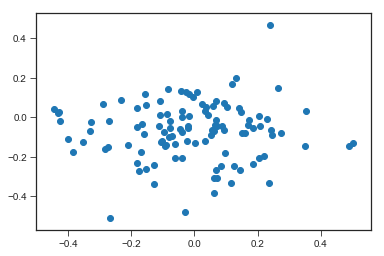

In [183]:
plt.scatter(pca.transform(these_locs)[:,0],pca.transform(these_locs)[:,1])

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


KeyError: 'M3_Batch_23'

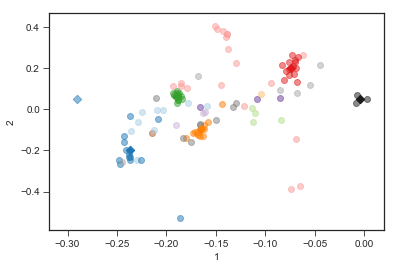

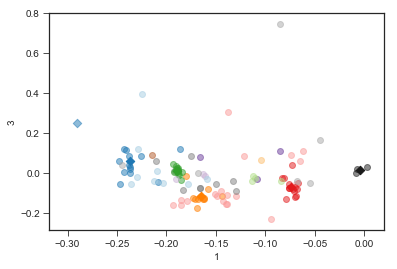

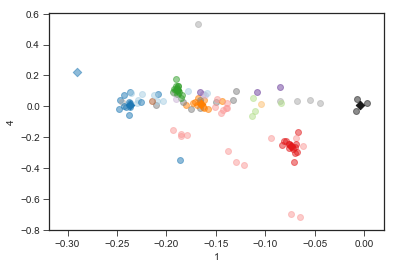

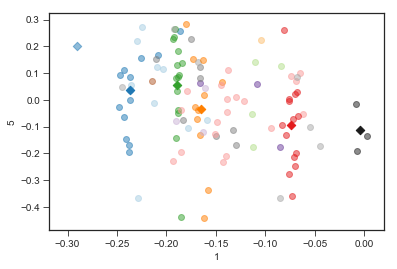

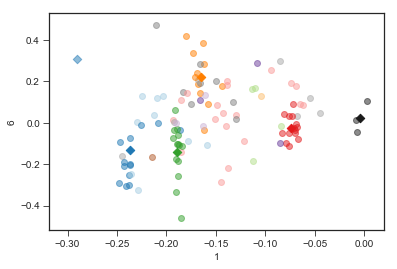

...

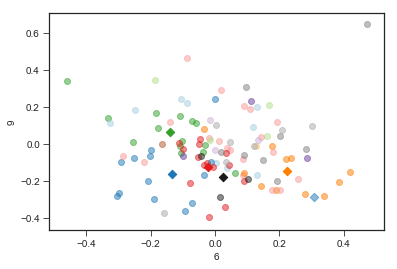

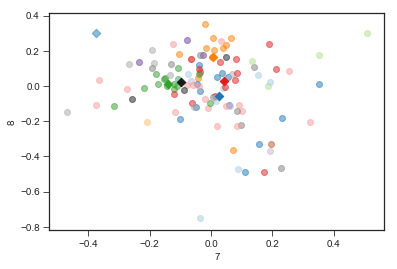

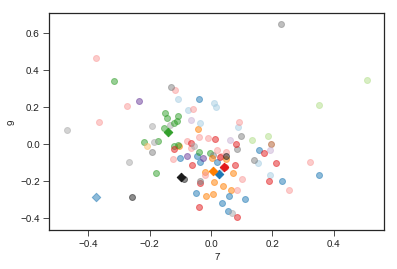

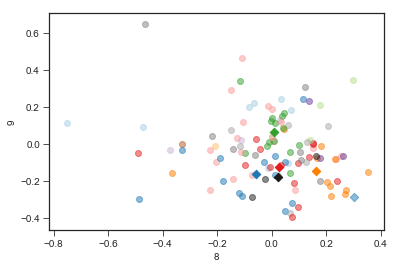

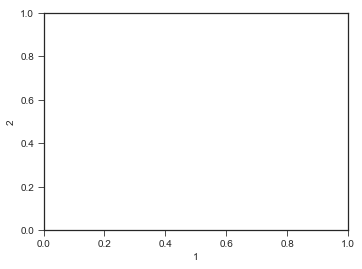

In [118]:
## plotting the space

this_set = 'subtle_to_strong_wothers'
# this_set = 'subtle_to_strong_wothers_ALLTEST'

model = 8
medians_to_include = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']
mutants_to_orient_by= ['GPB2','PDE2']
# mutants_to_orient_by = ['Diploid','IRA1_nonsense']
mutants_to_orient_by = ['Diploid','IRA1_nonsense','GPB2','PDE2','ExpNeutral']
all_bcs = list(datasets[this_set]['training_bcs']) +  list(datasets[this_set]['testing_bcs'])
all_bcs = sorted(all_bcs)
geom_medians = datasets[this_set]['centroids'][model]
these_indices = []
these_bcs = []

for b,bc in enumerate(all_bcs):
    if this_data[this_data['barcode']==bc]['mutation_type'].values[0] in mutants_to_orient_by:
        
        these_indices.append(b)
        these_bcs.append(bc)
        
these_bcs = all_bcs
these_indices = range(len(all_bcs))

these_locs = datasets[this_set]['mut_locs'][model][these_indices,:]

# these_locs = np.asarray([geom_medians[mut_type] for mut_type in mutants_to_orient_by])

offcenter = np.mean(these_locs,axis=0)
centered_medians = these_locs + (-1)*np.tile(offcenter,these_locs.shape[0]).reshape(these_locs.shape)

for x,y in combinations(range(model+1),2):
    plt.figure()
    plt.xlabel(x+1)
    plt.ylabel(y+1)
    for b,bc in enumerate(these_bcs):
        mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
        if bc == 151:
            plt.scatter(these_locs[b,x],these_locs[b,y],color=mutant_colorset[mutant_type],marker='D',alpha=0.5)
        else:
        
            plt.scatter(these_locs[b,x],these_locs[b,y],color=mutant_colorset[mutant_type],alpha=0.5)
    for mutant_type in medians_to_include:
        plt.scatter(geom_medians[mutant_type][x],geom_medians[mutant_type][y],color=mutant_colorset[mutant_type],marker='D')
    plt.savefig(f'space_plotted_m{model}_{x+1}_{y+1}.pdf')
    
these_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols)
these_locs = datasets[this_set]['cond_locs'][model]
for x,y in combinations(range(model+1),2):
    plt.figure(figsize=(12,4))
    plt.subplot(121)
    plt.xlabel(x+1)
    plt.ylabel(y+1)
    for c,cond in enumerate(these_cols):
        plt.scatter(these_locs[c,x],these_locs[c,y],color=condition_colorset[cond.replace('_fitness','')],alpha=0.5)
        
    plt.subplot(122)
    plt.xlabel(x+1)
    plt.ylabel(y+1)
    for c,cond in enumerate(these_cols):
        plt.scatter(these_locs[c,x],these_locs[c,y],color=condition_colorset[cond.replace('_fitness','')],alpha=0.5)
    
    ts = []
    for c,cond in enumerate(these_cols):
        ts.append(plt.text(these_locs[c,x],these_locs[c,y], color=condition_colorset[cond.replace('_fitness','')],s=renamed_conditions[cond.replace('_fitness','')]))
    adjust_text(ts, x=these_locs[:,x],y=these_locs[:,y], force_points=0.1, arrowprops=dict(arrowstyle='-', color='lightgray'))
    
                    
    plt.savefig(f'space_plotted_conditions_SbyS_m{model}_{x+1}_{y+1}.pdf')
#     plt.savefig(f'space_plotted_conditions_m{model}_{x+1}_{y+1}.pdf')
    




In [75]:
# ferm_grad_conditions = ['Ferm_44hr_Transfer':12,
#                   'Ferm_40hr_Transfer':8,
#                   'Ferm_54hr_Transfer':22,
#                   'Ferm_50hr_Transfer':18,
#                    'M3_Batch_13':16,
#                    'M3_Batch_18':16]

# this_data['_24hr_Transfer_fitness']

LiEtAl2018_components = p.read_csv('../data/Li_et_al_2018_ferm_resp_stat_components.csv')


Text(0,0.5,'1 Day Fitness')

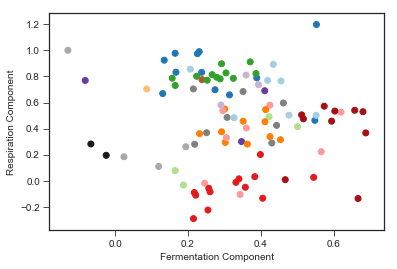

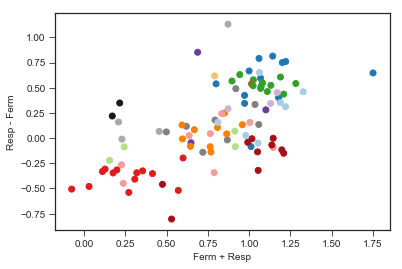

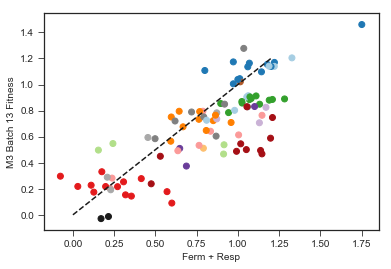

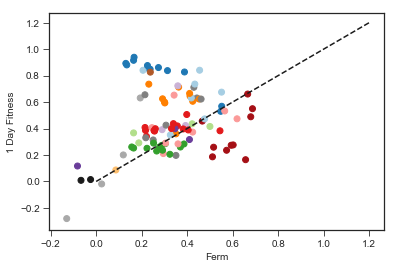

In [76]:
our_bcs = LiEtAl2018_components[LiEtAl2018_components['BarcodeID'].isin(all_bcs)]

plt.scatter(our_bcs['Fermentation_Dependent_Component'].values,our_bcs['Respiration_Dependent_Component'].values,
            color=[mutant_colorset[this_data[this_data['barcode']==bc]['mutation_type'].values[0]] for bc in our_bcs['BarcodeID'].values])


plt.xlabel('Fermentation Component')
plt.ylabel('Respiration Component')

plt.figure()

plt.scatter(our_bcs['Fermentation_Dependent_Component'].values+our_bcs['Respiration_Dependent_Component'].values,our_bcs['Respiration_Dependent_Component'].values-our_bcs['Fermentation_Dependent_Component'].values,
            color=[mutant_colorset[this_data[this_data['barcode']==bc]['mutation_type'].values[0]] for bc in our_bcs['BarcodeID'].values])

plt.xlabel('Ferm + Resp')
plt.ylabel('Resp - Ferm')

plt.figure()

plt.scatter(our_bcs['Fermentation_Dependent_Component'].values+our_bcs['Respiration_Dependent_Component'].values,this_data[this_data['barcode'].isin(our_bcs['BarcodeID'])]['M3_Batch_13_fitness'].values,
            color=[mutant_colorset[this_data[this_data['barcode']==bc]['mutation_type'].values[0]] for bc in our_bcs['BarcodeID'].values])

plt.plot([0,1.2],[0,1.2],'k--')
plt.xlabel('Ferm + Resp')
plt.ylabel('M3 Batch 13 Fitness')

plt.figure()

plt.scatter(our_bcs['Fermentation_Dependent_Component'].values,this_data[this_data['barcode'].isin(our_bcs['BarcodeID'])]['Resp_24hr_Transfer_fitness'].values,
            color=[mutant_colorset[this_data[this_data['barcode']==bc]['mutation_type'].values[0]] for bc in our_bcs['BarcodeID'].values])

plt.plot([0,1.2],[0,1.2],'k--')
plt.xlabel('Ferm')
plt.ylabel('1 Day Fitness')


In [ ]:
from sklearn.linear_model import LinearRegression

In [131]:
model = 8
# this_set = 'train_t'
dataset = datasets['subtle_to_strong_wothers']

all_bcs = list(dataset['training_bcs']) +  list(dataset['testing_bcs'])
all_bcs = sorted(all_bcs)

training_bcs = list(dataset['training_bcs'])
testing_bcs = list(dataset['testing_bcs'])

training_bcs = sorted(training_bcs + testing_bcs)


training_bcs = np.intersect1d(LiEtAl2018_components['BarcodeID'].values,training_bcs)
testing_bcs = np.intersect1d(LiEtAl2018_components['BarcodeID'].values,testing_bcs)

train_Ferm_Resp_components = LiEtAl2018_components[LiEtAl2018_components['BarcodeID'].isin(training_bcs)]

these_indices = np.where(np.isin(all_bcs,training_bcs))[0]
these_locs = dataset['mut_locs'][model][these_indices,:]
    

ferm_reg = LinearRegression().fit(these_locs,train_Ferm_Resp_components['Fermentation_Dependent_Component'])
resp_reg = LinearRegression().fit(these_locs,train_Ferm_Resp_components['Respiration_Dependent_Component'])
stat_reg = LinearRegression().fit(these_locs,train_Ferm_Resp_components['Stationary_Dependent_Rate'])



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


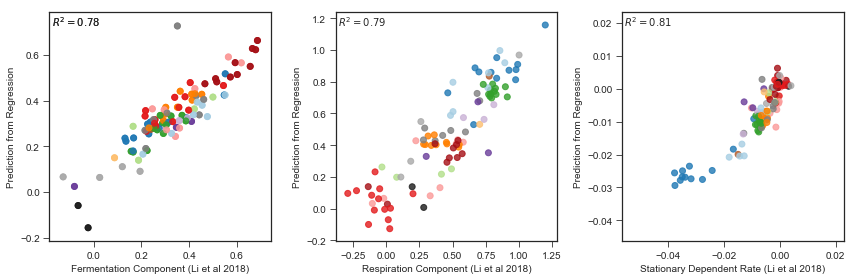

In [132]:
colors = []
for mt in this_data[this_data['barcode'].isin(training_bcs)]['mutation_type'].values:
    colors.append(mutant_colorset[mt])

plt.figure(figsize=(12,4))

plt.subplot(131)

plt.text(x=0.01,y=0.94,s=rf"$R^2={ferm_reg.score(these_locs,train_Ferm_Resp_components['Fermentation_Dependent_Component']):.2f}$",transform=plt.gca().transAxes)
plt.scatter(train_Ferm_Resp_components['Fermentation_Dependent_Component'],ferm_reg.predict(these_locs),color=colors,alpha=0.8)

plt.xlabel('Fermentation Component (Li et al 2018)')
plt.ylabel('Prediction from Regression')

plt.subplot(132)



plt.text(x=0.01,y=0.94,s=rf"$R^2={resp_reg.score(these_locs,train_Ferm_Resp_components['Respiration_Dependent_Component']):.2f}$",transform=plt.gca().transAxes)
plt.scatter(train_Ferm_Resp_components['Respiration_Dependent_Component'],resp_reg.predict(these_locs),color=colors,alpha=0.8)

# xmin,x

plt.xlabel('Respiration Component (Li et al 2018)')
plt.ylabel('Prediction from Regression')

plt.subplot(131)

plt.text(x=0.01,y=0.94,s=rf"$R^2={ferm_reg.score(these_locs,train_Ferm_Resp_components['Fermentation_Dependent_Component']):.2f}$",transform=plt.gca().transAxes)
plt.scatter(train_Ferm_Resp_components['Fermentation_Dependent_Component'],ferm_reg.predict(these_locs),color=colors,alpha=0.8)

plt.xlabel('Fermentation Component (Li et al 2018)')
plt.ylabel('Prediction from Regression')

plt.subplot(133)



plt.text(x=0.01,y=0.94,s=rf"$R^2={stat_reg.score(these_locs,train_Ferm_Resp_components['Stationary_Dependent_Rate']):.2f}$",transform=plt.gca().transAxes)
plt.scatter(train_Ferm_Resp_components['Stationary_Dependent_Rate'],stat_reg.predict(these_locs),color=colors,alpha=0.8)


plt.xlabel('Stationary Dependent Rate (Li et al 2018)')
plt.ylabel('Prediction from Regression')



plt.tight_layout()
plt.savefig(f'linear_regression_to_yuping_components_{model+1}.pdf',bbox_inches='tight')

In [133]:
print('Fermentation Coefficients')
print(ferm_reg.intercept_,ferm_reg.coef_)
print('Respiration Coefficients')
print(resp_reg.intercept_,resp_reg.coef_)
print('Stationary Coefficients')
print(stat_reg.intercept_,stat_reg.coef_)

Fermentation Coefficients
-0.09887408601414843 [-2.58807562  0.55202888 -0.25821996 -0.5935177  -0.02088413  0.40035137
  0.24044786  0.16459508  0.16062657]
Respiration Coefficients
0.05628156788709515 [-2.95624006 -0.17971555  0.47890366  0.50438605  0.21306136 -0.16145247
 -0.30166051 -0.2453155   0.03751104]
Stationary Coefficients
0.0033092095434594264 [ 7.59500814e-02  1.98738139e-02 -1.33984499e-02 -3.24020390e-04
  6.96584461e-04  1.54038677e-02 -5.06990701e-03  1.90021040e-06
  1.40173220e-02]


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


[10.93638492  4.5540093 ]
[6.4778519  2.49572063]
[11.31630219  0.26814675]
[7.11241354 3.24123125]
[5.57237658 0.39181868]
[-3.00969651 -3.7290007 ]
[-7.47906582 -3.99501014]
[10.86039   1.146179]
[-3.07222704  4.16331497]
[-2.38209668  2.39210037]
[-1.96303003  0.0767944 ]
[-1.58956543  2.086561  ]
[-4.13502878  0.59726947]
[3.43934913 5.09585955]
[2.7327546 2.7698822]
[-0.5057878  1.1547251]


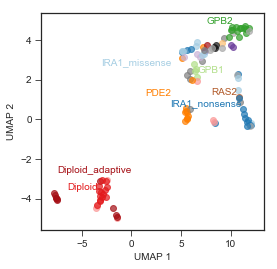

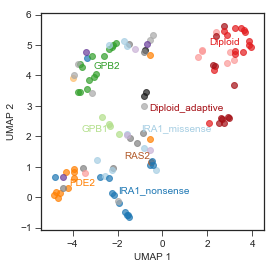

In [129]:
all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
# for b,bc in enumerate(all_bcs):
#     these_indices.append(b)
#     these_bcs.append(bc)
        
these_bcs = all_bcs
these_indices = range(len(all_bcs))

all_genes = np.unique(this_data[this_data['barcode'].isin(all_bcs)]['mutation_type'].values)
annotation_genes = all_genes

annotation_genes = ['GPB2','GPB1','IRA1_nonsense','IRA1_missense','PDE2','Diploid','Diploid_adaptive','RAS2']
annotation_genes = [gene for gene in annotation_genes if gene in all_genes]


for model in [3,8]:
    plt.figure(figsize=(4,4))
    these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]

    these_bcs = all_bcs

    trans = umap.UMAP(n_neighbors=5).fit(these_locs)

    for b,bc in enumerate(these_bcs):
        mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
        plt.scatter(trans.embedding_[b, 0], trans.embedding_[b, 1], color=tools.mutant_colorset[mutant_type],alpha=0.7)
    
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    
    plt.savefig(f'umap_visualization_m{model+1}_unannotated.pdf',bbox_inches='tight')
    
    ts = []
    for gene in annotation_genes:
        these_bcs = this_data[this_data['mutation_type']==gene]['barcode'].values
        ix = np.where(np.isin(all_bcs,these_bcs))[0]
        
        mean_loc =  np.mean(trans.embedding_[ix,:],axis=0)
        mean_loc = tools.geometric_median(trans.embedding_[ix,:])
        print(mean_loc)
        ts.append(plt.text(mean_loc[0], mean_loc[1], color=mutant_colorset[gene],s=gene))
    adjust_text(ts, x=trans.embedding_[:, 0], y=trans.embedding_[:, 1], force_points=(0.5,0.5))
        
    
    
    
#     plt.gca().set_aspect('equal')
    plt.savefig(f'umap_visualization_m{model+1}_SOMEannotated.pdf',bbox_inches='tight')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


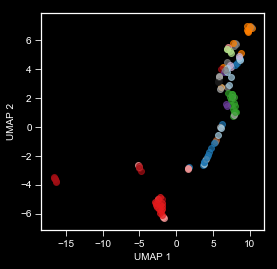

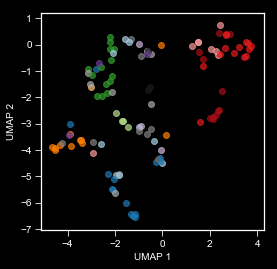

In [83]:
all_bcs = list(datasets['subtle_to_strong_wothers']['training_bcs']) +  list(datasets['subtle_to_strong_wothers']['testing_bcs'])
all_bcs = sorted(all_bcs)
# for b,bc in enumerate(all_bcs):
#     these_indices.append(b)
#     these_bcs.append(bc)
        
these_bcs = all_bcs
these_indices = range(len(all_bcs))

all_genes = np.unique(this_data[this_data['barcode'].isin(all_bcs)]['mutation_type'].values)

for model in [3,8]:
    plt.figure(figsize=(4,4))
    these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]

    these_bcs = all_bcs

    trans = umap.UMAP(n_neighbors=5).fit(these_locs)

    for b,bc in enumerate(these_bcs):
        mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
        plt.scatter(trans.embedding_[b, 0], trans.embedding_[b, 1], color=tools.mutant_colorset[mutant_type],alpha=0.7)
    
#     ts = []
#     for gene in all_genes:
#         these_bcs = this_data[this_data['mutation_type']==gene]['barcode'].values
#         ix = np.where(np.isin(all_bcs,these_bcs))[0]
        
#         mean_loc =  np.mean(trans.embedding_[ix,:],axis=0)
#         mean_loc = tools.geometric_median(trans.embedding_[ix,:])
#         print(mean_loc)
#         ts.append(plt.text(mean_loc[0], mean_loc[1], color=mutant_colorset[gene],s=gene))
#     adjust_text(ts, x=trans.embedding_[:, 0], y=trans.embedding_[:, 1], force_points=0.1)
        
    
    
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
#     plt.gca().set_aspect('equal')
    plt.savefig(f'talk_figures/umap_visualization_m{model+1}_notannotated.pdf',bbox_inches='tight')

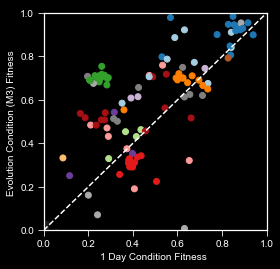

In [97]:
these_data = this_data[this_data['barcode'].isin(all_bcs)]

plt.figure(figsize=(4,4))

colors = [mutant_colorset[gene] for gene in these_data['mutation_type'].values]

m3_condition = '1BB_M3_fitness'
# m3_condition = 'M3_Batch_18_fitness'
x_data = these_data[m3_condition].values


# x_data = np.mean(these_data[sorted_m3_cols].values,axis=1)

plt.scatter(these_data['Resp_24hr_Transfer_fitness'].values,x_data,color=colors)
plt.xlim(0,1)
plt.ylim(0,1)
plt.plot([0,1],[0,1],'w--')

plt.ylabel('Evolution Condition (M3) Fitness ')
plt.xlabel('1 Day Condition Fitness ')
plt.savefig('talk_figures/1bb_m3_vs_1day_fitness_reverse.pdf',bbox_inches='tight')

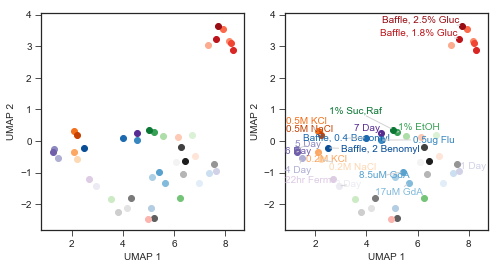

In [132]:
anotation_cols = [
#     'M3_Batch_23_fitness',
#  '19_fitness',
#  'M3_Batch_18_fitness',
#  'M3_Batch_20_fitness',
#  'M3_Batch_3_fitness',
#  'M3_Batch_13_fitness',
#  'M3_Batch_6_fitness',
#  '1BB_M3_fitness',
#  'M3_Batch_21_fitness',
#  '1BB_1.4%Gluc_fitness',
#  'Ferm_44hr_Transfer_fitness',
 '1BB_1%Gly_fitness',
 '1BB_1.8%Gluc_fitness',
 '1BB_0.5%Raf_fitness',
#  'Geldanamycin8.5uM_fitness',
#  'Ferm_40hr_Transfer_fitness',
 '1BB_Baffle_fitness',
 '1.5%_fitness',
#  'DMSO_fitness',
#  '1BB_1%Raf_fitness',
 '1.7%_fitness',
 '1.6%_fitness',
 'Ferm_50hr_Transfer_fitness',
 '1.4%_fitness',
 '1BB_2ugFlu_fitness',
 'Ferm_54hr_Transfer_fitness',
 'Resp_3Day_Transfer_fitness',
 '1BB_17uMGdA_fitness',
 '1.8%_fitness',
 'Resp_24hr_Transfer_fitness',
 '1BB_1%EtOH_fitness',
 '1BB_8.5uMGdA_fitness',
 '1BB_SucRaf_fitness',
 '2.5%_fitness',
 'Resp_4Day_Transfer_fitness',
 'Resp_5Day_Transfer_fitness',
 '1BB_0.2MNaCl_fitness',
 '1BB_0.2MKCl_fitness',
 '1BB_0.5ugFlu_fitness',
 'Ben0.4_fitness',
 'Ben2_fitness',
 'Resp_6Day_Transfer_fitness',
 'Resp_7Day_Transfer_fitness',
 '1BB_0.5MKCl_fitness',
 '1BB_0.5MNaCl_fitness']

annotation_cols = sorted_nonm3_cols[first_nonsubtle:]

for model in [8]:
    
#     for x,y in combinations(range(model),2)


    these_locs = datasets['subtle_to_strong_wothers']['cond_locs'][model]
    trans = umap.UMAP(n_neighbors=5).fit(these_locs)


    these_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols[:first_nonsubtle])
    these_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols)

    plt.figure(figsize=(8,4))
    plt.subplot(121)
    for c,cond in enumerate(these_cols):
        plt.scatter(trans.embedding_[c, 0], trans.embedding_[c, 1], color=condition_colorset[cond.replace('_fitness','')],)
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    # plt.legend(loc=(1.0,0.0),ncol=3)
    # plt.savefig('umap_condition_visualization.pdf',bbox_inches='tight')

    plt.subplot(122)
    ts = []
    for c,cond in enumerate(these_cols):
        plt.scatter(trans.embedding_[c, 0], trans.embedding_[c, 1], color=condition_colorset[cond.replace('_fitness','')],)
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    # plt.legend(loc=(1.0,0.0),ncol=3)
    # plt.savefig('umap_condition_visualization.pdf',bbox_inches='tight')

    for c,cond in enumerate(annotation_cols):
        index = np.where(np.isin(these_cols,cond))[0]
        ts.append(plt.text(trans.embedding_[index, 0], trans.embedding_[index, 1], color=condition_colorset[cond.replace('_fitness','')],s=renamed_conditions[cond.replace('_fitness','')]))
    adjust_text(ts, x=trans.embedding_[:, 0], y=trans.embedding_[:, 1], force_points=0.1, arrowprops=dict(arrowstyle='-', 
    color='lightgray'))


    plt.savefig(f'umap_condition_visualization_autolabel_SOMEannotated_sidebyside_m{model}.pdf',bbox_inches='tight')


In [ ]:
for model in [2,3]:
    
    for x,y in combinations(range(model),2)


    these_locs = datasets['subtle_to_strong_wothers']['cond_locs'][model]
#     trans = umap.UMAP(n_neighbors=5).fit(these_locs)


    these_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols[:first_nonsubtle])
    these_cols = list(sorted_m3_cols)+list(sorted_nonm3_cols)

    plt.figure(figsize=(12,4))
    plt.subplot(121)
    for c,cond in enumerate(these_cols):
        plt.scatter(trans.embedding_[c, 0], trans.embedding_[c, 1], color=condition_colorset[cond.replace('_fitness','')],)
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    # plt.legend(loc=(1.0,0.0),ncol=3)
    # plt.savefig('umap_condition_visualization.pdf',bbox_inches='tight')

    plt.subplot(122)
    ts = []
    for c,cond in enumerate(these_cols):
        plt.scatter(trans.embedding_[c, 0], trans.embedding_[c, 1], color=condition_colorset[cond.replace('_fitness','')],)
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    # plt.legend(loc=(1.0,0.0),ncol=3)
    # plt.savefig('umap_condition_visualization.pdf',bbox_inches='tight')

    for c,cond in enumerate(these_cols):
        ts.append(plt.text(trans.embedding_[c, 0], trans.embedding_[c, 1], color=condition_colorset[cond.replace('_fitness','')],s=renamed_conditions[cond.replace('_fitness','')]))
    adjust_text(ts, x=trans.embedding_[:, 0], y=trans.embedding_[:, 1], force_points=0.1, arrowprops=dict(arrowstyle='-', 
    color='lightgray'))


#     plt.savefig(f'umap_condition_visualization_autolabel_sidebyside_m{model}.pdf',bbox_inches='tight')



In [70]:
ira1_non_class1 = []
ira1_non_class2 = []
ira1_non_class3 = []
ira1_non_class4 = []

for b,bc in enumerate(these_bcs):
    mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
    if mutant_type =='IRA1_nonsense':
        if (trans.embedding_[b, 0] < -3) & (trans.embedding_[b, 1] < -1):
            ira1_non_class1.append(bc)
        elif (trans.embedding_[b, 0] > -3) & (trans.embedding_[b, 1] < -1):
            ira1_non_class2.append(bc)
        elif (trans.embedding_[b, 0] < -3) & (trans.embedding_[b, 1] > 0):
            ira1_non_class3.append(bc)
        elif (trans.embedding_[b, 0] > -3) & (trans.embedding_[b, 1] > 0):
            ira1_non_class4.append(bc)

In [80]:
this_data[this_data['barcode'].isin(ira1_non_class3)]

,barcode,gene,type,ploidy,class,additional_muts,1.4%-R1_error,1.4%-R1_fitness,1.4%-R2_error,1.4%-R2_fitness,...,1BB_1%Raf_error,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type
1,151,IRA1,stop_gained,Haploid,PKA,SEH1-missense_variant; ZIP1-missense_variant; ...,0.036983,1.465944,0.037611,1.643355,...,0.042757,0.993474,0.017607,1.013754,0.023293,0.667971,0.017206,0.566747,0.050538,IRA1_nonsense


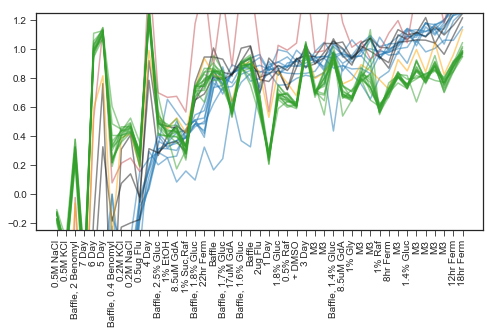

In [87]:
gene_list = ['Diploid']
these_bcs = [7538,262917]

gene_list = ['PDE2']
these_bcs = [60700]
# gene_list = ['CYR1','KOG1']

gene_list = ['PDE2','GPB2']
these_bcs = []

gene_list = ['IRA1_nonsense']
# gene_list = []
# these_bcs = this_data[this_data['mutation_type'].isin(['GPB2'])]['barcode'].values
these_bcs = this_data[this_data['mutation_type'].isin(['IRA1_nonsense'])]['barcode'].values
# these_bcs = [65819,43361,25780]
# these_bcs = 

these_data = this_data[this_data['barcode'].isin(ira1_non_class1)]



all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)

all_cols_sorted = np.asarray(all_cols)[np.argsort(np.mean(these_data[all_cols],axis=0))]

these_data = this_data[this_data['barcode'].isin(these_bcs)]


# all_cols = list(m3_cols) + (nonm3_cols)
plt.figure(figsize=(8,4))
# plt.subplot(121)


for b,bc in enumerate(ira1_non_class1):
    these_data = this_data[this_data['barcode'].isin(ira1_non_class1)]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[gene],alpha=0.5)
    

for b,bc in enumerate(ira1_non_class2):
    these_data = this_data[this_data['barcode'].isin(ira1_non_class2)]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color='k',alpha=0.5)
    
for b,bc in enumerate(ira1_non_class3):
    these_data = this_data[this_data['barcode'].isin(ira1_non_class3)]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color='r',alpha=0.5)
    
for b,bc in enumerate(ira1_non_class4):
    these_data = this_data[this_data['barcode'].isin(ira1_non_class4)]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color='orange',alpha=0.5)
    
for b,bc in enumerate(this_data[this_data['mutation_type'].isin(['GPB2'])]['barcode'].values):
    these_data = this_data[this_data['mutation_type'].isin(['GPB2'])]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset['GPB2'],alpha=0.5)
    

    
    
plt.xticks(range(len(all_cols)),[tools.renamed_conditions[col.split('_fitness')[0]] for col in all_cols_sorted],rotation=90)
plt.savefig('ira1_classes_sorted_by_mean_full.pdf',bbox_inches='tight')

plt.ylim(-0.25,1.25)

plt.savefig('ira1_classes_sorted_by_mean_ylim.pdf',bbox_inches='tight')







(-0.25, 1.25)

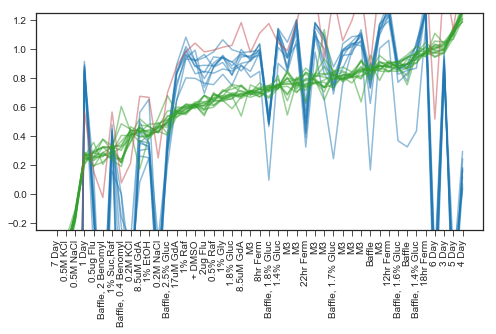

In [86]:
gene_list = ['Diploid']
these_bcs = [7538,262917]

gene_list = ['PDE2']
these_bcs = [60700]
# gene_list = ['CYR1','KOG1']

gene_list = ['PDE2','GPB2']
these_bcs = []

gene_list = ['IRA1_nonsense']
# gene_list = []
# these_bcs = this_data[this_data['mutation_type'].isin(['GPB2'])]['barcode'].values
these_bcs = this_data[this_data['mutation_type'].isin(['IRA1_nonsense'])]['barcode'].values
# these_bcs = [65819,43361,25780]
# these_bcs = 

# these_data = this_data[this_data['barcode'].isin(ira1_non_class1)] 
these_data = this_data[this_data['mutation_type'].isin(['GPB2'])]


all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)

all_cols_sorted = np.asarray(all_cols)[np.argsort(np.mean(these_data[all_cols],axis=0))]

# these_data = this_data[this_data['barcode'].isin(these_bcs)]


# all_cols = list(m3_cols) + (nonm3_cols)
plt.figure(figsize=(8,4))
# plt.subplot(121)


for b,bc in enumerate(ira1_non_class1):
    these_data = this_data[this_data['barcode'].isin(ira1_non_class1)]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[gene],alpha=0.5)
    

# for b,bc in enumerate(ira1_non_class2):
#     these_data = this_data[this_data['barcode'].isin(ira1_non_class2)]
#     this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
#     gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

#     plt.plot(this_bc_data[:,b],color='k',alpha=0.5)

for b,bc in enumerate(this_data[this_data['mutation_type'].isin(['GPB2'])]['barcode'].values):
    these_data = this_data[this_data['mutation_type'].isin(['GPB2'])]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset['GPB2'],alpha=0.5)
    
for b,bc in enumerate(ira1_non_class3):
    these_data = this_data[this_data['barcode'].isin(ira1_non_class3)]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color='r',alpha=0.5)
    

    

    
    
plt.xticks(range(len(all_cols)),[tools.renamed_conditions[col.split('_fitness')[0]] for col in all_cols_sorted],rotation=90)
# plt.savefig('ira1_classes_sorted_by_mean_full.pdf',bbox_inches='tight')

plt.ylim(-0.25,1.25)

# plt.savefig('ira1_classes_sorted_by_mean_ylim.pdf',bbox_inches='tight')








In [197]:
tsne = TSNE(perplexity=10.0)
embedded_locs = tsne.fit_transform(these_locs)

4791
Diploid_adaptive
tL(CAA)G3-upstream_point_variant
15337
Diploid_adaptive
VPS3-synonymous_variant
19297
Diploid_adaptive
None
40865
Diploid_adaptive
USO1-upstream_indel_variant
148821
Diploid_adaptive
None
189102
Diploid_adaptive
None


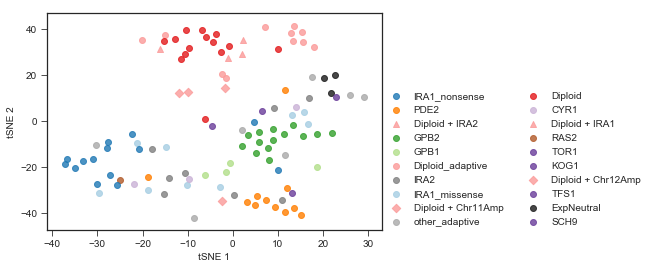

In [200]:
# tsne = TSNE(perplexity=10.0)
# embedded_locs = tsne.fit_transform(these_locs)
# print(pca.explained_variance_ratio_)

these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]

weird_diploids = []

plt.figure()

labeled =[]
for b,bc in enumerate(these_bcs):
    mutant_type = this_data[this_data['barcode']==bc]['mutation_type'].values[0]
    if mutant_type in ['Diploid + Chr11Amp','Diploid + Chr12Amp']:
        marker = 'D'
    elif mutant_type in ['Diploid + IRA1','Diploid + IRA2']:
        marker = '^'
    else:
        marker = 'o'
        
    if embedded_locs[b,0] >10 and embedded_locs[b,1] >22:
        print(bc)
        print(mutant_type)
        print(this_data[this_data['barcode']==bc]['additional_muts'].values[0])
        weird_diploids.append(bc)
    
    if mutant_type not in labeled:
        plt.scatter(embedded_locs[b,0],embedded_locs[b,1],marker=marker,color=mutant_colorset[mutant_type],alpha=0.8,label=mutant_type)
        labeled.append(mutant_type)
    else:
        plt.scatter(embedded_locs[b,0],embedded_locs[b,1],marker=marker,color=mutant_colorset[mutant_type],alpha=0.8)


plt.xlabel('tSNE 1')
plt.ylabel('tSNE 2')
plt.legend(loc=(1.0,0.0),ncol=2)

# plt.savefig(f'tSNE_10_b.pdf',bbox_inches='tight')

In [ ]:
this_data[this_data['barcode'].isin(weird_diploids)]

0


IndexError: index 0 is out of bounds for axis 1 with size 0

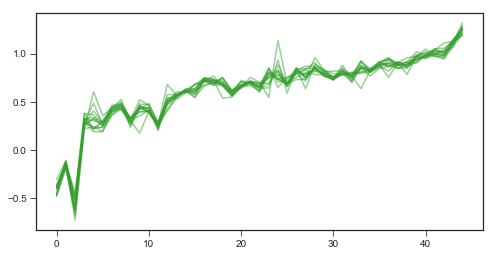

In [416]:
gene_list = ['Diploid']
these_bcs = [7538,262917]

gene_list = ['PDE2']
these_bcs = [60700]
# gene_list = ['CYR1','KOG1']

gene_list = ['PDE2','GPB2']
these_bcs = []

# gene_list = ['IRA1_nonsense']
# gene_list = []
# these_bcs = this_data[this_data['mutation_type'].isin(['GPB2'])]['barcode'].values
these_bcs = this_data[this_data['mutation_type'].isin(['IRA1_nonsense'])]['barcode'].values
# these_bcs = [65819,43361,25780]
# these_bcs = 

# these_data = this_data[this_data['barcode'].isin(ira1_non_class1)] 
these_data = this_data[this_data['mutation_type'].isin(['GPB2','PDE2'])]


all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)

all_cols_sorted = np.asarray(all_cols)[np.argsort(np.mean(these_data[all_cols],axis=0))]

# these_data = this_data[this_data['barcode'].isin(these_bcs)]


# all_cols = list(m3_cols) + (nonm3_cols)
plt.figure(figsize=(8,4))
# plt.subplot(121)


for b,bc in enumerate(this_data[this_data['mutation_type'].isin(['GPB2'])]['barcode'].values):
    these_data = this_data[this_data['mutation_type'].isin(['GPB2'])]
    this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
#     gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset['GPB2'],alpha=0.5)
    
these_data = this_data[this_data['barcode'].isin(['PDE2'])]
this_bc_data = these_data[all_cols_sorted].values.swapaxes(0,1)
for b,bc in enumerate(this_data[this_data['mutation_type'].isin(['PDE2'])]['barcode'].values):
    print(b)
    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset['PDE2'],alpha=0.5)
    

    

    
    
plt.xticks(range(len(all_cols)),[tools.renamed_conditions[col.split('_fitness')[0]] for col in all_cols_sorted],rotation=90)
# plt.savefig('ira1_classes_sorted_by_mean_full.pdf',bbox_inches='tight')

plt.ylim(-0.25,1.25)

# plt.savefig('ira1_classes_sorted_by_mean_ylim.pdf',bbox_inches='tight')









In [ ]:
## gene_list = ['PDE2']
gene_list = ['CYR1','KOG1']



these_bcs =this_data[this_data['gene'].isin(gene_list)]['barcode'].values

these_bcs = [7538,262917]

these_data = this_data[this_data['barcode'].isin(these_bcs)]

all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)
# all_cols = list(m3_cols) + list(nonm3_cols)
plt.figure(figsize=(8,4))
# plt.subplot(121)
pure_diploids = this_data[this_data['gene'].isin(['Diploid'])]
plt.plot(np.mean(pure_diploids[all_cols].values.swapaxes(0,1),axis=1),'r')
for b,bc in enumerate(these_bcs):
    this_bc_data = these_data[all_cols].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]
#     print(these_data[these_data['barcode']==bc]['mutation_type'].values)
    print(gene)
    print(tools.mutant_colorset[gene])
    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[gene],alpha=0.5)
    
plt.ylim(-1.25,1.25)
# plt.ylim(0,1)

# plt.subplot(122)

    
    

# plt.xticks(range(len(all_cols)),[renamed_conditions[col.split('_fitness')[0]] for col in (all_cols)],rotation=90)
# graphs.fitness_featured_genes_figure(ax,this_data,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,other_gene_list,
#                                      ymin=-1.25,ymax=1.5,yticknum=12,median=False,legend=True,legend_cols=2,color_alpha=0.25,gray_alpha=0.05)
# plt.savefig('six_adaptive_andothers_diploids_trajectories_unsorted.pdf',bbox_inches='tight')





([<matplotlib.axis.XTick at 0x120dc4a90>,
 <a list of 45 Text xticklabel objects>)

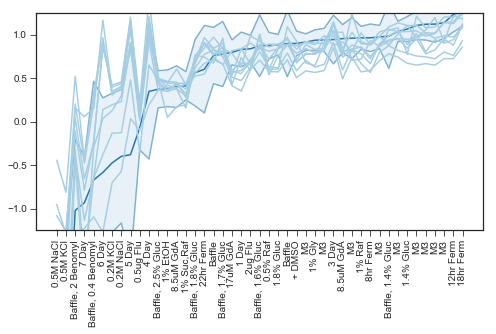

In [223]:
gene_list = ['Diploid']
these_bcs = [7538,262917]

gene_list = ['PDE2']
these_bcs = [60700]
# gene_list = ['CYR1','KOG1']

gene_list = ['PDE2','GPB2']
these_bcs = []

gene_list = ['IRA1_nonsense']
# gene_list = []
# these_bcs = this_data[this_data['mutation_type'].isin(['GPB2'])]['barcode'].values
these_bcs = this_data[this_data['mutation_type'].isin(['IRA1_missense'])]['barcode'].values
# these_bcs = [65819,43361,25780]
# these_bcs = 



all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)

these_data = this_data[this_data['barcode'].isin(these_bcs)]


# all_cols = list(m3_cols) + (nonm3_cols)
plt.figure(figsize=(8,4))
# plt.subplot(121)
for gene in gene_list:
    this_gene = this_data[this_data['mutation_type'].isin([gene])]
    old_mean = np.mean(this_gene[all_cols].values.swapaxes(0,1),axis=1)
    all_cols = np.asarray(all_cols)[np.argsort(old_mean)] # sort the columns
    mean = np.mean(this_gene[all_cols].values.swapaxes(0,1),axis=1)

    std = np.std(this_gene[all_cols].values.swapaxes(0,1),axis=1)
    plt.plot(mean,color=tools.mutant_colorset[gene])
    plt.plot(mean-2*std,color=tools.mutant_colorset[gene],alpha=0.5)
    plt.plot(mean+2*std,color=tools.mutant_colorset[gene],alpha=0.5)
    plt.fill_between(range(len(all_cols)), mean-2*std, mean+2*std,color=tools.mutant_colorset[gene],alpha=0.1)

for b,bc in enumerate(these_bcs):
    this_bc_data = these_data[all_cols].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[gene],alpha=1.0)
    
plt.ylim(-1.25,1.25)
    
    
plt.xticks(range(len(all_cols)),[tools.renamed_conditions[col.split('_fitness')[0]] for col in all_cols],rotation=90)
# plt.savefig('six_adaptive_andothers_diploids_trajectories_unsorted.pdf',bbox_inches='tight')






In [183]:
mean[np.argsort(old_mean)]

array([-0.57992111, -0.40968387, -0.14847875,  0.25337662,  0.26382883,
        0.2948275 ,  0.29852722,  0.31983229,  0.41558859,  0.4186502 ,
        0.42342452,  0.46016341,  0.50709441,  0.56306223,  0.58742091,
        0.61289005,  0.61560054,  0.65323996,  0.67148991,  0.68754369,
        0.68865391,  0.70307911,  0.71006773,  0.72062087,  0.75271289,
        0.75318773,  0.7598257 ,  0.77456808,  0.79611321,  0.80520007,
        0.81051472,  0.81347294,  0.81772843,  0.84499681,  0.85827199,
        0.88129044,  0.88374807,  0.8877417 ,  0.89059706,  0.95616684,
        0.98464536,  1.0050763 ,  1.01074198,  1.11500836,  1.24631586])

PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
PDE2
#ff7f00
other_adaptive
darkgray


([<matplotlib.axis.XTick at 0x11bcd2588>,
 <a list of 20 Text xticklabel objects>)

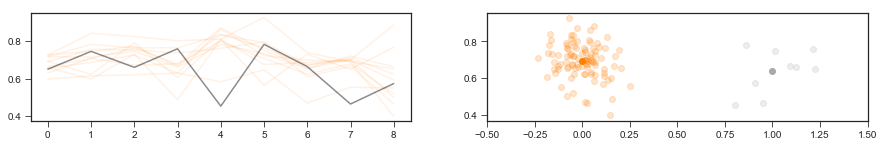

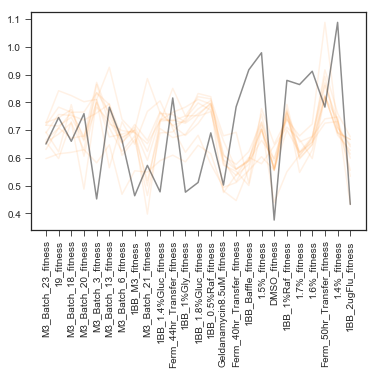

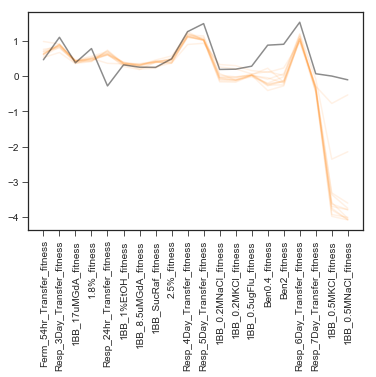

In [173]:


gene_list = ['PDE2']
# gene_list = ['CYR1','KOG1']



these_bcs =this_data[this_data['gene'].isin(gene_list)]['barcode'].values

# these_bcs = list(these_bcs) + [262917]

these_data = this_data[this_data['barcode'].isin(these_bcs)]

all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)
all_cols = list(sorted_m3_cols)
# all_cols = list(m3_cols) + list(nonm3_cols)
plt.figure(figsize=(15,2))
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)

this_bc_data = these_data[all_cols].values.swapaxes(0,1)

for b,bc in enumerate(these_bcs):
    
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]
#     print(these_data[these_data['barcode']==bc]['mutation_type'].values)
    print(gene)
    print(tools.mutant_colorset[gene])
    ax1.plot(this_bc_data[:,b],color=tools.mutant_colorset[gene],alpha=0.1)
    for c in range(len(all_cols)):
        ax2.scatter(tools.jitter_point(0,0.1),this_bc_data[c,b],color=tools.mutant_colorset[gene],alpha=0.2)
plt.scatter(0,np.mean(this_bc_data),color=tools.mutant_colorset[gene],alpha=1.0)
    
these_bcs = [60700]
these_data = this_data[this_data['barcode'].isin(these_bcs)]
this_bc_data = these_data[all_cols].values.swapaxes(0,1)
for b,bc in enumerate(these_bcs):
    
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]
#     print(these_data[these_data['barcode']==bc]['mutation_type'].values)
    print(gene)
    print(tools.mutant_colorset[gene])
    ax1.plot(this_bc_data[:,b],color='k',alpha=0.5)
    for c in range(len(all_cols)):
        ax2.scatter(tools.jitter_point(1,0.1),this_bc_data[c,b],color=tools.mutant_colorset[gene],alpha=0.2)
plt.scatter(1,np.mean(this_bc_data),color=tools.mutant_colorset[gene],alpha=1.0)
plt.xlim(-0.5,1.5)

    
plt.figure()
gene_list = ['PDE2']

these_bcs =this_data[this_data['gene'].isin(gene_list)]['barcode'].values

# these_bcs = list(these_bcs) + [262917]

these_data = this_data[this_data['barcode'].isin(these_bcs)]

all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols[:first_nonsubtle])
# all_cols = list(sorted_m3_cols)
# all_cols = list(m3_cols) + list(nonm3_cols)

this_bc_data = these_data[all_cols].values.swapaxes(0,1)

for b,bc in enumerate(these_bcs):
    
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[gene],alpha=0.1)

    
these_bcs = [60700]
these_data = this_data[this_data['barcode'].isin(these_bcs)]
this_bc_data = these_data[all_cols].values.swapaxes(0,1)
for b,bc in enumerate(these_bcs):
    
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color='k',alpha=0.5)


plt.xticks(range(len(all_cols)),all_cols,rotation=90)

plt.figure()
gene_list = ['PDE2']

these_bcs =this_data[this_data['gene'].isin(gene_list)]['barcode'].values

# these_bcs = list(these_bcs) + [262917]

these_data = this_data[this_data['barcode'].isin(these_bcs)]

all_cols = list(sorted_nonm3_cols[first_nonsubtle:])
# all_cols = list(sorted_m3_cols)
# all_cols = list(m3_cols) + list(nonm3_cols)

this_bc_data = these_data[all_cols].values.swapaxes(0,1)

for b,bc in enumerate(these_bcs):
    
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[gene],alpha=0.1)

    
these_bcs = [60700]
these_data = this_data[this_data['barcode'].isin(these_bcs)]
this_bc_data = these_data[all_cols].values.swapaxes(0,1)
for b,bc in enumerate(these_bcs):
    
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]

    plt.plot(this_bc_data[:,b],color='k',alpha=0.5)


plt.xticks(range(len(all_cols)),all_cols,rotation=90)


CYR1
#cab2d6
KOG1
#6a3d9a
CYR1
#cab2d6
CYR1
#cab2d6


(0, 1)

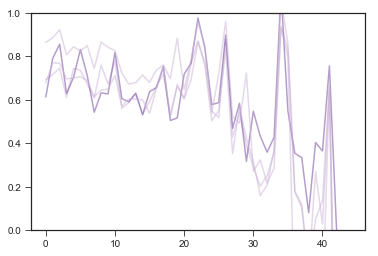

In [114]:
other_gene_list = np.unique([gene for gene in this_data[this_data['barcode'].isin(list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]['mutation_type'].values if gene not in gene_list])
fig,ax = plt.subplots()

gene_list = ['PDE2']
gene_list = ['CYR1','KOG1']

these_bcs =this_data[this_data['gene'].isin(gene_list)]['barcode'].values

these_data = this_data[this_data['barcode'].isin(these_bcs)]

all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)
# all_cols = list(m3_cols) + list(nonm3_cols)
plt.figure(figsize(8,4))
plt.subplot(121)
for b,bc in enumerate(these_bcs):
    this_bc_data = these_data[all_cols].values.swapaxes(0,1)
    gene = these_data[these_data['barcode']==bc]['mutation_type'].values[0]
#     print(these_data[these_data['barcode']==bc]['mutation_type'].values)
    print(gene)
    print(tools.mutant_colorset[gene])
    plt.plot(this_bc_data[:,b],color=tools.mutant_colorset[gene],alpha=0.5)
    
plt.ylim(-1.25,1.25)
plt.ylim(0,1)

plt.subplot(122)

    
    

# plt.xticks(range(len(all_cols)),[renamed_conditions[col.split('_fitness')[0]] for col in (all_cols)],rotation=90)
# graphs.fitness_featured_genes_figure(ax,this_data,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,other_gene_list,
#                                      ymin=-1.25,ymax=1.5,yticknum=12,median=False,legend=True,legend_cols=2,color_alpha=0.25,gray_alpha=0.05)
# plt.savefig('six_adaptive_andothers_diploids_trajectories_unsorted.pdf',bbox_inches='tight')




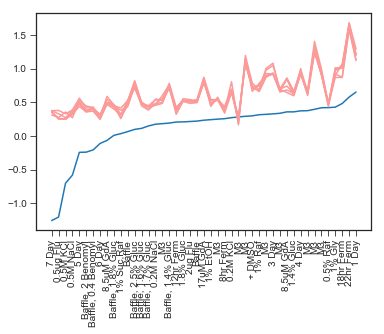

In [221]:
other_gene_list = np.unique([gene for gene in this_data[this_data['barcode'].isin(list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]['mutation_type'].values if gene not in gene_list])
fig,ax = plt.subplots()

weird_d_data = this_data[this_data['barcode'].isin(weird_diploids)]

all_cols = list(sorted_m3_cols) + list(sorted_nonm3_cols)
all_cols = list(m3_cols) + list(nonm3_cols)

for gene in ['Diploid + Chr12Amp']:
    this_gene = this_data[this_data['mutation_type'].isin([gene])]
    old_mean = np.mean(this_gene[all_cols].values.swapaxes(0,1),axis=1)
    all_cols = np.asarray(all_cols)[np.argsort(old_mean)] # sort the columns
    mean = np.mean(this_gene[all_cols].values.swapaxes(0,1),axis=1)

    std = np.std(this_gene[all_cols].values.swapaxes(0,1),axis=1)
    plt.plot(this_gene[all_cols].values.swapaxes(0,1))
#     plt.plot(mean,color=tools.mutant_colorset[gene])
#     plt.plot(mean-2*std,color=tools.mutant_colorset[gene],alpha=0.5)
#     plt.plot(mean+2*std,color=tools.mutant_colorset[gene],alpha=0.5)
#     plt.fill_between(range(len(all_cols)), mean-2*std, mean+2*std,color=tools.mutant_colorset[gene],alpha=0.1)



weird_diploids = [4791,15337,19297,40865,148821,189102]
plt.plot(this_bc_data,color=mutant_colorset['Diploid_adaptive'])
# plt.plot(np.mean(this_bc_data,axis=1),color='blue')
    


# amp_diploids = this_data[this_data['gene'].isin(['Diploid + Chr11Amp'])]
# for bc in range(amp_diploids.shape[0]):
#     plt.plot(amp_diploids[all_cols].values[bc,:],'gray')
    
# amp_diploids = this_data[this_data['gene'].isin(['Diploid + Chr12Amp'])]
# for bc in range(amp_diploids.shape[0]):
#     plt.plot(amp_diploids[all_cols].values[bc,:],'k')
    
# ira1_diploids = this_data[this_data['gene'].isin(['Diploid + IRA1'])]
# for bc in range(ira1_diploids.shape[0]):
#     plt.plot(ira1_diploids[all_cols].values[bc,:],'b')
    

plt.xticks(range(len(all_cols)),[renamed_conditions[col.split('_fitness')[0]] for col in (all_cols)],rotation=90)
# graphs.fitness_featured_genes_figure(ax,this_data,minimal_training_bcs,minimal_testing_bcs,m3_conditions,nonm3_conditions,other_gene_list,
#                                      ymin=-1.25,ymax=1.5,yticknum=12,median=False,legend=True,legend_cols=2,color_alpha=0.25,gray_alpha=0.05)
plt.savefig('weird_diploids_vs_chr12_sorted.pdf',bbox_inches='tight')



In [ ]:
### cluster conditions by similarity as separate 

this_set = 'subtle_to_strong_wothers'

import scipy.cluster.hierarchy as hier

starting_index = 0
model = 3

# used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]

these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets[this_set]['mut_locs'][model][these_indices,starting_index:]

clustering_methods = {'ward':1.0,
                     'average':0.1,
                    }

dist = distance.pdist(these_locs)

for method,thresh in clustering_methods.items():

    z = hier.linkage(dist,method=method,optimal_ordering=True)
    # z = hier.average(dist)
#     o = hier.fcluster(z,2)

    plt.figure(figsize=(25,5))
    
    gene_names = this_data[this_data['barcode'].isin(these_bcs)]['mutation_type'].values

    gene_bc_names = [(g,b) for g,b in zip(gene_names,these_bcs)]

    hier.dendrogram(z,color_threshold=thresh,labels=gene_bc_names)
    plt.savefig(f'cluster_dendogram_mutants_{model+1}_{method}.pdf',bbox_inches='tight')
    
    plt.figure(figsize=(50,50))
    order = hier.leaves_list(z)
    new_dist = distance.squareform(dist)[order,:][:,order]
    plt.pcolormesh(new_dist)
    plt.xticks([i+0.5 for i in range(len(gene_bc_names))],np.asarray(gene_bc_names)[order],rotation=90)
    plt.yticks([i+0.5 for i in range(len(gene_bc_names))],np.asarray(gene_bc_names)[order])
    plt.savefig(f'pairwise_gene_distance_{model+1}_{method}.pdf',bbox_inches='tight')



#     clusters = {col:clus for col,clus in zip(all_cols,o)}

#     clusters = {col:clus for col,clus in zip(all_cols,o)}

# all_cols = m3_cols + nonm3_cols
# all_cols





In [176]:
def smoothsegment(seg, Nsmooth=100):
    return np.concatenate([[seg[0]], np.linspace(seg[1], seg[2], Nsmooth), [seg[3]]])

def plot_dendrogram(icoord,dcoord,labels,leaves,figsize, polar=False,gap=0.05,coloring=False,thresh=0.22,cmap=mutant_colorset):
    if polar:
        dcoord = -np.log(dcoord+1)
#         dcoord = 
#         thresh = -np.log(thresh+1)
        # avoid a wedge over the radial labels
#         gap = 0.05
        imax = icoord.max()
        imin = icoord.min()
        icoord = ((icoord - imin)/(imax - imin)*(1-gap) + gap/2)*2*np.pi
    with plt.style.context("seaborn-white"):
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, polar=polar)
#         ax = plt.subplot(111,polar=polar)
        for xs, ys in zip(icoord, dcoord):
            if polar:
                xs = smoothsegment(xs)
                ys = smoothsegment(ys)
                
#             if coloring:
#                 if ys < 
#             else:
                
            ax.plot(xs,ys, color="black")

        if polar:
            ax.spines['polar'].set_visible(False)
            ax.xaxis.grid(False)
            ax.set_rlabel_position(0)
            
            tick_locs = []
            for i,d in zip(icoord,dcoord):
                if d[0] == 0:
                    tick_locs.append(i[0])
                if d[3] == 0:
                    tick_locs.append(i[3])
        
            for label, angle, color in zip(labels, tick_locs, [cmap[key] for key in labels]):

                x = angle
                y = 0.02
                
                deg_angle = np.degrees(angle)

                if 90 < deg_angle < 180:
                    lab = ax.text(x,y,label,color=color,
                                  rotation=180+deg_angle,rotation_mode='anchor',
                                 ha='right',va='center')

                elif 180 <= deg_angle < 270: 
                    lab = ax.text(x,y,label,color=color,
                                  rotation=deg_angle-180,rotation_mode='anchor',
                                 ha='right',va='center')
                else:
                    lab = ax.text(x,y,label,color=color,
                                  rotation=deg_angle,rotation_mode='anchor',
                                 ha='left',va='center')

            ax.set_xticklabels([])
                


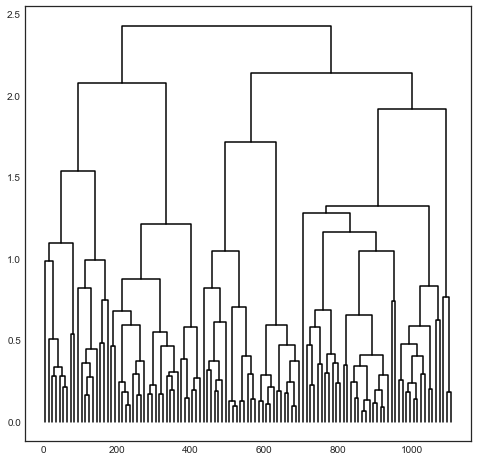

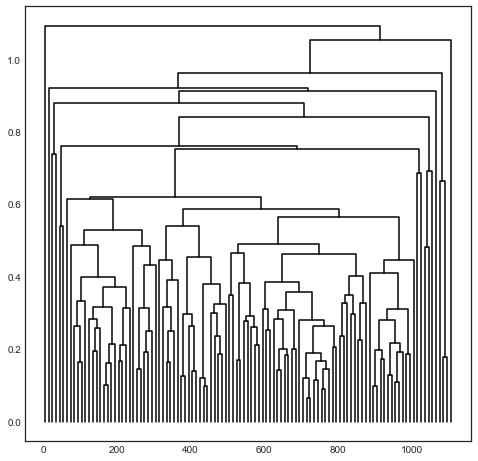

In [175]:
### cluster conditions by similarity as separate 

this_set = 'subtle_to_strong_wothers'

import scipy.cluster.hierarchy as hier

starting_index = 0
model = 8

# used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]

these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets[this_set]['mut_locs'][model][these_indices,starting_index:]

clustering_methods = {
                        'ward':1.0,
                     'average':0.1,
                    }

dist = distance.pdist(these_locs)

for method,thresh in clustering_methods.items():

    z = hier.linkage(dist,method=method,optimal_ordering=True)

    gene_names = this_data[this_data['barcode'].isin(these_bcs)]['mutation_type'].values

    gene_bc_names = [(g,b) for g,b in zip(gene_names,these_bcs)]


    R = hier.dendrogram(z,color_threshold=thresh,labels=gene_names,no_plot=True)
#     plt.savefig(f'cluster_dendogram_mutants_{model+1}_{method}.pdf',bbox_inches='tight')

    graphs.plot_dendrogram(np.asarray(R['icoord']),np.asarray(R['dcoord']),R['ivl'],R['leaves'],(8,8),polar=True)
    plt.savefig(f'cluster_dendogram_CIRCLE_mutants_{model+1}_{method}.pdf',bbox_inches='tight')





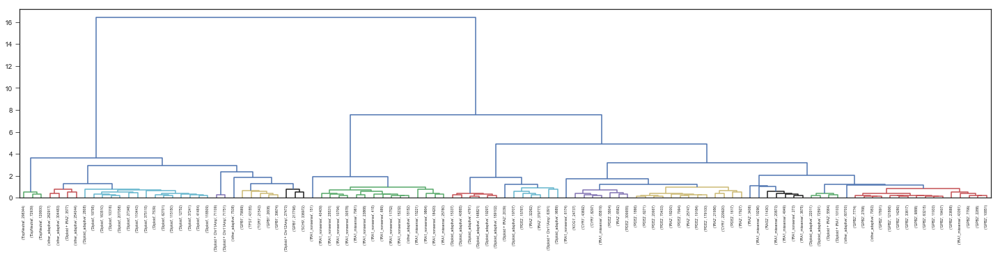

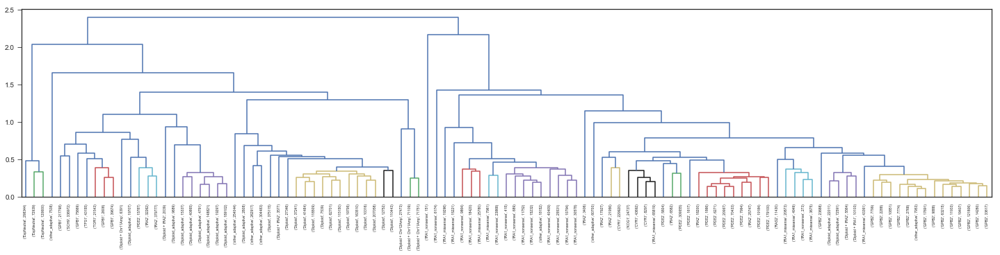

In [609]:
### cluster conditions by similarity as separate 

import scipy.cluster.hierarchy as hier

starting_index = 0

# used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]

these_indices = range(len(all_bcs))
these_bcs = all_bcs

these_locs = datasets[this_set]['mut_locs'][model][these_indices,starting_index:]
these_locs = this_data[this_data['barcode'].isin(these_bcs)][list(sorted_m3_cols)+list(sorted_nonm3_cols[:first_nonsubtle])].values

clustering_methods = {'ward':1.0,
                     'average':0.4,
                    }

dist = distance.pdist(these_locs)

for method,thresh in clustering_methods.items():

    z = hier.linkage(dist,method=method)
    # z = hier.average(dist)
    o = hier.fcluster(z,2)

    plt.figure(figsize=(25,5))
    
    gene_names = this_data[this_data['barcode'].isin(these_bcs)]['mutation_type'].values
    gene_bc_names = [(g,b) for g,b in zip(gene_names,these_bcs)]

    hier.dendrogram(z,color_threshold=thresh,labels=gene_bc_names)

#     plt.savefig(f'cluster_dendogram_mutants_bysubtlefitness_{method}_{starting_index}.pdf',bbox_inches='tight')

#     clusters = {col:clus for col,clus in zip(all_cols,o)}

#     clusters = {col:clus for col,clus in zip(all_cols,o)}

# all_cols = m3_cols + nonm3_cols
# all_cols

tsne = TSNE(perplexity=10.0)
embedded_locs = tsne.fit_transform(these_locs)


# tsne = TSNE(perplexity=10.0)
# embedded_locs = tsne.fit_transform(these_locs)
# print(pca.explained_variance_ratio_)


# plt.savefig(f'tSNE_10.pdf',bbox_inches='tight')



In [595]:
z = hier.linkage(dist,method='average')

default_color = 'gray'
plt.figure(figsize=(15,5))
link_cols = {}
# notes:
# * rows in Z correspond to "inverted U" links that connect clusters
# * rows are ordered by increasing distance
# * if the colors of the connected clusters match, use that color for link
for i, i12 in enumerate(z[:,:2].astype(int)):
    c1, c2 = (link_cols[x] if x > len(z) else mutant_colorset[gene_names[x]] for x in i12)
    link_cols[i+1+len(z)] = c1 if c1 == c2 else default_color
# Dendrogram

D = hier.dendrogram(z,orientation='top',labels=gene_names, color_threshold=None, link_color_func=lambda x: link_cols[x])
# sns.despine(right='off',top='off',bottom='on')

NameError: name 'hier' is not defined

In [85]:
all_cols[:25]

['M3_Batch_23_fitness',
 '19_fitness',
 'M3_Batch_18_fitness',
 'M3_Batch_20_fitness',
 'M3_Batch_3_fitness',
 'M3_Batch_13_fitness',
 'M3_Batch_6_fitness',
 '1BB_M3_fitness',
 'M3_Batch_21_fitness',
 '1BB_1.4%Gluc_fitness',
 'Ferm_44hr_Transfer_fitness',
 '1BB_1%Gly_fitness',
 '1BB_1.8%Gluc_fitness',
 '1BB_0.5%Raf_fitness',
 'Geldanamycin8.5uM_fitness',
 'Ferm_40hr_Transfer_fitness',
 '1BB_Baffle_fitness',
 '1.5%_fitness',
 'DMSO_fitness',
 '1BB_1%Raf_fitness',
 '1.7%_fitness',
 '1.6%_fitness',
 'Ferm_50hr_Transfer_fitness',
 '1.4%_fitness',
 '1BB_2ugFlu_fitness']

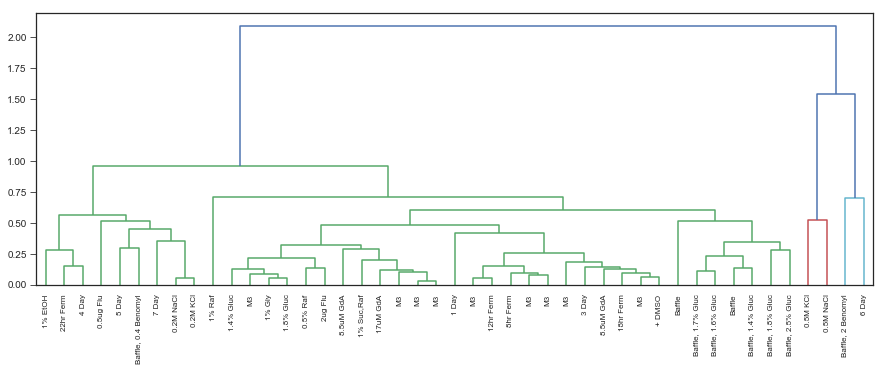

In [126]:
### cluster conditions by similarity as separtate 

import scipy.cluster.hierarchy as hier

# used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]

these_indices = range(len(all_bcs))
these_bcs = all_bcs
model = 3

these_locs = datasets['subtle_to_strong_wothers']['mut_locs'][model][these_indices,:]

these_locs = datasets['subtle_to_strong_wothers']['cond_locs'][model][:,:]
all_cols 

dist = distance.pdist(these_locs)

z = hier.ward(dist)

z = hier.average(dist)
o = hier.fcluster(z,2)

plt.figure(figsize=(15,5))
hier.dendrogram(z,color_threshold=1.0,labels=[renamed_conditions[col.replace('_fitness','')] for col in all_cols[:]])

# plt.savefig('cluster_dendogram_conditions_average.pdf',bbox_inches='tight')

clusters = {col:clus for col,clus in zip(all_cols,o)}

clusters = {col:clus for col,clus in zip(all_cols,o)}

# all_cols = m3_cols + nonm3_cols
# all_cols






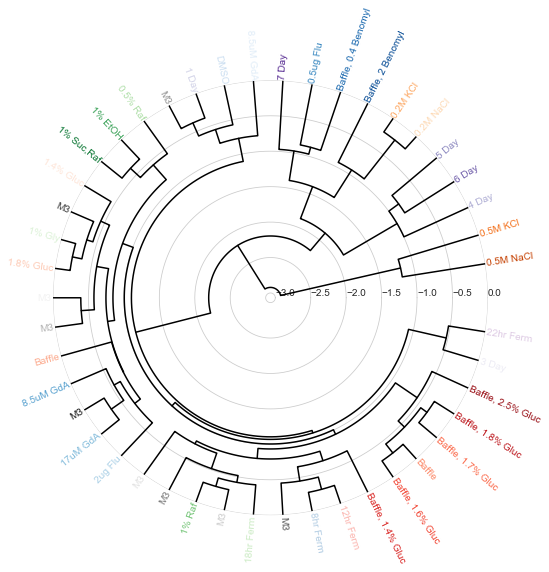

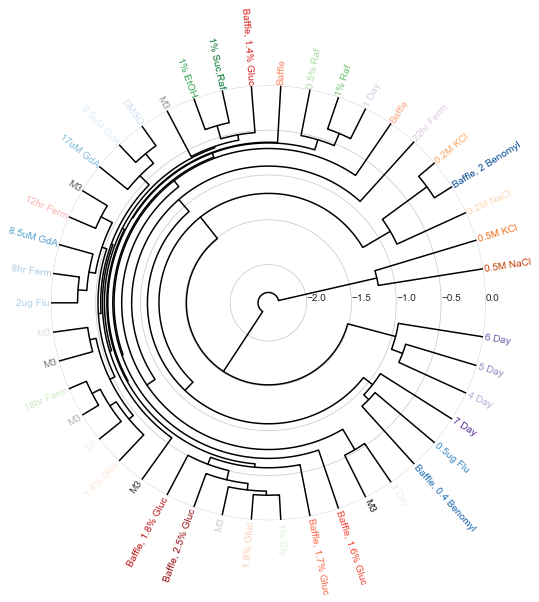

In [178]:
### cluster conditions by similarity as separate 

this_set = 'subtle_to_strong_wothers'

import scipy.cluster.hierarchy as hier

starting_index = 0
model = 8

# used_mutants = [bc for bc in this_data['barcode'].values if bc in (list(minimal_wothers_training_bcs) + list(minimal_wothers_testing_bcs))]
all_conditions = list(sorted_m3_cols) + list(sorted_nonm3_cols)
these_indices = range(len(all_conditions))
# these_bcs = all_bcs

these_locs = datasets[this_set]['cond_locs'][model][these_indices,starting_index:]

clustering_methods = {
                        'ward':1.0,
                     'average':0.1,
                    }

dist = distance.pdist(these_locs)

for method,thresh in clustering_methods.items():

    z = hier.linkage(dist,method=method,optimal_ordering=True)
    # z = hier.average(dist)
#     o = hier.fcluster(z,2)

#     plt.figure(figsize=(25,5))
    
    gene_names = this_data[this_data['barcode'].isin(these_bcs)]['mutation_type'].values

    gene_bc_names = [(g,b) for g,b in zip(gene_names,these_bcs)]
    cond_names = [col.replace('_fitness','') for col in all_conditions]
#     g

    R = hier.dendrogram(z,color_threshold=thresh,labels=cond_names,no_plot=True)
#     plt.savefig(f'cluster_dendogram_mutants_{model+1}_{method}.pdf',bbox_inches='tight')

    graphs.plot_dendrogram(np.asarray(R['icoord']),np.asarray(R['dcoord']),R['ivl'],R['leaves'],(8,8),polar=True,namemap=renamed_conditions,cmap=condition_colorset)
    plt.savefig(f'cluster_dendogram_CIRCLE_conditions_{model+1}_{method}.pdf',bbox_inches='tight')






In [120]:
tools.condition_colorset

{'13': (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
 '18': (1.0, 1.0, 0.6),
 '1BB_0.2MKCl': (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 '1BB_0.2MNaCl': (0.984313725490196, 0.6039215686274509, 0.6),
 '1BB_0.5%Raf': (1.0, 0.4980392156862745, 0.0),
 '1BB_0.5MKCl': (0.9921568627450981, 0.7490196078431373, 0.43529411764705883),
 '1BB_1%Gly': (0.792156862745098, 0.6980392156862745, 0.8392156862745098),
 '1BB_1%Raf': (0.0, 0.0, 0.0),
 '1BB_1.4%Gluc': (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 '1BB_1.8%Gluc': (0.2, 0.6274509803921569, 0.17254901960784313),
 '1BB_Baffle': (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 '1BB_M3': (0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 '20': (0.2196078431372549, 0.4235294117647059, 0.6901960784313725),
 '21': (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
 '23': (0.7490196078431373, 0.3568627450980392, 0.09019607843137253),
 '3': (0.4980392156862745, 

In [53]:
len(minimal_wothers_training_bcs)

36

In [54]:
len(minimal_wothers_testing_bcs)

75